<a href="https://colab.research.google.com/github/OlajideFemi/Carbon-Footprint/blob/main/Copy_of_Dissertation_Code_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install tensorflow

In [2]:
pip install geopandas

In [3]:
#import Library
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
import json
from sklearn import metrics
from sklearn.cluster import DBSCAN
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense


<center><h1> West Midlands' Carbon Footprint </h1></center>

### Understanding the Data

<!-- <ul> -->
<!--  <li><h2> Understanding the Data</h2></li> -->
<!--  <li>Handling Missing Values</li> -->
<!--  <li>Remove Duplicates</li> -->
<!--  <li>Standardize Formats</li> -->
<!--  <li>Handle Outliers</li> -->
<!--  <li>Validate and correct data</li>  -->
<!--  <li>Document Changes</li> -->
<!--  <li>Test and iterate</li> -->
<!--  <li>Maintain data provence</li>   -->     
<!-- </ul> -->




<!-- <P><a href="https://www.gov.uk/government/statistics/uks-carbon-footprint">https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/1166194/2005-21-uk-local-authority-ghg-emissions.xlsx'
</a></P> -->  

<b><P>Dataset:</b></P>
<p>
C. O'Sullivan, "UK local authority and regional greenhouse gas emissions national statistics: 2005-2021," Department of Business, Energy & Industrial Strategy, London, 2023.</p>
Accessed Date: 29 March, 2023
<P><b>Internet Repositories:</b></P>

<P><a href="https://www.gov.uk/government/statistics/uks-carbon-footprint">https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/1166194/2005-21-uk-local-authority-ghg-emissions.xlsx'
</a></P>



<b><P>Stored On:</b></P>

<P>https://olajidefemi.github.io</P>

<P><a href="GitHub">https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx
</a></P>


From exploration of the '1_1' sheet

 <p>Shape of the Data: The dataset contains 7106 rows and 50 columns.</p>
 <p>Summary of the Data:
   The dataset provides details for <b>12 unique regions</b>.
   There are data for 17 unique years, spanning from 2005 to 2021.
   Variables such as 'Industry Electricity', 'Industry Gas', and 'Industry Total'</p>





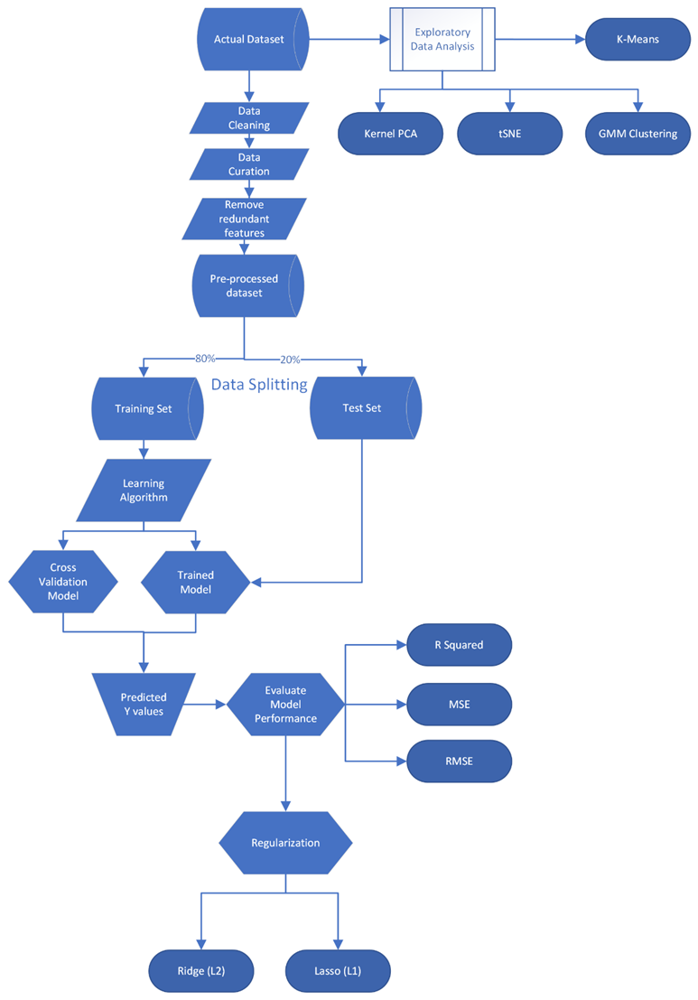

In [4]:
#Load the excel data on sheet 1_1
url = 'https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx'
data_1_1 = pd.read_excel(url, sheet_name='1_1')
data_1_1.head()


,Table 1.1: Local Authority territorial greenhouse gas emissions estimates 2005-2021 (kt CO2e) - Full dataset,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49
0,This worksheet contains one table. The table c...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Freeze panes are active on this sheet. To turn...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Filters are active in cells A5 to AX5 and may ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
4,North East,Darlington,Darlington,E06000005,2005,51.87311,114.701874,0.045681,43.073543,209.694209,...,12.699185,63.7069,34.256022,5.613394,39.869415,968.661604,100.287,9.658895,197.4758,4.905217


In [5]:
# Extract the actual data, excluding the header information
data_1_1_actual = data_1_1.iloc[4:]

# Set the column names from the header row
data_1_1_actual.columns = data_1_1.iloc[3]

In [6]:
data_1_1_actual

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
4,North East,Darlington,Darlington,E06000005,2005,51.87311,114.701874,0.045681,43.073543,209.694209,...,12.699185,63.7069,34.256022,5.613394,39.869415,968.661604,100.287,9.658895,197.4758,4.905217
5,North East,Darlington,Darlington,E06000005,2006,55.398988,97.614091,0.065836,42.086928,195.165842,...,11.659759,59.927177,31.802024,6.57408,38.376104,943.627506,101.509,9.295998,197.4758,4.778446
6,North East,Darlington,Darlington,E06000005,2007,52.249398,95.167732,0.074503,43.79521,191.286843,...,12.166507,59.716732,37.048534,6.81813,43.866664,925.275164,102.632,9.015465,197.4758,4.685512
7,North East,Darlington,Darlington,E06000005,2008,51.651166,95.266031,0.055964,35.982972,182.956132,...,12.55795,59.566044,7.662955,6.771385,14.43434,876.045542,103.694,8.448373,197.4758,4.436217
8,North East,Darlington,Darlington,E06000005,2009,45.607413,82.045964,1.061014,26.863721,155.578112,...,11.405542,57.689627,16.001037,6.053694,22.054731,805.592471,104.355,7.71973,197.4758,4.079449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7105,National Total,National Total,National Total,NaN,2017,18256.184881,15602.265158,33619.941766,17990.618473,85469.010278,...,9689.245642,51301.203756,15821.005923,5131.240623,20952.246546,437824.383087,66067.257699,6.62695,248717.5706,1.760328
7106,National Total,National Total,National Total,NaN,2018,20997.236163,19161.407779,32309.811618,17713.459471,90181.915031,...,9573.565596,51380.522611,15911.984565,5088.278772,21000.263337,430745.509283,66371.006647,6.489965,248717.5706,1.731866
7107,National Total,National Total,National Total,NaN,2019,18512.578663,18433.106892,31951.4012,17364.788398,86261.875153,...,9770.415392,50706.546836,15684.547926,5035.738233,20720.286159,416856.663324,66769.633181,6.243207,248717.5706,1.676024
7108,National Total,National Total,National Total,NaN,2020,15164.001049,17463.024978,30135.710515,17584.10729,80346.843833,...,8890.946812,49220.899615,14304.397217,4915.16683,19219.564047,376807.810496,67044.605507,5.620255,248717.5706,1.515003


In [7]:
# Reset the index for the actual data
data_1_1_actual = data_1_1_actual.reset_index(drop=True)
data_1_1_actual

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
0,North East,Darlington,Darlington,E06000005,2005,51.87311,114.701874,0.045681,43.073543,209.694209,...,12.699185,63.7069,34.256022,5.613394,39.869415,968.661604,100.287,9.658895,197.4758,4.905217
1,North East,Darlington,Darlington,E06000005,2006,55.398988,97.614091,0.065836,42.086928,195.165842,...,11.659759,59.927177,31.802024,6.57408,38.376104,943.627506,101.509,9.295998,197.4758,4.778446
2,North East,Darlington,Darlington,E06000005,2007,52.249398,95.167732,0.074503,43.79521,191.286843,...,12.166507,59.716732,37.048534,6.81813,43.866664,925.275164,102.632,9.015465,197.4758,4.685512
3,North East,Darlington,Darlington,E06000005,2008,51.651166,95.266031,0.055964,35.982972,182.956132,...,12.55795,59.566044,7.662955,6.771385,14.43434,876.045542,103.694,8.448373,197.4758,4.436217
4,North East,Darlington,Darlington,E06000005,2009,45.607413,82.045964,1.061014,26.863721,155.578112,...,11.405542,57.689627,16.001037,6.053694,22.054731,805.592471,104.355,7.71973,197.4758,4.079449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7101,National Total,National Total,National Total,NaN,2017,18256.184881,15602.265158,33619.941766,17990.618473,85469.010278,...,9689.245642,51301.203756,15821.005923,5131.240623,20952.246546,437824.383087,66067.257699,6.62695,248717.5706,1.760328
7102,National Total,National Total,National Total,NaN,2018,20997.236163,19161.407779,32309.811618,17713.459471,90181.915031,...,9573.565596,51380.522611,15911.984565,5088.278772,21000.263337,430745.509283,66371.006647,6.489965,248717.5706,1.731866
7103,National Total,National Total,National Total,NaN,2019,18512.578663,18433.106892,31951.4012,17364.788398,86261.875153,...,9770.415392,50706.546836,15684.547926,5035.738233,20720.286159,416856.663324,66769.633181,6.243207,248717.5706,1.676024
7104,National Total,National Total,National Total,NaN,2020,15164.001049,17463.024978,30135.710515,17584.10729,80346.843833,...,8890.946812,49220.899615,14304.397217,4915.16683,19219.564047,376807.810496,67044.605507,5.620255,248717.5706,1.515003


In [8]:
# Display the shape of the data
data_shape = data_1_1_actual.shape

data_shape

(7106, 50)

In [9]:
# Get a summary of the data
data_summary = data_1_1_actual.describe()

data_summary

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
count,7106,7106,7106,6358,7106,7106.00000,7106.0,7106.0,7106.0,7106.000000,...,7106.0,7106.0,7106.0,7106.0,7106.0,7106.000000,7106.0,7106.0,7106.0,7106.0
unique,27,194,418,374,17,7106.00000,7002.0,6118.0,7073.0,7106.000000,...,7073.0,7073.0,7090.0,7073.0,7090.0,7106.000000,7050.0,7073.0,417.0,7073.0
top,South East,Scotland,Darlington,E06000005,2005,51.87311,0.0,0.0,0.0,209.694209,...,0.0,0.0,0.0,0.0,0.0,968.661604,0.0,0.0,0.0,0.0
freq,1190,544,17,17,418,1.00000,105.0,925.0,34.0,1.000000,...,34.0,34.0,17.0,34.0,17.0,1.000000,34.0,34.0,34.0,34.0


In [10]:
# Get a view of the datatypes

data_types = data_1_1_actual.dtypes
data_types

3
Region/Country                            object
Second Tier Authority                     object
Local Authority                           object
Local Authority Code                      object
Calendar Year                             object
Industry Electricity                      object
Industry Gas                              object
Large Industrial Installations            object
Industry 'Other'                          object
Industry Total                            object
Commercial Electricity                    object
Commercial Gas                            object
Commercial 'Other'                        object
Commercial Total                          object
Public Sector Electricity                 object
Public Sector Gas                         object
Public Sector 'Other'                     object
Public Sector Total                       object
Domestic Electricity                      object
Domestic Gas                              object
Domestic 'Other'  

In [11]:
# Check for missing values
missing_values = data_1_1_actual.isnull().sum()

missing_values

3
Region/Country                              0
Second Tier Authority                       0
Local Authority                             0
Local Authority Code                      748
Calendar Year                               0
Industry Electricity                        0
Industry Gas                                0
Large Industrial Installations              0
Industry 'Other'                            0
Industry Total                              0
Commercial Electricity                      0
Commercial Gas                              0
Commercial 'Other'                          0
Commercial Total                            0
Public Sector Electricity                   0
Public Sector Gas                           0
Public Sector 'Other'                       0
Public Sector Total                         0
Domestic Electricity                        0
Domestic Gas                                0
Domestic 'Other'                            0
Domestic Total                  

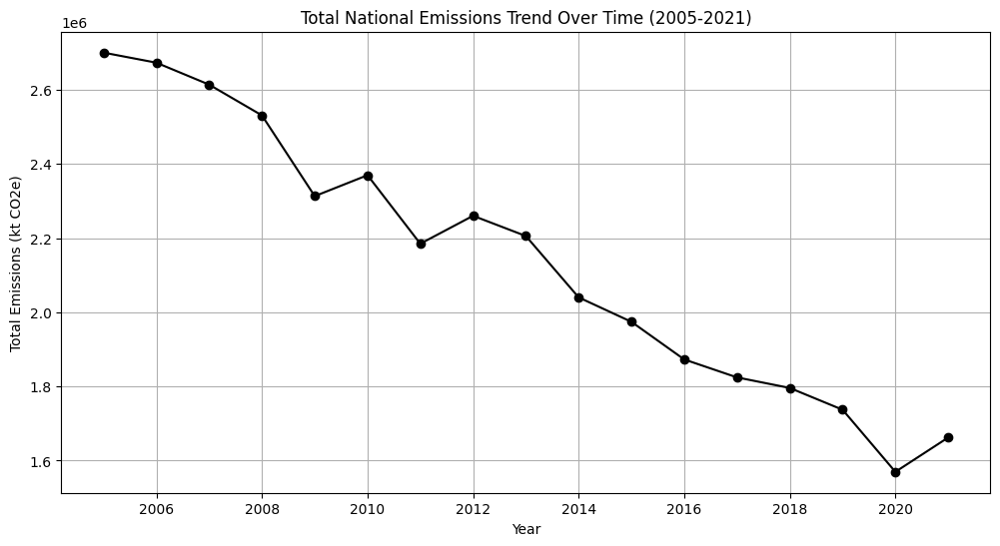

In [12]:
import matplotlib.pyplot as plt

# Group by 'Calendar Year' and sum the 'Grand Total' column to get total emissions for each year
yearly_emissions = data_1_1_actual.groupby('Calendar Year')['Grand Total'].sum()

# Plotting the trend over time
plt.figure(figsize=(12, 6))
yearly_emissions.plot(marker='o', linestyle='-', color='black')
plt.title('Total National Emissions Trend Over Time (2005-2021)')
plt.xlabel('Year')
plt.ylabel('Total Emissions (kt CO2e)')
plt.grid(True)
plt.show()

In [13]:
# Convert the 'Grand Total' column to a numeric type
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.to_numeric.html
data_1_1_actual['Grand Total'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce')

# Group by 'Local Authority Region/Country' and sum the 'Grand Total' column to get total emissions for each region again
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html
regional_emissions = data_1_1_actual.groupby('Region/Country')['Grand Total'].sum()

# Sort the regional emissions in descending order and get the name of the first region
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sort_values.html
highest_emission_region = regional_emissions.sort_values(ascending=False).index[0]
highest_emission_value = regional_emissions.sort_values(ascending=False).iloc[0]

# Sort the regional emissions in ascending order and get the name of the first region
#https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.iloc.html
lowest_emission_region = regional_emissions.sort_values(ascending=True).index[0]
lowest_emission_value = regional_emissions.sort_values(ascending=True).iloc[0]

# Results
highest_emission_region, highest_emission_value, lowest_emission_region, lowest_emission_value


('National Total', 8763483.862937795, 'Unallocated', 70997.7272303627)

In [14]:
regional_emissions

Region/Country
East Midlands                     1.246579e+06
East Midlands Total               6.759135e+05
East of England                   1.518514e+06
East of England Total             7.986982e+05
England Total                     6.830838e+06
London                            7.105470e+05
London Total                      7.105470e+05
National Total                    8.763484e+06
North East                        4.513099e+05
North East Total                  4.513099e+05
North West                        1.419484e+06
North West Total                  9.620017e+05
Northern Ireland                  3.910081e+05
Northern Ireland Total            3.910081e+05
Scotland                          8.602071e+05
Scotland Total                    8.602071e+05
South East                        1.713013e+06
South East Total                  1.001996e+06
South West                        1.073928e+06
South West Total                  6.987242e+05
Unallocated                       7.099773e+0

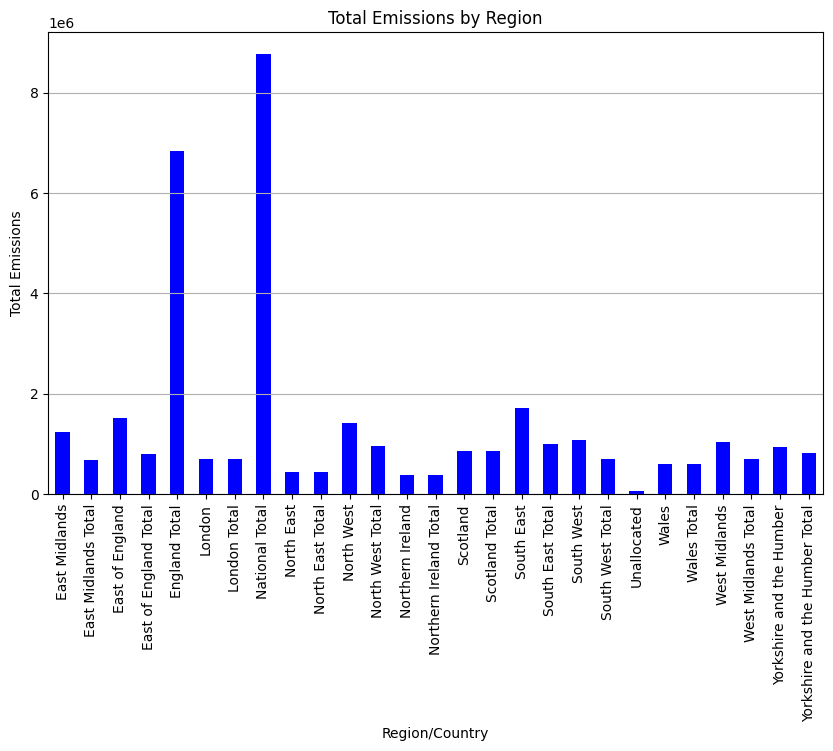

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
regional_emissions.plot(kind='bar', color='blue')
plt.title('Total Emissions by Region')
plt.xlabel('Region/Country')
plt.ylabel('Total Emissions')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [16]:
# Drop 'National Total','England Total' and 'Unallocated' from the Series
regional_emissions = regional_emissions.drop(labels=['National Total','England Total', 'Unallocated'])

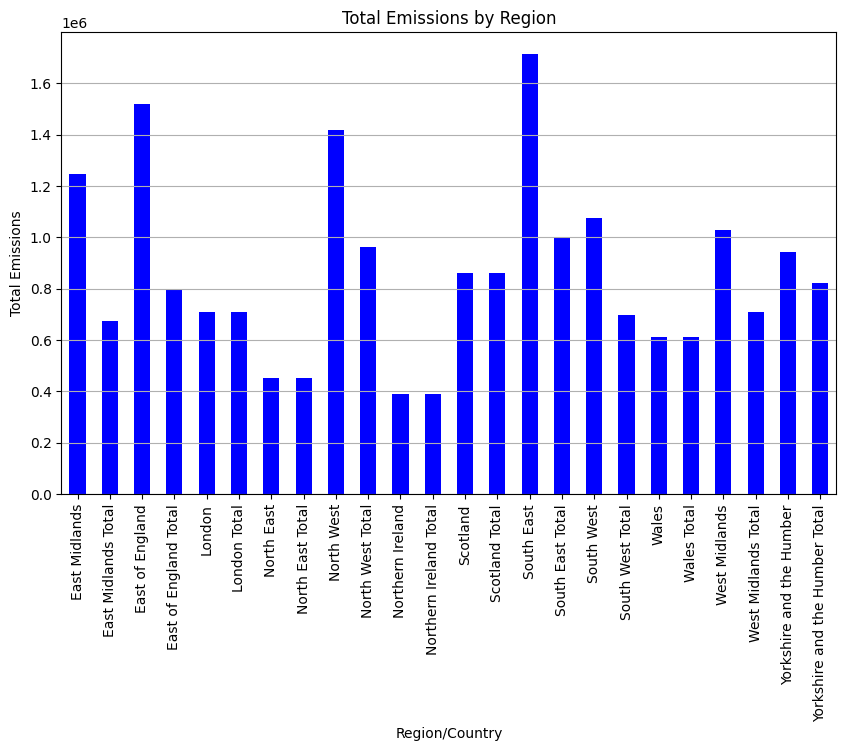

In [17]:
plt.figure(figsize=(10, 6))
regional_emissions.plot(kind='bar', color='blue')
plt.title('Total Emissions by Region')
plt.xlabel('Region/Country')
plt.ylabel('Total Emissions')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [18]:
# Convert the 'Grand Total' column to a numeric type
data_1_1_actual['Grand Total'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce')

# Filter out rows where 'Region/Country' ends with 'Total' or is 'Unallocated'
data_1_1_filtered = data_1_1_actual[
    ~data_1_1_actual['Region/Country'].str.endswith('Total') &
    ~data_1_1_actual['Region/Country'].str.contains('Unallocated', case=False)
]

# Group by 'Region/Country' and sum the 'Grand Total' column
regional_emissions = data_1_1_filtered.groupby('Region/Country')['Grand Total'].sum()

# Identify the regions with the highest and lowest cumulative emissions
highest_emission_region = regional_emissions.idxmax()
lowest_emission_region = regional_emissions.idxmin()

# Get the corresponding values for the highest and lowest emissions
highest_emission_value = regional_emissions[highest_emission_region]
lowest_emission_value = regional_emissions[lowest_emission_region]

# Output the results
(highest_emission_region, highest_emission_value, lowest_emission_region, lowest_emission_value)

('South East', 1713012.733123874, 'Northern Ireland', 391008.14327239833)

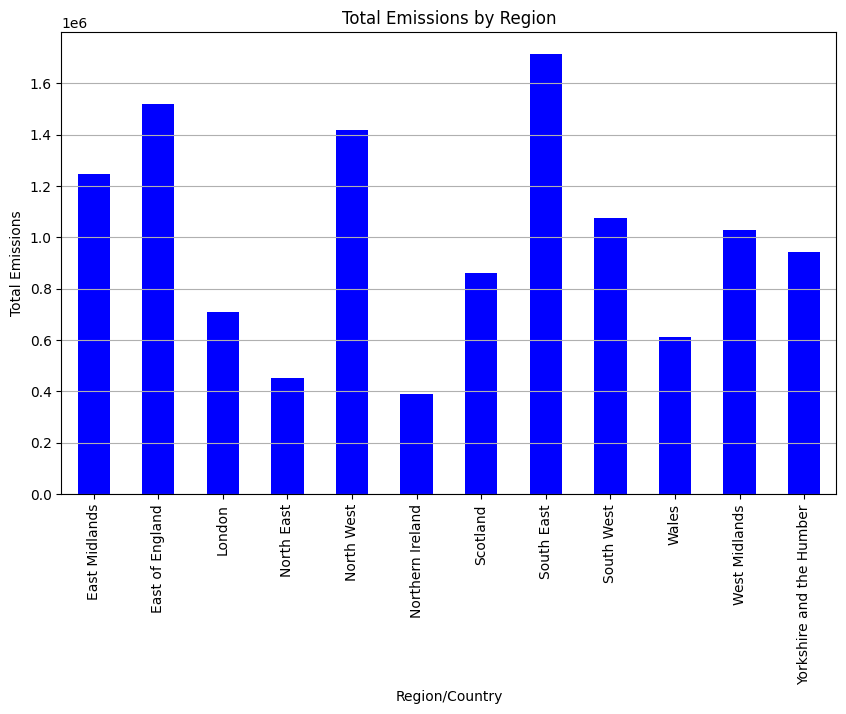

In [19]:
import matplotlib.pyplot as plt

# regional_emissions
# regional_emissions = data_1_1_filtered.groupby('Region/Country')['Grand Total'].sum()

plt.figure(figsize=(10, 6))
regional_emissions.plot(kind='bar', color='blue')
plt.title('Total Emissions by Region')
plt.xlabel('Region/Country')
plt.ylabel('Total Emissions')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [20]:
regional_emissions

Region/Country
East Midlands               1.246579e+06
East of England             1.518514e+06
London                      7.105470e+05
North East                  4.513099e+05
North West                  1.419484e+06
Northern Ireland            3.910081e+05
Scotland                    8.602071e+05
South East                  1.713013e+06
South West                  1.073928e+06
Wales                       6.104329e+05
West Midlands               1.030287e+06
Yorkshire and the Humber    9.443414e+05
Name: Grand Total, dtype: float64

In [21]:
import geopandas as gpd
#file_path = 'uk_regions.geojson'
#file_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/uk_regions.geojson'
#uk_regions_gdf = gpd.read_file(file_path)
#uk_regions_gdf_head = uk_regions_gdf.head()


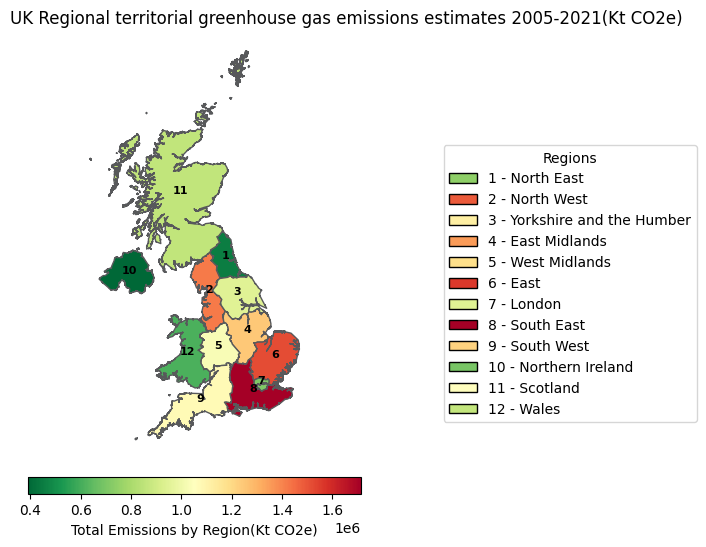

In [22]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

file_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/uk_regions.geojson'

uk_regions_gdf = gpd.read_file(file_path)

#emissions_data = {
#    "Region/Country": [
#        "East Midlands", "East of England", "London", "North East", "North West",
#        "Northern Ireland", "Scotland", "South East", "South West", "Wales",
#        "West Midlands", "Yorkshire and the Humber"
#    ],
#    "Grand Total": [
#        1.246579e+06, 1.518514e+06, 7.105470e+05, 4.513099e+05, 1.419484e+06,
#        3.910081e+05, 8.602071e+05, 1.713013e+06, 1.073928e+06, 6.104329e+05,
#        1.030287e+06, 9.443414e+05
#    ]
#}

emissions_df = regional_emissions.reset_index()
emissions_df.columns = ['Region/Country', 'Grand Total']

#emissions_df = pd.DataFrame(emissions_data)
emissions_df['Region/Country'] = emissions_df['Region/Country'].replace({'East of England': 'East'})

uk_regions_with_emissions = uk_regions_gdf.merge(emissions_df, left_on='rgn19nm', right_on='Region/Country', how='left')

uk_regions_with_emissions['Number'] = range(1, len(uk_regions_with_emissions) + 1)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
uk_regions_with_emissions.plot(column='Grand Total', ax=ax, cmap='RdYlGn_r', edgecolor='#58595B')

cmap = plt.cm.RdYlGn_r
norm = mcolors.Normalize(vmin=uk_regions_with_emissions['Grand Total'].min(), vmax=uk_regions_with_emissions['Grand Total'].max())

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Total Emissions by Region(Kt CO2e)')

for idx, row in uk_regions_with_emissions.iterrows():
    plt.annotate(text=str(row['Number']), xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                 horizontalalignment='center', fontweight='bold', color='black', fontsize=8)

legend_elements = [Patch(facecolor=plt.cm.RdYlGn_r(emission / uk_regions_with_emissions['Grand Total'].max()), edgecolor='black',
                         label=f"{number} - {region}") for number, region, emission in zip(uk_regions_with_emissions['Number'],
                         uk_regions_with_emissions['rgn19nm'], uk_regions_with_emissions['Grand Total'])]

ax.legend(handles=legend_elements, title="Regions", bbox_to_anchor=(1.55, 0.75), loc='upper left')

ax.set_title('UK Regional territorial greenhouse gas emissions estimates 2005-2021(Kt CO2e)', loc='left', position=(-0.3, 1))
plt.axis('off')
plt.show()


The term "**UK Regional Territorial Greenhouse Gas Emissions Estimates 2005-2021 (Kt CO2e)**" refers to statistical data that quantifies the amount of greenhouse gases emitted within the territorial boundaries of the United Kingdom's regions from the years 2005 to 2021. The data is expressed in kilotonnes of carbon dioxide equivalent (Kt CO2e)

**UK Regional**: This specifies that the data is broken down by different regions within the United Kingdom, such as England, Scotland, Wales, and Northern Ireland etc.

**Greenhouse Gas Emissions**: Greenhouse gases include carbon dioxide (CO2), methane (CH4), nitrous oxide (N2O), and fluorinated gases, all of which trap heat in the Earth's atmosphere, leading to global warming and climate change. The data encompasses all these types of emissions.

**Kt CO2e**: Kilotonnes of carbon dioxide equivalent is a standard unit of measurement that equates the impact of different greenhouse gases to the equivalent amount of CO2, based on their global warming potential (GWP). This unit allows for the combination of different greenhouse gases into a single figure that represents their overall impact on global warming.

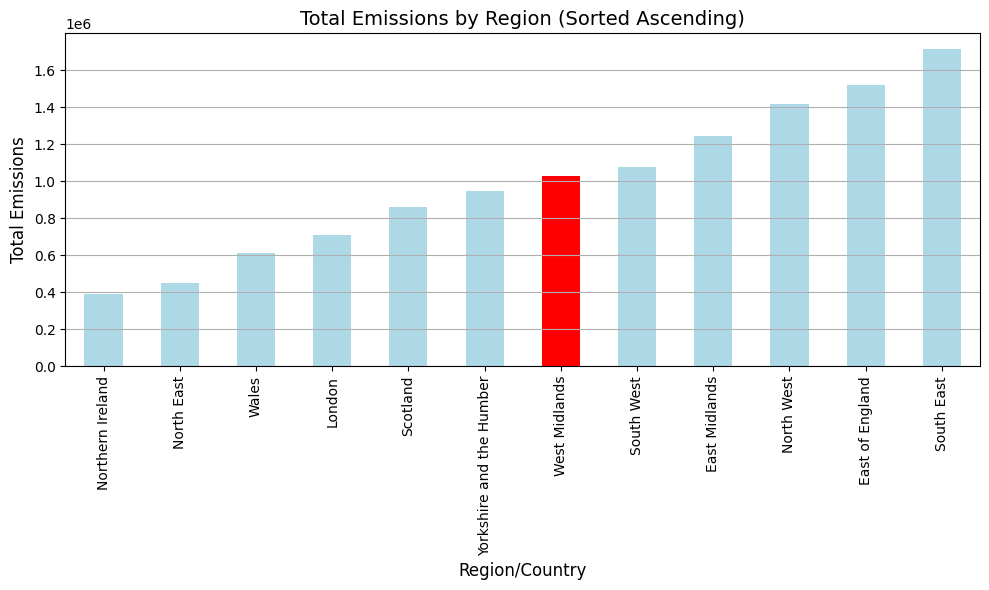

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

# Sort the series in ascending order for the plot
sorted_emissions = regional_emissions.sort_values()

colors = ['red' if region == 'West Midlands' else 'lightblue' for region in sorted_emissions.index]

# Create the bar plot
plt.figure(figsize=(10, 6))
sorted_emissions.plot(kind='bar', color=colors)

# Add titles and labels
plt.title('Total Emissions by Region (Sorted Ascending)', fontsize=14)
plt.xlabel('Region/Country', fontsize=12)
plt.ylabel('Total Emissions', fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

In [24]:
# Convert the 'Grand Total' column to a numeric type
data_1_1_actual['Grand Total'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce')

# Group by 'Region/Country' and sum the 'Grand Total' column
regional_emissions_total = data_1_1_actual.groupby('Region/Country')['Grand Total'].sum()

# Drop 'National Total' and 'Unallocated' from the Series
regional_emissions_total = regional_emissions_total.drop(labels=['National Total', 'Unallocated'])

# Identify the regions with the highest and lowest cumulative emissions
highest_emission_region = regional_emissions_total.idxmax()
lowest_emission_region = regional_emissions_total.idxmin()

# Get the corresponding values for the highest and lowest emissions
highest_emission_value = regional_emissions_total[highest_emission_region]
lowest_emission_value = regional_emissions_total[lowest_emission_region]

# Output the results
(highest_emission_region, highest_emission_value, lowest_emission_region, lowest_emission_value)

('England Total', 6830837.969058414, 'Northern Ireland', 391008.14327239833)

In [25]:
# Convert 'Grand Total' to numeric, coercing errors to NaN
data_1_1_actual['Grand Total'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce')

# Keep only rows where 'Region/Country' ends with 'total'
data_1_1_filtered = data_1_1_actual[
    data_1_1_actual['Region/Country'].str.lower().str.endswith('total')
]


# Group by 'Region/Country' and sum 'Grand Total' for remaining regions
regional_emissions_total = data_1_1_filtered.groupby('Region/Country')['Grand Total'].sum()

# Drop 'Unallocated' from the Series
#regional_emissions_total = regional_emissions_total.drop(labels=['Unallocated'])

# Drop 'National Total' from the Series
regional_emissions_total = regional_emissions_total.drop(labels=['National Total'])

# Drop 'England Total' from the Series
regional_emissions_total = regional_emissions_total.drop(labels=['England Total'])

# Identify the highest and lowest emission regions
highest_emission_region = regional_emissions_total.idxmax()
lowest_emission_region = regional_emissions_total.idxmin()

# Get the highest and lowest emission values
highest_emission_value = regional_emissions_total[highest_emission_region]
lowest_emission_value = regional_emissions_total[lowest_emission_region]

# Results
highest_emission_region, highest_emission_value, lowest_emission_region, lowest_emission_value

('South East Total',
 1001996.0574329,
 'Northern Ireland Total',
 391008.14327239833)

In [26]:
# Sort the regional emissions in descending order and get the name of the first region
highest_emission_region = regional_emissions.sort_values(ascending=False).index[0]
highest_emission_value = regional_emissions.sort_values(ascending=False).iloc[0]

# Sort the regional emissions in ascending order and get the name of the first region
lowest_emission_region = regional_emissions.sort_values(ascending=True).index[0]
lowest_emission_value = regional_emissions.sort_values(ascending=True).iloc[0]

# Results
highest_emission_region, highest_emission_value, lowest_emission_region, lowest_emission_value

('South East', 1713012.733123874, 'Northern Ireland', 391008.14327239833)

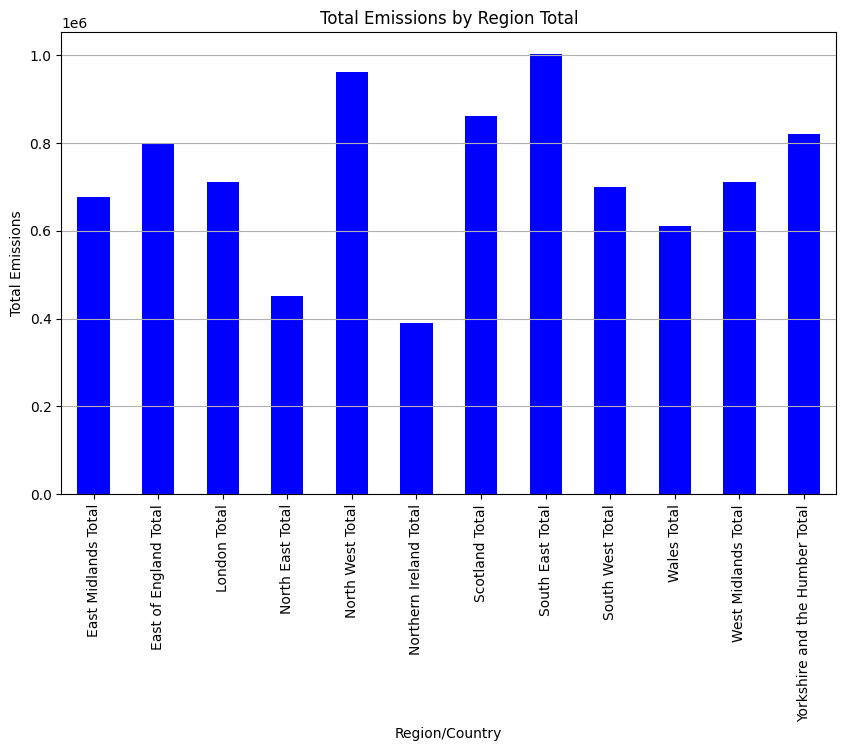

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
regional_emissions_total.plot(kind='bar', color='blue')
plt.title('Total Emissions by Region Total')
plt.xlabel('Region/Country')
plt.ylabel('Total Emissions')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.show()

In [28]:
regional_emissions_total

Region/Country
East Midlands Total               6.759135e+05
East of England Total             7.986982e+05
London Total                      7.105470e+05
North East Total                  4.513099e+05
North West Total                  9.620017e+05
Northern Ireland Total            3.910081e+05
Scotland Total                    8.602071e+05
South East Total                  1.001996e+06
South West Total                  6.987242e+05
Wales Total                       6.104329e+05
West Midlands Total               7.107770e+05
Yorkshire and the Humber Total    8.208705e+05
Name: Grand Total, dtype: float64

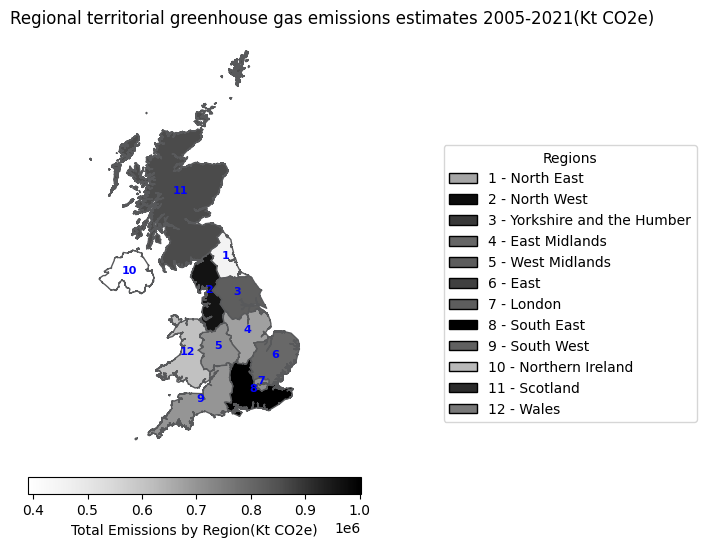

In [29]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

file_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/uk_regions.geojson'

uk_regions_gdf = gpd.read_file(file_path)

emissions_df = regional_emissions_total.reset_index()
emissions_df.columns = ['Region/Country', 'Grand Total']

#emissions_df['Region/Country'] = emissions_df['Region/Country'].replace({'East of England': 'East'})
replacements = {
    'East of England Total': 'East',
    'East Midlands Total': 'East Midlands',
    'London Total': 'London',
    'North East Total': 'North East',
    'North West Total': 'North West',
    'Northern Ireland Total': 'Northern Ireland',
    'Scotland Total': 'Scotland',
    'South East Total': 'South East',
    'South West Total': 'South West',
    'Wales Total': 'Wales',
    'West Midlands Total': 'West Midlands',
    'Yorkshire and the Humber Total': 'Yorkshire and the Humber'
}

emissions_df['Region/Country'] = emissions_df['Region/Country'].replace(replacements)



uk_regions_with_emissions = uk_regions_gdf.merge(emissions_df, left_on='rgn19nm', right_on='Region/Country', how='left')

uk_regions_with_emissions['Number'] = range(1, len(uk_regions_with_emissions) + 1)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
uk_regions_with_emissions.plot(column='Grand Total', ax=ax, cmap='Greys', edgecolor='#58595B')

cmap = plt.cm.Greys
norm = mcolors.Normalize(vmin=uk_regions_with_emissions['Grand Total'].min(), vmax=uk_regions_with_emissions['Grand Total'].max())

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Total Emissions by Region(Kt CO2e)')

for idx, row in uk_regions_with_emissions.iterrows():
    plt.annotate(text=str(row['Number']), xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                 horizontalalignment='center', fontweight='bold', color='blue', fontsize=8)

legend_elements = [Patch(facecolor=plt.cm.Greys(emission / uk_regions_with_emissions['Grand Total'].max()), edgecolor='black',
                         label=f"{number} - {region}") for number, region, emission in zip(uk_regions_with_emissions['Number'],
                         uk_regions_with_emissions['rgn19nm'], uk_regions_with_emissions['Grand Total'])]

ax.legend(handles=legend_elements, title="Regions", bbox_to_anchor=(1.55, 0.75), loc='upper left')

ax.set_title('Regional territorial greenhouse gas emissions estimates 2005-2021(Kt CO2e)', loc='left', position=(-0.3, 1))
plt.axis('off')
plt.show()


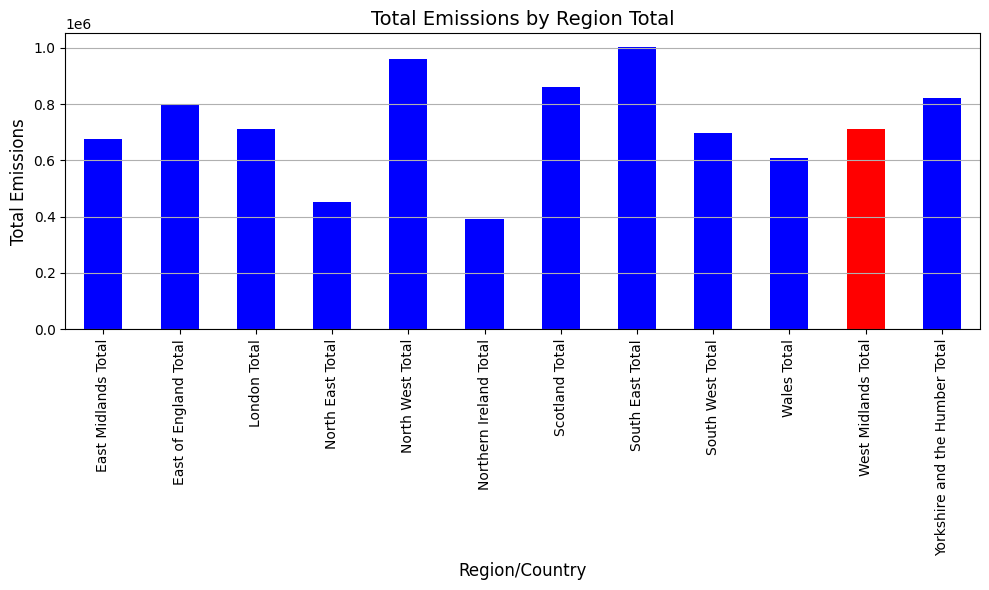

In [30]:
# Convert the dictionary to a pandas Series
emissions_series = pd.Series(regional_emissions_total)

colors = ['red' if region == 'West Midlands Total' else 'blue' for region in emissions_series.index]

# Create the bar plot
plt.figure(figsize=(10, 6))
emissions_series.plot(kind='bar', color=colors)

# Add titles and labels
plt.title('Total Emissions by Region Total', fontsize=14)
plt.xlabel('Region/Country', fontsize=12)
plt.ylabel('Total Emissions', fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y')
# plt.savefig('emissions_by_region_total.png')

# Show the plot
plt.tight_layout()
plt.show()

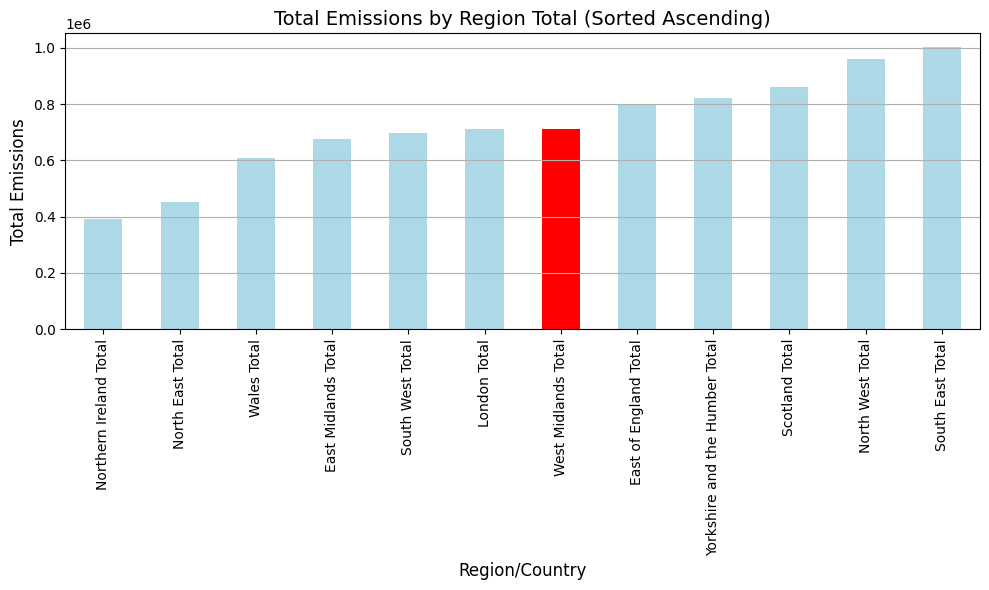

In [31]:
import matplotlib.pyplot as plt
import pandas as pd

# Sort the series in ascending order for the plot
sorted_emissions = regional_emissions_total.sort_values()

# Define the colors for the bars, 'red' for 'West Midlands Total', 'skyblue' for the rest
colors = ['red' if region == 'West Midlands Total' else 'lightblue' for region in sorted_emissions.index]

# Create the bar plot
plt.figure(figsize=(10, 6))
sorted_emissions.plot(kind='bar', color=colors)

# Add titles and labels
plt.title('Total Emissions by Region Total (Sorted Ascending)', fontsize=14)
plt.xlabel('Region/Country', fontsize=12)
plt.ylabel('Total Emissions', fontsize=12)
plt.xticks(rotation=90)
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

<h1>WestMidlands</h1>

In [32]:
# Filter the data for the "West Midlands" Region/Country
west_midlands_data = data_1_1_actual[data_1_1_actual['Region/Country'] == 'West Midlands']
west_midlands_data

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
2040,West Midlands,Birmingham,Birmingham,E08000025,2005,526.551509,366.037594,61.953269,261.620286,1216.162658,...,2.318744,15.128539,11.122149,43.552592,54.674741,7059.334372,1014.65,6.957408,267.7912,26.361338
2041,West Midlands,Birmingham,Birmingham,E08000025,2006,537.58464,325.085629,82.275024,254.186129,1199.131422,...,2.519812,15.762343,10.324532,48.716274,59.040806,6952.112034,1020.843,6.810168,267.7912,25.960943
2042,West Midlands,Birmingham,Birmingham,E08000025,2007,510.882763,311.246683,94.635887,259.93259,1176.697923,...,2.361162,15.055982,36.275553,50.047079,86.322633,6800.522322,1029.021,6.60873,267.7912,25.394869
2043,West Midlands,Birmingham,Birmingham,E08000025,2008,529.503396,305.588896,133.077044,207.353832,1175.523168,...,2.487657,14.784999,30.037779,48.617361,78.655141,6744.677640,1038.98,6.491634,267.7912,25.18633
2044,West Midlands,Birmingham,Birmingham,E08000025,2009,429.653608,281.346962,44.531193,182.413125,937.944889,...,2.289698,13.508004,159.413026,47.379221,206.792247,6099.737055,1050.072,5.808875,267.7912,22.777959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2596,West Midlands,Worcestershire Total,Worcestershire Total,NaN,2017,152.467092,116.944652,19.834311,217.425383,506.671438,...,68.894191,386.871084,216.880509,46.866939,263.747448,3987.637970,596.365709,6.686565,1740.5141,2.291069
2597,West Midlands,Worcestershire Total,Worcestershire Total,NaN,2018,172.838333,131.012733,21.624796,232.232283,557.708145,...,69.275392,405.306105,194.41849,46.092127,240.510617,3895.210521,600.345089,6.488286,1740.5141,2.237966
2598,West Midlands,Worcestershire Total,Worcestershire Total,NaN,2019,146.809055,137.062654,19.014284,197.144455,500.030448,...,72.29286,383.175445,194.909071,47.087417,241.996488,3745.219387,604.075264,6.199922,1740.5141,2.151789
2599,West Midlands,Worcestershire Total,Worcestershire Total,NaN,2020,121.875589,115.848439,15.014089,197.552499,450.290616,...,60.056299,359.954182,193.621385,44.625131,238.246516,3293.630698,606.317326,5.43219,1740.5141,1.892332


In [33]:
# Filter out rows where "Second Tier Authority" ends with "Total"
west_midlands_data_filtered = west_midlands_data[~west_midlands_data['Second Tier Authority'].str.endswith("Total")]
west_midlands_data_filtered


3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
2040,West Midlands,Birmingham,Birmingham,E08000025,2005,526.551509,366.037594,61.953269,261.620286,1216.162658,...,2.318744,15.128539,11.122149,43.552592,54.674741,7059.334372,1014.65,6.957408,267.7912,26.361338
2041,West Midlands,Birmingham,Birmingham,E08000025,2006,537.58464,325.085629,82.275024,254.186129,1199.131422,...,2.519812,15.762343,10.324532,48.716274,59.040806,6952.112034,1020.843,6.810168,267.7912,25.960943
2042,West Midlands,Birmingham,Birmingham,E08000025,2007,510.882763,311.246683,94.635887,259.93259,1176.697923,...,2.361162,15.055982,36.275553,50.047079,86.322633,6800.522322,1029.021,6.60873,267.7912,25.394869
2043,West Midlands,Birmingham,Birmingham,E08000025,2008,529.503396,305.588896,133.077044,207.353832,1175.523168,...,2.487657,14.784999,30.037779,48.617361,78.655141,6744.677640,1038.98,6.491634,267.7912,25.18633
2044,West Midlands,Birmingham,Birmingham,E08000025,2009,429.653608,281.346962,44.531193,182.413125,937.944889,...,2.289698,13.508004,159.413026,47.379221,206.792247,6099.737055,1050.072,5.808875,267.7912,22.777959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2579,West Midlands,Worcestershire,Wyre Forest,E07000239,2017,21.596821,10.207297,1.131147,48.643531,81.578795,...,6.365818,33.125984,35.766842,5.064742,40.831584,499.390383,101.886605,4.901433,195.4038,2.555684
2580,West Midlands,Worcestershire,Wyre Forest,E07000239,2018,26.603644,13.005476,1.125587,59.088112,99.82282,...,6.132734,32.343872,32.129977,5.063163,37.19314,489.710354,102.301938,4.786912,195.4038,2.506145
2581,West Midlands,Worcestershire,Wyre Forest,E07000239,2019,23.235559,17.494639,1.147332,42.889724,84.767255,...,6.015508,31.772339,31.502365,4.954569,36.456934,458.909804,102.485512,4.477802,195.4038,2.34852
2582,West Midlands,Worcestershire,Wyre Forest,E07000239,2020,17.900403,11.514084,1.128091,44.760307,75.302885,...,5.358702,30.189129,31.393792,4.728242,36.122034,408.559610,102.162048,3.999133,195.4038,2.090848


In [34]:
# Pivot table creation
pivot_table = pd.pivot_table(
    west_midlands_data_filtered,
    values=[
        'Commercial Total', 'Waste Management Total', 'Agriculture Total',
        'Transport Total', 'Domestic Total', 'Public Sector Total',
        'Industry Total', 'LULUCF Net Emissions','Emissions per km2 (kt CO2e)'
    ],
    index=['Calendar Year'],
    aggfunc=sum
)

# Transpose the pivot table to have categories as rows and years as columns
pivot_table_transposed = pivot_table.T

# Print the transposed pivot table
# print(pivot_table_transposed)
# pivot_table_transposed.to_csv('features_by_years.csv')

In [35]:
pivot_table

3,Agriculture Total,Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Public Sector Total,Transport Total,Waste Management Total
Calendar Year,,,,,,,,,
2005,4028.975542,5809.331253,13449.536094,289.942804,10110.465071,-317.593628,2157.052152,13501.323430,993.132504
2006,3977.611559,6076.632436,13583.317568,288.863353,10197.714268,-326.862871,2068.237300,13305.491246,982.898678
2007,3905.022430,5783.889127,13081.835599,286.449175,10138.235254,-364.168107,1940.546956,13427.290157,1704.174232
2008,3896.858302,5577.457160,13033.414716,274.077573,9265.801065,-409.084036,1836.585244,12933.307202,1555.034766
2009,3807.240767,4712.011264,11835.167963,252.942548,8063.486578,-410.381053,1569.812241,12494.989414,2215.670625
2010,3840.081371,5001.267074,12685.403118,265.708579,8605.356043,-416.001919,1702.472983,12409.032802,2569.207488
2011,3761.345066,4672.226863,11112.642004,244.269938,8053.840463,-437.639005,1543.437224,12275.012297,2099.168770
2012,3809.765776,4997.596854,11868.951211,250.674974,7934.255575,-405.366106,1655.926145,12166.688081,2004.062529
2013,3722.949528,4772.413248,11531.527193,245.219017,7930.368103,-444.516700,1632.970841,12070.626129,1965.555586


In [36]:
pivot_table_transposed

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
3,,,,,,,,,,,,,,,,,
Agriculture Total,4028.975542,3977.611559,3905.022430,3896.858302,3807.240767,3840.081371,3761.345066,3809.765776,3722.949528,3809.989355,3805.798780,3692.000037,3766.397313,3806.417076,3752.726686,3573.008128,3639.604571
Commercial Total,5809.331253,6076.632436,5783.889127,5577.457160,4712.011264,5001.267074,4672.226863,4997.596854,4772.413248,4075.739643,3700.093353,3288.671641,2555.056076,1707.805299,1378.760231,1094.025601,1289.487328
Domestic Total,13449.536094,13583.317568,13081.835599,13033.414716,11835.167963,12685.403118,11112.642004,11868.951211,11531.527193,9798.620535,9562.443689,9036.525528,8585.065579,8419.354441,8136.337663,7960.604044,8254.300582
Emissions per km2 (kt CO2e),289.942804,288.863353,286.449175,274.077573,252.942548,265.708579,244.269938,250.674974,245.219017,226.299273,221.343256,211.633827,205.073094,199.917735,189.296645,169.355461,181.918944
Industry Total,10110.465071,10197.714268,10138.235254,9265.801065,8063.486578,8605.356043,8053.840463,7934.255575,7930.368103,7683.166895,7258.445476,6871.729735,6795.989583,7338.841582,6823.598748,6329.377088,7025.526089
LULUCF Net Emissions,-317.593628,-326.862871,-364.168107,-409.084036,-410.381053,-416.001919,-437.639005,-405.366106,-444.516700,-443.113774,-467.135531,-419.905408,-447.164862,-432.569368,-457.906092,-461.502795,-458.060889
Public Sector Total,2157.052152,2068.237300,1940.546956,1836.585244,1569.812241,1702.472983,1543.437224,1655.926145,1632.970841,1407.210297,1343.820223,1185.686926,1247.662167,1400.427797,1289.674005,1210.227228,1333.317247
Transport Total,13501.323430,13305.491246,13427.290157,12933.307202,12494.989414,12409.032802,12275.012297,12166.688081,12070.626129,12321.712167,12586.051221,12802.317734,12775.515791,12562.288533,12222.766602,9941.294068,11009.606016
Waste Management Total,993.132504,982.898678,1704.174232,1555.034766,2215.670625,2569.207488,2099.168770,2004.062529,1965.555586,1760.419340,1781.099069,1976.630326,2203.734087,2002.438545,1934.145194,1725.606782,1643.074363


In [37]:
pivot_table_transposed.corr()

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Calendar Year,,,,,,,,,,,,,,,,,
2005,1.000000,0.999707,0.998732,0.998613,0.991479,0.991547,0.991912,0.993618,0.993859,0.983923,0.975687,0.961511,0.946135,0.939583,0.932480,0.947603,0.948853
2006,0.999707,1.000000,0.998403,0.998334,0.989789,0.990788,0.990035,0.992557,0.992489,0.980433,0.971191,0.955886,0.939172,0.931815,0.924216,0.940674,0.941725
2007,0.998732,0.998403,1.000000,0.998963,0.994393,0.994761,0.995211,0.995505,0.996049,0.987501,0.979535,0.966698,0.952439,0.945399,0.938189,0.951952,0.953161
2008,0.998613,0.998334,0.998963,1.000000,0.996148,0.996680,0.995657,0.997844,0.997708,0.986340,0.978960,0.965865,0.950809,0.941955,0.935568,0.950719,0.950351
2009,0.991479,0.989789,0.994393,0.996148,1.000000,0.998480,0.999338,0.999391,0.999718,0.993185,0.989331,0.980747,0.969569,0.959834,0.955375,0.966119,0.964785
2010,0.991547,0.990788,0.994761,0.996680,0.998480,1.000000,0.996746,0.998603,0.998446,0.986271,0.980466,0.969608,0.957166,0.947864,0.942720,0.958749,0.955883
2011,0.991912,0.990035,0.995211,0.995657,0.999338,0.996746,1.000000,0.998421,0.999245,0.996167,0.992308,0.984251,0.973556,0.964359,0.959465,0.967777,0.967906
2012,0.993618,0.992557,0.995505,0.997844,0.999391,0.998603,0.998421,1.000000,0.999808,0.990443,0.985482,0.975169,0.961938,0.950899,0.945959,0.958274,0.956731
2013,0.993859,0.992489,0.996049,0.997708,0.999718,0.998446,0.999245,0.999808,1.000000,0.992578,0.987924,0.978229,0.965972,0.956038,0.951104,0.962484,0.961484


https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.corr.html

In [38]:
pivot_table.corr()

3,Agriculture Total,Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Public Sector Total,Transport Total,Waste Management Total
3,,,,,,,,,
Agriculture Total,1.000000,0.775494,0.793451,0.860274,0.880980,0.833005,0.861581,0.852000,-0.477497
Commercial Total,0.775494,1.000000,0.959494,0.974504,0.866052,0.729578,0.847188,0.680485,-0.267074
Domestic Total,0.793451,0.959494,1.000000,0.983375,0.928145,0.796254,0.934487,0.608518,-0.313520
Emissions per km2 (kt CO2e),0.860274,0.974504,0.983375,1.000000,0.942496,0.818817,0.925586,0.732963,-0.321745
Industry Total,0.880980,0.866052,0.928145,0.942496,1.000000,0.889868,0.975990,0.684668,-0.527468
LULUCF Net Emissions,0.833005,0.729578,0.796254,0.818817,0.889868,1.000000,0.887573,0.665688,-0.608115
Public Sector Total,0.861581,0.847188,0.934487,0.925586,0.975990,0.887573,1.000000,0.604193,-0.542619
Transport Total,0.852000,0.680485,0.608518,0.732963,0.684668,0.665688,0.604193,1.000000,-0.237519
Waste Management Total,-0.477497,-0.267074,-0.313520,-0.321745,-0.527468,-0.608115,-0.542619,-0.237519,1.000000


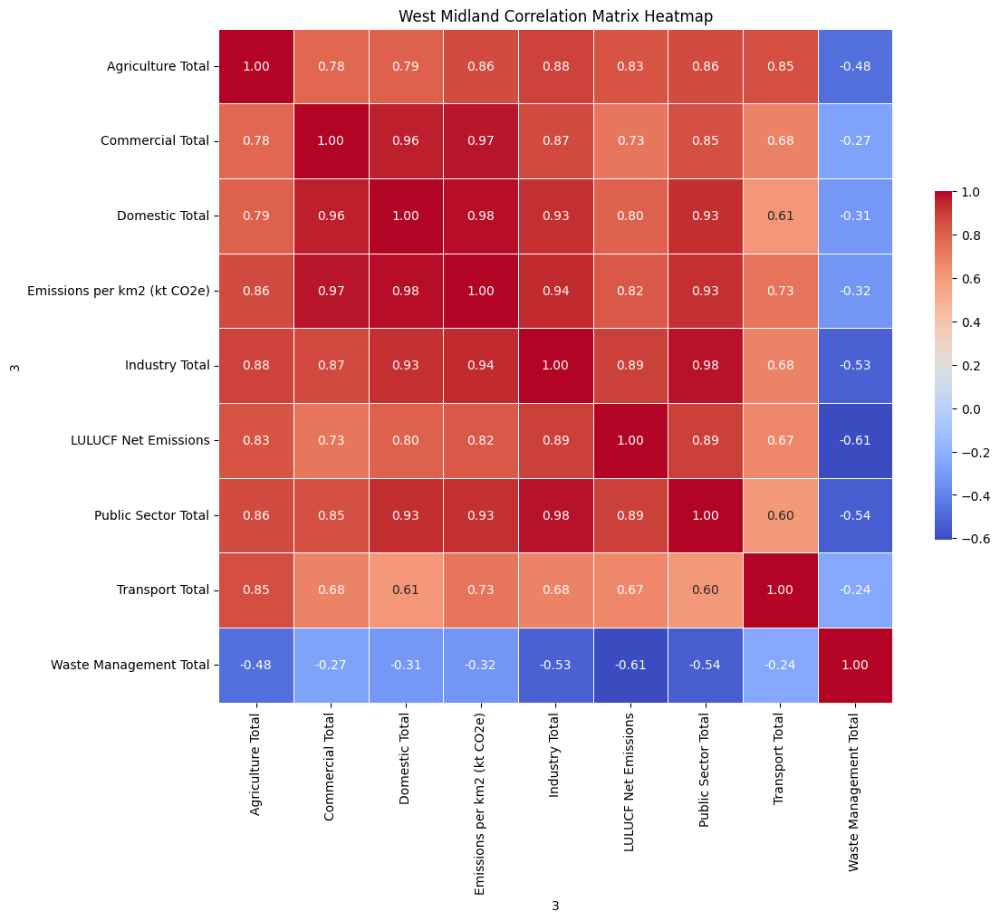

In [39]:
# Generate the correlation matrix
corr = pivot_table.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Add title
plt.title('West Midland Correlation Matrix Heatmap')

# Show the plot
plt.show()

Values close to 1 indicate a strong positive correlation, meaning that as one feature increases, the other tends to increase as well.

Values close to -1 indicate a strong negative correlation, meaning that as one feature increases, the other tends to decrease.

Values close to 0 indicate little to no linear relationship between the features.

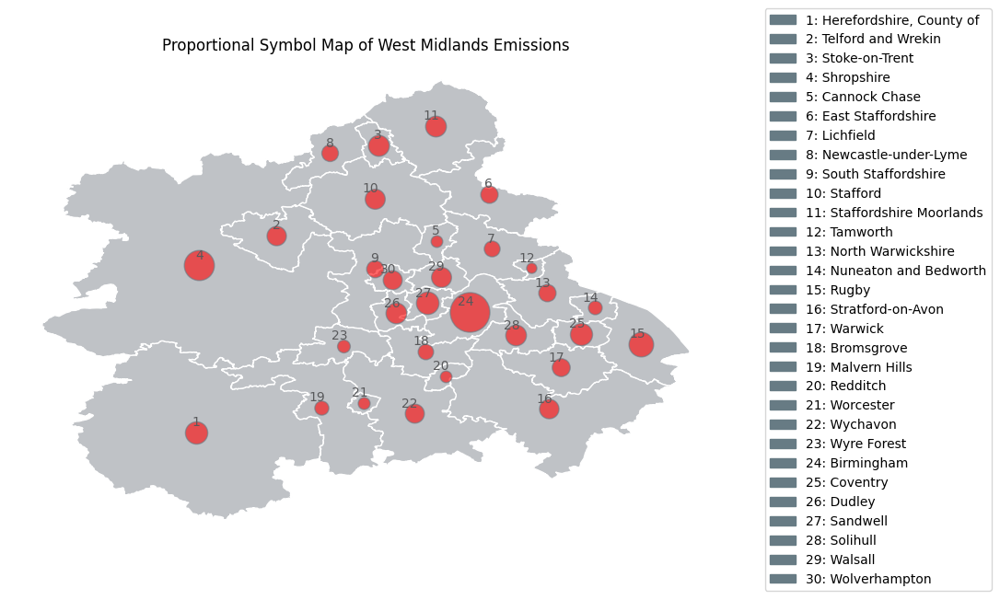

In [40]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)

topo_lad_gdf = gpd.GeoDataFrame(topo_lad_df, geometry=gpd.GeoSeries.from_wkt(topo_lad_df['geometry']))

areas_to_visualize = {
    "Local Authority": [
        "Birmingham", "Bromsgrove", "Cannock Chase", "Coventry", "Dudley",
        "East Staffordshire", "Herefordshire, County of", "Lichfield", "Malvern Hills",
        "Newcastle-under-Lyme", "North Warwickshire", "Nuneaton and Bedworth", "Redditch",
        "Rugby", "Sandwell", "Shropshire", "Solihull", "South Staffordshire",
        "Stafford", "Staffordshire Moorlands", "Stoke-on-Trent", "Stratford-on-Avon",
        "Tamworth", "Telford and Wrekin", "Walsall", "Warwick", "Wolverhampton",
        "Worcester", "Wychavon", "Wyre Forest"
    ],
    "Emissions": [
        96194.42, 14592.43, 8323.91, 29913.27, 26291.81,
        18530.12, 30369.14, 15314.26, 12044.33,
        16825.96, 18244.97, 11604.42, 8275.61,
        37092.39, 31099.31, 55209.7, 26119.39, 17940.00,
        24410.05, 26321.27, 26681.51, 23179.05,
        6411.41, 22889.89, 24428.08, 19614.43, 22070.84,
        8733.09, 22128.51, 9923.38
    ]
}

West_Midlands_emissions_df = pd.DataFrame(areas_to_visualize)

filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(areas_to_visualize["Local Authority"])]
filtered_gdf = filtered_gdf.merge(West_Midlands_emissions_df, left_on='LAD13NM', right_on='Local Authority')

filtered_gdf['ID'] = range(1, len(filtered_gdf) + 1)

fig, ax = plt.subplots(figsize=(10, 10))
filtered_gdf.plot(ax=ax, color='#BFC2C6', edgecolor='white')

filtered_gdf['centroid'] = filtered_gdf.geometry.centroid

for idx, row in filtered_gdf.iterrows():
    ax.scatter(row['centroid'].x, row['centroid'].y, s=row['Emissions'] / 100, edgecolor='#677B84', color='red', alpha=0.6)

if 'ID' in filtered_gdf.columns:
    for idx, row in filtered_gdf.iterrows():
        plt.annotate(text=row['ID'], xy=(row['centroid'].x, row['centroid'].y),
                     xytext=(3, 3), textcoords="offset points", color='#58595B',
                     horizontalalignment='right', verticalalignment='bottom')

from matplotlib.patches import Patch
legend_labels = [Patch(label=f'{row["ID"]}: {row["LAD13NM"]}', color = '#677B84') for idx, row in filtered_gdf.iterrows()]

plt.legend(handles=legend_labels, bbox_to_anchor=(1.05, 0.5), loc='center left')

ax.set_title('Proportional Symbol Map of West Midlands Emissions')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

ax.axis('off')
plt.show()


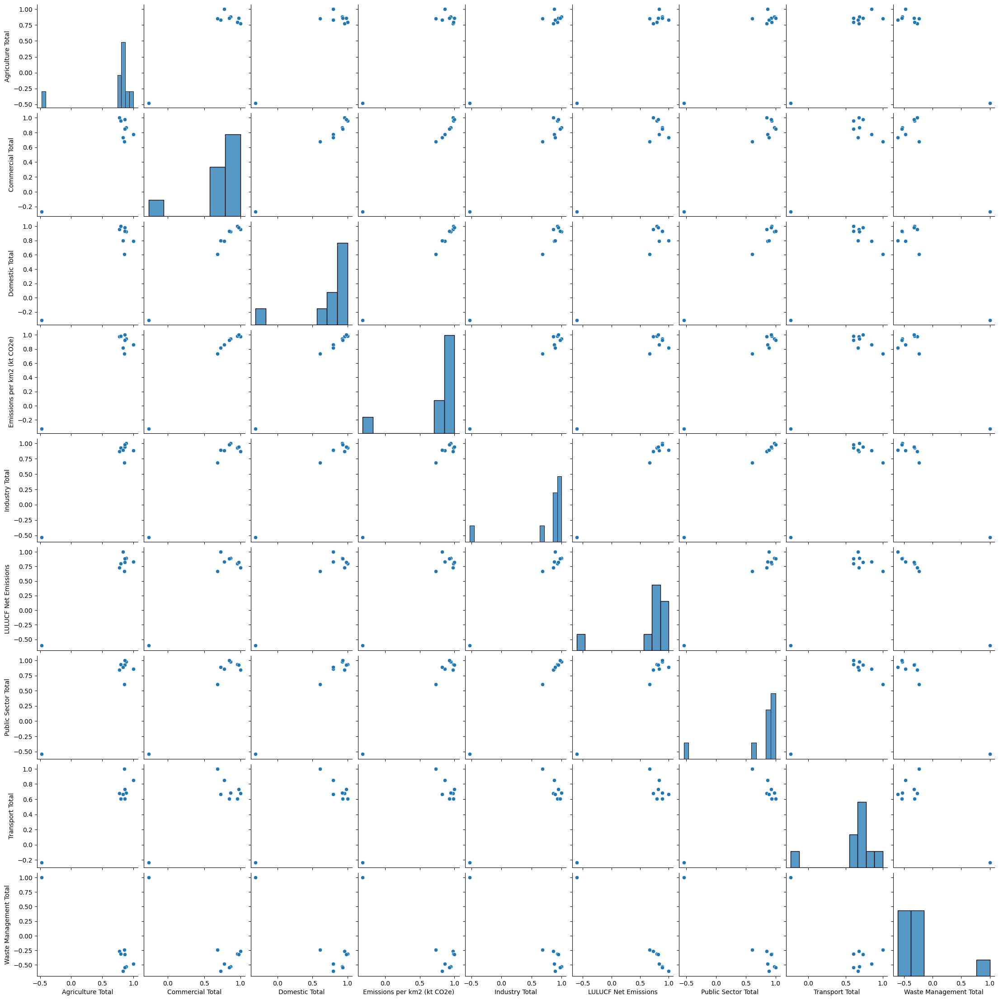

In [41]:
sns_plot = sns.pairplot(corr)
# Save the figure
sns_plot.savefig('pair_plot_features.png')

In [42]:
# List of columns to keep
columns_to_keep = ['Region/Country', 'Second Tier Authority', 'Local Authority', 'Local Authority Code', 'Calendar Year', 'LULUCF Net Emissions']
# Add columns that end with "Total"
columns_to_keep.extend([col for col in west_midlands_data_filtered.columns if col.endswith("Total")])



In [43]:
west_midlands_filtered_columns = west_midlands_data_filtered[columns_to_keep]

west_midlands_filtered_columns.to_csv('west_midlands_filtered_columns.csv')
west_midlands_filtered_columns

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,LULUCF Net Emissions,Industry Total,Commercial Total,Public Sector Total,Domestic Total,Transport Total,Agriculture Total,Waste Management Total,Grand Total
2040,West Midlands,Birmingham,Birmingham,E08000025,2005,13.873543,1216.162658,1170.441473,558.70517,2359.376951,1670.971299,15.128539,54.674741,7059.334372
2041,West Midlands,Birmingham,Birmingham,E08000025,2006,13.855886,1199.131422,1168.499559,519.502282,2365.574895,1610.744841,15.762343,59.040806,6952.112034
2042,West Midlands,Birmingham,Birmingham,E08000025,2007,13.477209,1176.697923,1111.410745,492.80575,2283.42429,1621.32779,15.055982,86.322633,6800.522322
2043,West Midlands,Birmingham,Birmingham,E08000025,2008,12.998567,1175.523168,1143.259246,489.438236,2284.490311,1545.527971,14.784999,78.655141,6744.677640
2044,West Midlands,Birmingham,Birmingham,E08000025,2009,12.151837,937.944889,945.363805,423.187511,2062.886425,1497.902337,13.508004,206.792247,6099.737055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2579,West Midlands,Worcestershire,Wyre Forest,E07000239,2017,-22.99366,81.578795,39.204973,18.44841,154.11273,155.081565,33.125984,40.831584,499.390383
2580,West Midlands,Worcestershire,Wyre Forest,E07000239,2018,-22.677647,99.82282,23.783474,18.025695,149.76546,151.453539,32.343872,37.19314,489.710354
2581,West Midlands,Worcestershire,Wyre Forest,E07000239,2019,-22.823968,84.767255,22.492546,15.106118,144.241608,146.896973,31.772339,36.456934,458.909804
2582,West Midlands,Worcestershire,Wyre Forest,E07000239,2020,-23.150931,75.302885,16.067331,14.061786,141.095909,118.871468,30.189129,36.122034,408.559610


https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.pivot_table.html

In [44]:
# Create the pivot table of west_midlands local authorities emission
west_midlands_local_authority_emissions = pd.pivot_table(west_midlands_filtered_columns, values='Grand Total', index=['Local Authority'], columns=['Calendar Year'])

west_midlands_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [45]:
import pandas as pd

# Calculate the yearly total emissions for each year
yearly_totals = west_midlands_local_authority_emissions.sum()

# Append the totals as a new row to the DataFrame
west_midlands_local_authority_emissions.loc['Total'] = yearly_totals

west_midlands_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [46]:
#sns.pairplot(west_midlands_local_authority_emissions)

In [47]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
data_transposed = west_midlands_local_authority_emissions

data_transposed

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [48]:
X = data_transposed.loc[:, 2005:2020]
y = data_transposed[2021]

In [49]:
test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=10)


In [50]:
# Train the model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Evaluate the model
print("Intercept:", regressor.intercept_)
print("Coefficients:", regressor.coef_)

# Predicting
y_pred = regressor.predict(X_test)

# Printing shapes of predictions and test labels
print(y_pred.shape, y_test.shape)

Intercept: 6.358880146775391
Coefficients: [-0.46276701  0.67328558  0.02979568 -0.1036658   0.22833449 -0.08693259
  0.27250066 -0.04820699 -0.75399125  0.09281595 -0.12834322  0.4178228
  0.71459305 -0.42653192 -0.53009634  1.15639934]
(7,) (7,)


In [51]:
X

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
Local Authority,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311


In [52]:
y

Local Authority
Birmingham                   4480.654084
Bromsgrove                    711.760256
Cannock Chase                 364.042820
Coventry                     1344.000349
Dudley                       1163.033149
East Staffordshire            853.521292
Herefordshire, County of     1472.865799
Lichfield                     754.890754
Malvern Hills                 601.444378
Newcastle-under-Lyme          844.190037
North Warwickshire            919.630410
Nuneaton and Bedworth         540.854821
Redditch                      357.787785
Rugby                        2026.454350
Sandwell                     1401.088684
Shropshire                   2773.370585
Solihull                     1226.181599
South Staffordshire           954.939263
Stafford                     1166.734395
Staffordshire Moorlands      1332.991944
Stoke-on-Trent               1127.356084
Stratford-on-Avon            1120.139928
Tamworth                      268.838288
Telford and Wrekin           1002.876199


In [53]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

west_midlands_local_authority_emissions

X = west_midlands_local_authority_emissions.loc[:, 2005:2020]
y = west_midlands_local_authority_emissions[2021]

test_size = 0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=10)

# Train the model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Evaluate the model
print("Intercept:", regressor.intercept_)
print("Coefficients:", regressor.coef_)

#predicting the test set result
y_pred = regressor.predict(X_test)
print(y_pred.shape,y_test.shape)
y_pred,y_test

Intercept: 6.358880146775391
Coefficients: [-0.46276701  0.67328558  0.02979568 -0.1036658   0.22833449 -0.08693259
  0.27250066 -0.04820699 -0.75399125  0.09281595 -0.12834322  0.4178228
  0.71459305 -0.42653192 -0.53009634  1.15639934]
(7,) (7,)


(array([1232.85624046,  738.78645797,  880.00216811,  393.21771001,
        1375.03203259, 1101.11372555, 2054.79029596]),
 Local Authority
 Stoke-on-Trent        1127.356084
 Lichfield              754.890754
 East Staffordshire     853.521292
 Cannock Chase          364.042820
 Coventry              1344.000349
 Stratford-on-Avon     1120.139928
 Rugby                 2026.454350
 Name: 2021, dtype: float64)

Based on the output from the linear regression model, an approximate prediction equation for the emissions in 2021 is formed. The equation is structured as follows, where  Xi
  represents the emissions in year  2005+i
  (for  i=0,1,2,…,15
 ):

Emissions2021=Intercept+c1⋅X0+c2⋅X1+⋯+c16⋅X15

In [54]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate Mean Absolute Error
mae = mean_absolute_error(y_test, y_pred)

# Calculate Mean Squared Error
mse = mean_squared_error(y_test, y_pred)

# Calculate R^2 Score
r2 = r2_score(y_test, y_pred)

# Calculating the Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-squared Score:", r2)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 36.52200721575982
Mean Squared Error: 2152.847138464159
R-squared Score: 0.9908041610887399
Root Mean Squared Error: 46.39878380371795


In [55]:
import numpy as np
from sklearn.metrics import mean_squared_error

n = len(y_train)  # number of observations
k = regressor.coef_.shape[0] + 1  # number of parameters (including the intercept)
mse = mean_squared_error(y_test, y_pred)
residuals = y_test - y_pred
sse = np.sum(residuals**2)

# Log-likelihood
sigma_squared = mse
log_likelihood = -0.5 * n * np.log(2 * np.pi) - 0.5 * n * np.log(sigma_squared) - (1 / (2 * sigma_squared)) * sse

# AIC and BIC
aic = 2 * k - 2 * log_likelihood
bic = np.log(n) * k - 2 * log_likelihood

print(f"Log-likelihood: {log_likelihood}")
print(f"AIC: {aic}")
print(f"BIC: {bic}")

Log-likelihood: -117.6490827431983
AIC: 269.2981654863966
BIC: 289.3250806023117


In [56]:
from joblib import dump, load

# Save the model to a file
dump(regressor, 'regression_model.joblib')

['regression_model.joblib']

In [57]:
# Load the model from the file
model = load('regression_model.joblib')

#using model to make predictions
predictions = model.predict(X_test)
predictions

array([1232.85624046,  738.78645797,  880.00216811,  393.21771001,
       1375.03203259, 1101.11372555, 2054.79029596])

<h1>Regularization</h1>

In [58]:
from sklearn.linear_model import Ridge

# alpha is the regularization strength
ridge_regressor = Ridge(alpha=1.0)
ridge_regressor.fit(X_train, y_train)

# Evaluate the model
print("Ridge Intercept:", ridge_regressor.intercept_)
print("Ridge Coefficients:", ridge_regressor.coef_)

Ridge Intercept: 6.3307664699927955
Ridge Coefficients: [-0.46163039  0.67037142  0.03020056 -0.1029915   0.227319   -0.08501577
  0.27113205 -0.04987767 -0.7495865   0.0921018  -0.12857463  0.41587872
  0.71317622 -0.42469931 -0.52754111  1.1546043 ]


In [59]:
from sklearn.linear_model import Ridge

# alpha is the regularization strength
ridge_regressor = Ridge(alpha=100.0)
ridge_regressor.fit(X_train, y_train)

# Evaluate the model
print("Ridge Intercept:", ridge_regressor.intercept_)
print("Ridge Coefficients:", ridge_regressor.coef_)

Ridge Intercept: 4.481125697583138
Ridge Coefficients: [-0.38037044  0.47012366  0.05645802 -0.05364498  0.15741921  0.03862311
  0.17829713 -0.15852069 -0.45722296  0.04778057 -0.14460857  0.28552221
  0.62054214 -0.29976001 -0.35579393  1.03004119]


In [60]:
from sklearn.linear_model import Lasso

# alpha is the regularization strength
# LASSO - least Absolute shrinkage and selection operator
lasso_regressor = Lasso(alpha=0.1)
lasso_regressor.fit(X_train, y_train)

# Evaluate the model
print("Lasso Intercept:", lasso_regressor.intercept_)
print("Lasso Coefficients:", lasso_regressor.coef_)

Lasso Intercept: -1.4061609092946128
Lasso Coefficients: [ 0.45178845  0.02498617  0.02119755 -0.01147759  0.05330843 -0.01046445
  0.03259591 -0.03411763  0.01705936  0.09285746  0.00864468  0.04476419
 -0.01143675  0.05593699  0.01605408 -0.03222047]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.221e+05, tolerance: 1.036e+05
  model = cd_fast.enet_coordinate_descent(


In [61]:
from sklearn.linear_model import ElasticNet

# alpha is the regularization strength and l1_ratio controls the ratio of L1 to L2 penalty
elasticnet_regressor = ElasticNet(alpha=0.1, l1_ratio=0.5)
elasticnet_regressor.fit(X_train, y_train)

# Evaluate the model
print("ElasticNet Intercept:", elasticnet_regressor.intercept_)
print("ElasticNet Coefficients:", elasticnet_regressor.coef_)

ElasticNet Intercept: -1.4061474442137296
ElasticNet Coefficients: [ 0.45178939  0.02498646  0.02119755 -0.01147869  0.0533097  -0.01046568
  0.03259726 -0.03411897  0.01706075  0.0928575   0.00864475  0.04476423
 -0.01143857  0.05593888  0.01605418 -0.03222293]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.221e+05, tolerance: 1.036e+05
  model = cd_fast.enet_coordinate_descent(


In [62]:
from sklearn.linear_model import RidgeCV

# Define a set of alpha values to test
alphas = [0.1, 1.0, 10.0, 100.0]

# Create the RidgeCV regressor
ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True)

# Fit the model to the training data
ridge_cv.fit(X_train, y_train)

# Retrieve the best alpha and coefficients
best_alpha = ridge_cv.alpha_
print("Best Alpha:", best_alpha)
print("RidgeCV Intercept:", ridge_cv.intercept_)
print("RidgeCV Coefficients:", ridge_cv.coef_)

#Inspecting the mean squared errors for each alpha
cv_mse = np.mean(ridge_cv.cv_values_, axis=0)
print("Mean Squared Errors for each alpha:", cv_mse)

Best Alpha: 0.1
RidgeCV Intercept: 6.485720935332665
RidgeCV Coefficients: [-0.46265593  0.67299     0.02983337 -0.10360101  0.22822987 -0.0867428
  0.27236064 -0.04837748 -0.75355143  0.09274174 -0.12836883  0.41762525
  0.71444846 -0.42635013 -0.52984182  1.15621724]
Mean Squared Errors for each alpha: [23895.77934164 23904.96437214 23987.0162261  24016.52621662]


In [63]:
from sklearn.metrics import mean_squared_error, r2_score

# Predict on the test set
y_test_pred = ridge_cv.predict(X_test)

# Calculate metrics
r2 = r2_score(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)

print(f"R-squared Score: {r2}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")

R-squared Score: 0.9907998002711973
Mean Squared Error: 2153.8680538649833
Root Mean Squared Error: 46.409784031656336


In [64]:
# Define a set of alpha values to test
alphas = [0.1, 1.0, 10.0, 100.0]

# Create the RidgeCV regressor
ridge_cv = RidgeCV(alphas=alphas, scoring='neg_mean_absolute_error', store_cv_values=True)

# Fit the model to the training data
ridge_cv.fit(X_train, y_train)

# Retrieve the best alpha and coefficients
best_alpha = ridge_cv.alpha_
print("Best Alpha:", best_alpha)

Best Alpha: 100.0


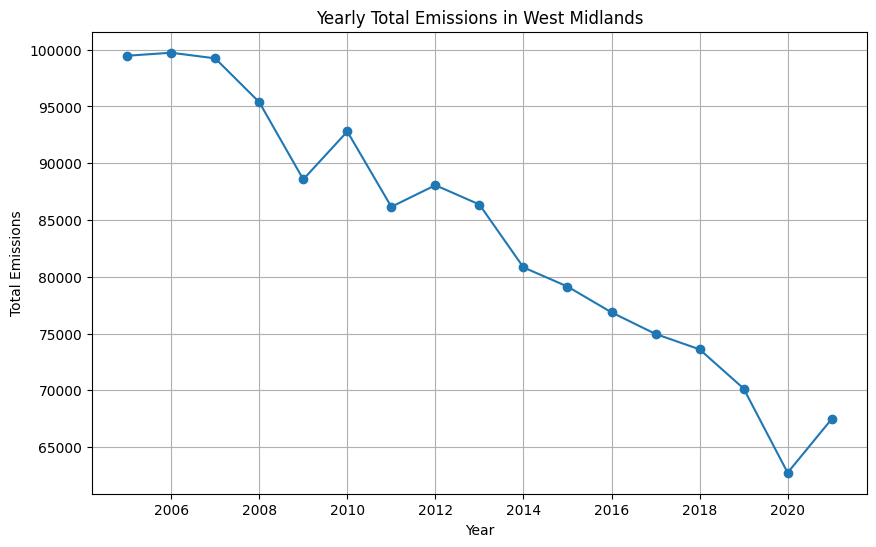

In [65]:
import matplotlib.pyplot as plt
import pandas as pd

yearly_totals = west_midlands_local_authority_emissions.sum()

plt.figure(figsize=(10, 6))
yearly_totals.plot(kind='line', marker='o')

plt.title('Yearly Total Emissions in West Midlands')
plt.xlabel('Year')
plt.ylabel('Total Emissions')
plt.grid(True)

plt.show()

<h1>London</h1>

In [66]:
# Filter the data for the "london" Region/Country
London_data = data_1_1_actual[data_1_1_actual['Region/Country'] == 'London']
London_data

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
3502,London,Barking and Dagenham,Barking and Dagenham,E09000002,2005,131.684063,17.459426,66.870493,28.426324,244.440306,...,0.211348,1.239115,161.428095,7.486672,168.914767,1143.769451,166.275,6.878782,37.7992,30.259091
3503,London,Barking and Dagenham,Barking and Dagenham,E09000002,2006,139.895257,13.63688,66.154453,28.690501,248.377092,...,0.396191,1.344134,149.864148,8.481513,158.345662,1137.669474,167.157,6.805994,37.7992,30.097713
3504,London,Barking and Dagenham,Barking and Dagenham,E09000002,2007,140.487938,12.727459,69.810178,30.324736,253.350311,...,0.25175,1.199139,155.877849,8.75395,164.631799,1129.493177,169.031,6.682166,37.7992,29.881404
3505,London,Barking and Dagenham,Barking and Dagenham,E09000002,2008,135.419965,12.319912,68.498117,25.60148,241.839473,...,0.151626,0.907199,128.605453,8.869047,137.4745,1059.170470,172.452,6.141828,37.7992,28.020976
3506,London,Barking and Dagenham,Barking and Dagenham,E09000002,2009,115.972501,12.15477,59.188809,21.28696,208.603041,...,0.129006,0.841917,178.517672,8.801381,187.319052,1027.842511,177.58,5.788053,37.7992,27.192176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4058,London,Westminster,Westminster,E09000033,2017,47.698762,23.283152,0.085511,95.767013,166.834438,...,0.017115,4.485572,9.338904,7.83116,17.170064,2062.990819,202.606251,10.182266,22.0301,93.644188
4059,London,Westminster,Westminster,E09000033,2018,131.422791,59.29191,1.014299,94.752952,286.481952,...,0.019147,15.027827,11.016105,7.773276,18.789381,1985.655839,201.909585,9.834381,22.0301,90.133764
4060,London,Westminster,Westminster,E09000033,2019,106.191379,57.354249,0.268476,84.414842,248.228947,...,0.021237,14.091068,9.521645,7.656918,17.178562,1768.356274,200.526526,8.818565,22.0301,80.270007
4061,London,Westminster,Westminster,E09000033,2020,69.206872,52.611429,0.188609,87.61706,209.62397,...,0.009882,14.423154,14.093663,7.487961,21.581624,1444.948575,200.752862,7.197649,22.0301,65.589742


In [67]:
# Filter out rows where "Second Tier Authority" ends with "Total"
London_data_filtered = London_data[~London_data['Second Tier Authority'].str.endswith("Total")]


In [68]:
# List of columns to keep
columns_to_keep = ['Region/Country', 'Second Tier Authority', 'Local Authority', 'Local Authority Code', 'Calendar Year', 'LULUCF Net Emissions']
# Add columns that end with "Total"
columns_to_keep.extend([col for col in London_data_filtered.columns if col.endswith("Total")])


In [69]:
London_filtered_columns = London_data_filtered[columns_to_keep]

London_filtered_columns.to_csv('London_filtered_columns.csv')
London_filtered_columns

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,LULUCF Net Emissions,Industry Total,Commercial Total,Public Sector Total,Domestic Total,Transport Total,Agriculture Total,Waste Management Total,Grand Total
3502,London,Barking and Dagenham,Barking and Dagenham,E09000002,2005,3.00106,244.440306,137.676935,35.95596,355.209148,197.33216,1.239115,168.914767,1143.769451
3503,London,Barking and Dagenham,Barking and Dagenham,E09000002,2006,2.99693,248.377092,137.705936,33.476519,353.608435,201.814766,1.344134,158.345662,1137.669474
3504,London,Barking and Dagenham,Barking and Dagenham,E09000002,2007,2.915637,253.350311,136.537811,32.622496,342.227095,196.00889,1.199139,164.631799,1129.493177
3505,London,Barking and Dagenham,Barking and Dagenham,E09000002,2008,2.821984,241.839473,131.803592,31.038871,339.158195,174.126655,0.907199,137.4745,1059.170470
3506,London,Barking and Dagenham,Barking and Dagenham,E09000002,2009,2.73088,208.603041,115.528181,27.75836,305.796533,179.264547,0.841917,187.319052,1027.842511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4058,London,Westminster,Westminster,E09000033,2017,1.201102,166.834438,1015.272687,247.337188,317.290917,293.39885,4.485572,17.170064,2062.990819
4059,London,Westminster,Westminster,E09000033,2018,1.205057,286.481952,680.109173,392.924316,308.350644,282.767489,15.027827,18.789381,1985.655839
4060,London,Westminster,Westminster,E09000033,2019,1.167881,248.228947,614.555353,326.036055,291.00727,256.091137,14.091068,17.178562,1768.356274
4061,London,Westminster,Westminster,E09000033,2020,1.178764,209.62397,441.270459,279.303695,275.398011,202.168898,14.423154,21.581624,1444.948575


In [70]:
# Create the pivot table of west_midlands local authorities emission
London_local_authority_emissions = pd.pivot_table(London_filtered_columns, values='Grand Total', index=['Local Authority'], columns=['Calendar Year'])

London_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Barking and Dagenham,1143.769451,1137.669474,1129.493177,1059.170470,1027.842511,1074.458911,1063.789683,989.485100,916.863501,818.600754,751.829766,763.987306,719.250628,727.762858,768.496793,658.182793,713.257071
Barnet,1935.738379,1936.108212,1881.730350,1895.947916,1930.874717,1991.839989,1803.398317,1885.286564,1845.016535,1648.066549,1559.627617,1508.335748,1465.309243,1424.374426,1384.449107,1259.882102,1335.292920
Bexley,1401.965109,1375.118185,1317.338848,1290.522468,1202.145062,1308.786002,1135.618513,1201.956255,1154.077529,1063.552030,1036.689931,983.151027,929.335144,861.388300,841.844776,773.041608,815.969051
Brent,1658.208154,1610.531981,1612.339933,1676.850623,1706.601914,1656.682391,1461.257729,1682.292163,1631.283669,1363.327488,1267.429188,1221.079306,1204.987810,1170.613528,1079.773201,1016.575515,1074.536509
Bromley,1721.234100,1744.069163,1655.604912,1618.384935,1558.309805,1658.285845,1446.404601,1515.517494,1467.472313,1316.641882,1275.347526,1211.746038,1130.341644,1110.521398,1050.743698,953.423486,1015.820513
Camden,1877.355270,1980.016766,1922.148658,1883.867937,1702.861352,1755.224626,1608.445972,1707.674042,1639.823685,1414.589094,1306.655293,1221.825268,1114.872030,1088.164854,1008.814953,896.919156,1024.262763
City of London,1729.953162,1856.477516,1746.600671,1759.470248,1551.279506,1711.862311,1482.148882,1681.313826,1490.594281,1232.184891,1082.514456,905.430588,800.698851,782.393720,747.632764,627.448608,636.123249
Croydon,1931.756219,1885.574789,1797.101804,1750.064513,1660.492021,1799.915324,1568.043628,1674.327417,1569.004236,1377.384089,1324.491777,1265.995790,1202.474716,1189.143001,1129.272704,1053.903040,1133.503357
Ealing,1951.198985,1960.648553,1935.712137,1950.860111,1701.818270,1717.703808,1614.173621,1726.009810,1702.771238,1524.929566,1434.319509,1330.810411,1290.366345,1249.409822,1188.201957,1068.271237,1161.789919


In [71]:
import pandas as pd

# Calculate the yearly total emissions for each year
yearly_totals = London_local_authority_emissions.sum()

# Append the totals as a new row to the DataFrame
London_local_authority_emissions.loc['Total'] = yearly_totals

London_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Barking and Dagenham,1143.769451,1137.669474,1129.493177,1059.170470,1027.842511,1074.458911,1063.789683,989.485100,916.863501,818.600754,751.829766,763.987306,719.250628,727.762858,768.496793,658.182793,713.257071
Barnet,1935.738379,1936.108212,1881.730350,1895.947916,1930.874717,1991.839989,1803.398317,1885.286564,1845.016535,1648.066549,1559.627617,1508.335748,1465.309243,1424.374426,1384.449107,1259.882102,1335.292920
Bexley,1401.965109,1375.118185,1317.338848,1290.522468,1202.145062,1308.786002,1135.618513,1201.956255,1154.077529,1063.552030,1036.689931,983.151027,929.335144,861.388300,841.844776,773.041608,815.969051
Brent,1658.208154,1610.531981,1612.339933,1676.850623,1706.601914,1656.682391,1461.257729,1682.292163,1631.283669,1363.327488,1267.429188,1221.079306,1204.987810,1170.613528,1079.773201,1016.575515,1074.536509
Bromley,1721.234100,1744.069163,1655.604912,1618.384935,1558.309805,1658.285845,1446.404601,1515.517494,1467.472313,1316.641882,1275.347526,1211.746038,1130.341644,1110.521398,1050.743698,953.423486,1015.820513
Camden,1877.355270,1980.016766,1922.148658,1883.867937,1702.861352,1755.224626,1608.445972,1707.674042,1639.823685,1414.589094,1306.655293,1221.825268,1114.872030,1088.164854,1008.814953,896.919156,1024.262763
City of London,1729.953162,1856.477516,1746.600671,1759.470248,1551.279506,1711.862311,1482.148882,1681.313826,1490.594281,1232.184891,1082.514456,905.430588,800.698851,782.393720,747.632764,627.448608,636.123249
Croydon,1931.756219,1885.574789,1797.101804,1750.064513,1660.492021,1799.915324,1568.043628,1674.327417,1569.004236,1377.384089,1324.491777,1265.995790,1202.474716,1189.143001,1129.272704,1053.903040,1133.503357
Ealing,1951.198985,1960.648553,1935.712137,1950.860111,1701.818270,1717.703808,1614.173621,1726.009810,1702.771238,1524.929566,1434.319509,1330.810411,1290.366345,1249.409822,1188.201957,1068.271237,1161.789919


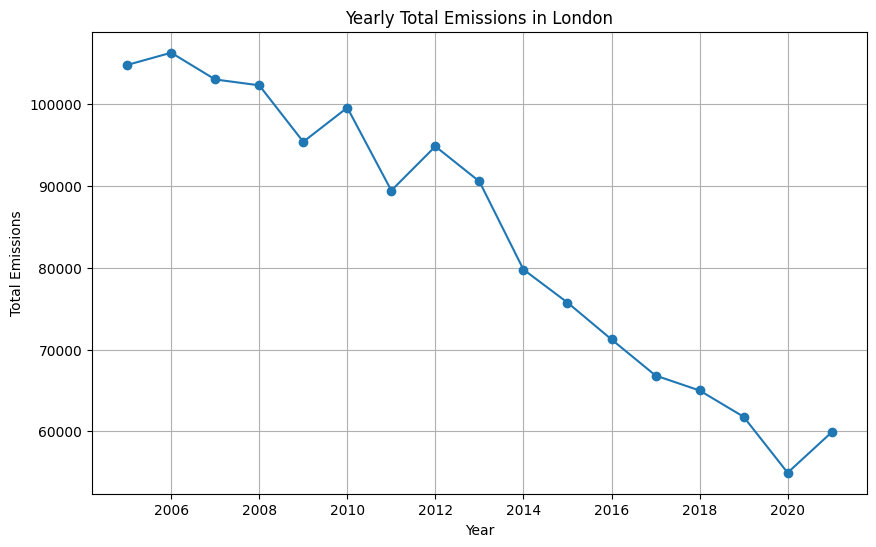

In [72]:
import matplotlib.pyplot as plt
import pandas as pd

yearly_totals = London_local_authority_emissions.sum()

plt.figure(figsize=(10, 6))
yearly_totals.plot(kind='line', marker='o')

plt.title('Yearly Total Emissions in London')
plt.xlabel('Year')
plt.ylabel('Total Emissions')
plt.grid(True)

plt.show()

<h1>Wales</h1>

In [73]:
# Filter the data for the "Wales" Region/Country
Wales_data = data_1_1_actual[data_1_1_actual['Region/Country'] == 'Wales']
Wales_data

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
5899,Wales,Wales,Blaenau Gwent,W06000019,2005,65.59808,30.923927,0.910503,31.863069,129.295578,...,1.393334,9.764239,101.06659,3.698073,104.764663,590.397163,69.188,8.533231,108.7279,5.430043
5900,Wales,Wales,Blaenau Gwent,W06000019,2006,68.297658,37.994917,0.882636,33.684962,140.860173,...,1.312323,9.408435,94.259989,4.270126,98.530116,594.764649,69.61,8.544241,108.7279,5.470212
5901,Wales,Wales,Blaenau Gwent,W06000019,2007,62.6949,35.219753,0.895169,32.121519,130.931341,...,1.306047,9.717945,99.165453,4.397067,103.56252,576.227727,69.685,8.269035,108.7279,5.299723
5902,Wales,Wales,Blaenau Gwent,W06000019,2008,66.289964,35.527274,0.850555,30.52934,133.197132,...,1.132106,9.145378,75.383486,4.401133,79.784619,559.320474,69.82,8.010892,108.7279,5.144222
5903,Wales,Wales,Blaenau Gwent,W06000019,2009,54.565764,24.645645,0.868735,30.739822,110.819967,...,1.198329,8.843912,66.026656,4.155314,70.18197,494.419940,69.85,7.07831,108.7279,4.547314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6268,Wales,Wales,Wrexham,W06000006,2017,138.291306,215.451935,6.162685,58.279959,418.185885,...,24.874715,226.456449,38.64809,13.623222,52.271312,1296.506128,137.024688,9.461843,503.7739,2.573587
6269,Wales,Wales,Wrexham,W06000006,2018,124.951001,262.003868,6.784681,60.623925,454.363475,...,24.210341,219.62436,31.887202,14.560996,46.448198,1269.213023,137.113661,9.256649,503.7739,2.51941
6270,Wales,Wales,Wrexham,W06000006,2019,114.083503,227.250945,10.291972,58.155464,409.781884,...,23.919956,209.605174,36.983958,17.280628,54.264586,1206.602551,136.859706,8.816346,503.7739,2.395127
6271,Wales,Wales,Wrexham,W06000006,2020,87.7227,220.889613,8.987525,57.01724,374.617077,...,22.221266,229.931955,20.0322,16.058294,36.090495,1102.897206,136.391201,8.086278,503.7739,2.18927


In [74]:
# Filter out rows where "Second Tier Authority" ends with "Total"
Wales_data_filtered = Wales_data[~Wales_data['Second Tier Authority'].str.endswith("Total")]


In [75]:
# List of columns to keep
columns_to_keep = ['Region/Country', 'Second Tier Authority', 'Local Authority', 'Local Authority Code', 'Calendar Year', 'LULUCF Net Emissions']
# Add columns that end with "Total"
columns_to_keep.extend([col for col in Wales_data_filtered.columns if col.endswith("Total")])


In [76]:
Wales_filtered_columns = Wales_data_filtered[columns_to_keep]

Wales_filtered_columns.to_csv('Wales_filtered_columns.csv')
Wales_filtered_columns

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,LULUCF Net Emissions,Industry Total,Commercial Total,Public Sector Total,Domestic Total,Transport Total,Agriculture Total,Waste Management Total,Grand Total
5899,Wales,Wales,Blaenau Gwent,W06000019,2005,-0.327826,129.295578,32.730794,18.562459,195.049517,100.55774,9.764239,104.764663,590.397163
5900,Wales,Wales,Blaenau Gwent,W06000019,2006,-0.808447,140.860173,35.206249,20.236768,193.346979,97.984376,9.408435,98.530116,594.764649
5901,Wales,Wales,Blaenau Gwent,W06000019,2007,-0.645698,130.931341,32.374593,18.622168,181.66203,100.002829,9.717945,103.56252,576.227727
5902,Wales,Wales,Blaenau Gwent,W06000019,2008,-0.80085,133.197132,33.935402,18.892512,186.674254,98.492027,9.145378,79.784619,559.320474
5903,Wales,Wales,Blaenau Gwent,W06000019,2009,-1.145458,110.819967,27.19311,14.499577,167.845082,96.18178,8.843912,70.18197,494.419940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6268,Wales,Wales,Wrexham,W06000006,2017,30.759367,418.185885,72.175017,25.829278,213.93879,256.89003,226.456449,52.271312,1296.506128
6269,Wales,Wales,Wrexham,W06000006,2018,29.9354,454.363475,25.79469,23.23909,211.829126,257.978684,219.62436,46.448198,1269.213023
6270,Wales,Wales,Wrexham,W06000006,2019,29.062392,409.781884,22.563667,22.568689,203.705944,255.050215,209.605174,54.264586,1206.602551
6271,Wales,Wales,Wrexham,W06000006,2020,27.78471,374.617077,18.213058,19.070547,196.043477,201.145887,229.931955,36.090495,1102.897206


In [77]:
# Create the pivot table of west_midlands local authorities emission
Wales_local_authority_emissions = pd.pivot_table(Wales_filtered_columns, values='Grand Total', index=['Local Authority'], columns=['Calendar Year'])

Wales_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Blaenau Gwent,590.397163,594.764649,576.227727,559.320474,494.419940,506.901265,428.349653,450.003214,451.114407,389.828472,534.622710,390.962484,557.984657,555.495679,350.923958,326.900103,363.187488
Bridgend,1359.583320,1328.278136,1283.493003,1263.946946,1173.890622,1176.357606,1095.250276,1113.884061,1103.423135,1031.194944,984.409370,958.793719,929.398390,939.311405,903.755106,827.739899,864.513347
Caerphilly,1491.891676,1466.628930,1403.504827,1330.582166,1221.059679,1253.815468,1065.323173,1126.135522,1120.623853,1014.975553,953.279500,926.438348,870.974195,880.193592,849.067720,788.498128,813.616539
Cardiff,3698.847519,3411.240239,3306.860621,3193.118687,2969.365021,2913.888084,2445.316260,2624.123187,2519.808130,2228.403312,2107.776243,2042.344438,1968.407936,1871.686889,1803.751711,1594.449034,1788.013176
Carmarthenshire,2602.104764,2570.189236,2518.959135,2471.906750,2266.983363,2353.432116,2106.291325,2160.298425,2173.361058,2119.475047,2010.904061,1951.002726,1934.073796,1922.563658,1843.567559,1683.576211,1768.723320
Ceredigion,1126.256377,1101.837573,1058.937582,1040.970718,997.238606,1037.376865,979.918183,1028.805758,1001.344324,987.051155,960.994072,924.869676,923.148603,917.880254,897.652109,865.645897,892.027474
Conwy,1235.264422,1213.764301,1125.155795,1089.955240,1027.964417,1054.812419,937.861289,982.688234,948.853641,895.926334,881.401204,877.671760,867.043857,845.729893,821.736378,716.245973,782.907595
Denbighshire,1037.682654,1043.320125,974.457215,958.170492,896.630095,911.909382,828.091079,855.911724,850.269080,806.030525,786.327564,777.915944,763.359577,752.154286,721.769691,659.262986,714.669026
Flintshire,2605.371511,2986.886044,2860.705377,2645.697658,2212.047012,2138.727258,1963.600766,2230.682165,2211.075206,2136.340525,2084.301597,2053.014452,1877.574502,1973.767337,1882.334109,1739.163131,1898.892354


In [78]:
# Calculate the yearly total emissions for each year
yearly_totals = Wales_local_authority_emissions.sum()

# Append the totals as a new row to the DataFrame
Wales_local_authority_emissions.loc['Total'] = yearly_totals

Wales_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Blaenau Gwent,590.397163,594.764649,576.227727,559.320474,494.419940,506.901265,428.349653,450.003214,451.114407,389.828472,534.622710,390.962484,557.984657,555.495679,350.923958,326.900103,363.187488
Bridgend,1359.583320,1328.278136,1283.493003,1263.946946,1173.890622,1176.357606,1095.250276,1113.884061,1103.423135,1031.194944,984.409370,958.793719,929.398390,939.311405,903.755106,827.739899,864.513347
Caerphilly,1491.891676,1466.628930,1403.504827,1330.582166,1221.059679,1253.815468,1065.323173,1126.135522,1120.623853,1014.975553,953.279500,926.438348,870.974195,880.193592,849.067720,788.498128,813.616539
Cardiff,3698.847519,3411.240239,3306.860621,3193.118687,2969.365021,2913.888084,2445.316260,2624.123187,2519.808130,2228.403312,2107.776243,2042.344438,1968.407936,1871.686889,1803.751711,1594.449034,1788.013176
Carmarthenshire,2602.104764,2570.189236,2518.959135,2471.906750,2266.983363,2353.432116,2106.291325,2160.298425,2173.361058,2119.475047,2010.904061,1951.002726,1934.073796,1922.563658,1843.567559,1683.576211,1768.723320
Ceredigion,1126.256377,1101.837573,1058.937582,1040.970718,997.238606,1037.376865,979.918183,1028.805758,1001.344324,987.051155,960.994072,924.869676,923.148603,917.880254,897.652109,865.645897,892.027474
Conwy,1235.264422,1213.764301,1125.155795,1089.955240,1027.964417,1054.812419,937.861289,982.688234,948.853641,895.926334,881.401204,877.671760,867.043857,845.729893,821.736378,716.245973,782.907595
Denbighshire,1037.682654,1043.320125,974.457215,958.170492,896.630095,911.909382,828.091079,855.911724,850.269080,806.030525,786.327564,777.915944,763.359577,752.154286,721.769691,659.262986,714.669026
Flintshire,2605.371511,2986.886044,2860.705377,2645.697658,2212.047012,2138.727258,1963.600766,2230.682165,2211.075206,2136.340525,2084.301597,2053.014452,1877.574502,1973.767337,1882.334109,1739.163131,1898.892354


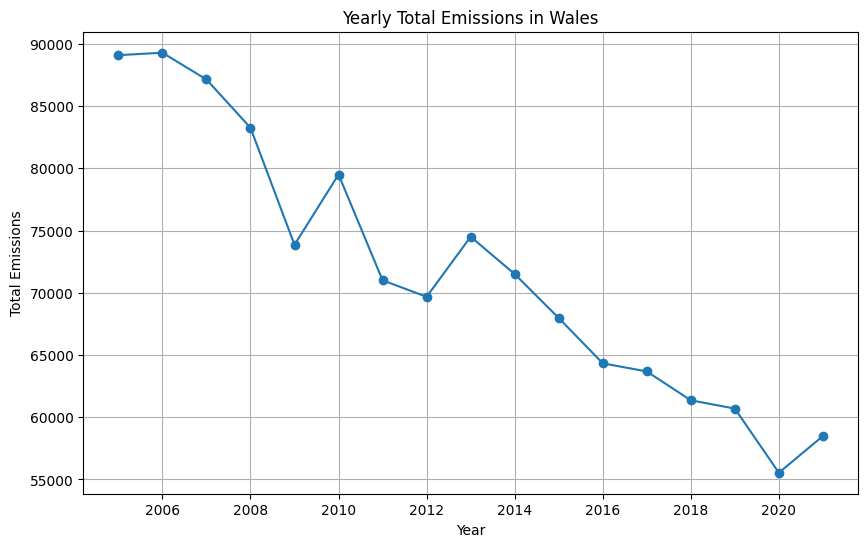

In [79]:
import matplotlib.pyplot as plt
import pandas as pd

yearly_totals = Wales_local_authority_emissions.sum()

plt.figure(figsize=(10, 6))
yearly_totals.plot(kind='line', marker='o')

plt.title('Yearly Total Emissions in Wales')
plt.xlabel('Year')
plt.ylabel('Total Emissions')
plt.grid(True)

plt.show()

In [80]:
yearly_totals

Calendar Year
2005    89094.939890
2006    89290.466673
2007    87140.813886
2008    83259.959289
2009    73853.468315
2010    79501.773874
2011    71000.972010
2012    69675.622798
2013    74501.047094
2014    71501.660855
2015    67969.985863
2016    64329.383852
2017    63675.637671
2018    61356.652486
2019    60690.289653
2020    55536.540557
2021    58486.651947
dtype: float64

<h1>Population ('000s, mid-year estimate)</h1>

 Population ('000s, mid-year estimate) refers to the estimated population of a region in the middle of a given year, expressed in thousands. For instance, if the mid-year population estimate for a region is 1,200 '000s, it means the estimated population is 1.2 million individuals. These estimates are used for calculating per capita metrics and understanding demographic changes over time. In this case the United Kingdoms demograhic changes between 2005 to 2021

<h1>Per Capita Emissions</h1>

Per capita emissions refer to the average release of emissions (carbon dioxide, CO2) attributed to each individual within a certain united kingdon's population between the year 2005 and 2021

<h1>Average Emissions per km² by Region </h1>

Average Emissions per km² by Region refers to a measure used to understand the density of emissions in a given area. This metric provides an average value of emissions (carbon dioxide, CO2) distributed over the total land area of a region in the United Kingdom, expressed in square kilometers (km²)

In [81]:

data_1_1_actual['Per Capita Emissions'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce') / \
                                          pd.to_numeric(data_1_1_actual["Per Capita Emissions (tCO2e)"], errors='coerce')


data_1_1_actual['Emissions per km^2'] = pd.to_numeric(data_1_1_actual['Grand Total'], errors='coerce') / \
                                        pd.to_numeric(data_1_1_actual['Emissions per km2 (kt CO2e)'], errors='coerce')


# Group by 'Region/Country' to get average per capita emissions and emissions per km^2 for each region
average_emissions = data_1_1_actual.groupby('Region/Country')[['Per Capita Emissions', 'Emissions per km^2']].mean()

average_emissions

3,Per Capita Emissions,Emissions per km^2
Region/Country,,
East Midlands,207.488221,775.042820
East Midlands Total,4616.416898,15810.724100
East of England,219.709033,755.488316
East of England Total,5971.139613,19584.438300
England Total,53808.864075,132929.086100
London,250.849430,48.324148
London Total,8278.031179,1594.696900
National Total,64016.313391,248717.570600
North East,216.943797,722.891083


In [82]:
data_1_1_actual.head()

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e),Per Capita Emissions,Emissions per km^2
0,North East,Darlington,Darlington,E06000005,2005,51.87311,114.701874,0.045681,43.073543,209.694209,...,34.256022,5.613394,39.869415,968.661604,100.287,9.658895,197.4758,4.905217,100.287,197.4758
1,North East,Darlington,Darlington,E06000005,2006,55.398988,97.614091,0.065836,42.086928,195.165842,...,31.802024,6.57408,38.376104,943.627506,101.509,9.295998,197.4758,4.778446,101.509,197.4758
2,North East,Darlington,Darlington,E06000005,2007,52.249398,95.167732,0.074503,43.79521,191.286843,...,37.048534,6.81813,43.866664,925.275164,102.632,9.015465,197.4758,4.685512,102.632,197.4758
3,North East,Darlington,Darlington,E06000005,2008,51.651166,95.266031,0.055964,35.982972,182.956132,...,7.662955,6.771385,14.43434,876.045542,103.694,8.448373,197.4758,4.436217,103.694,197.4758
4,North East,Darlington,Darlington,E06000005,2009,45.607413,82.045964,1.061014,26.863721,155.578112,...,16.001037,6.053694,22.054731,805.592471,104.355,7.71973,197.4758,4.079449,104.355,197.4758


In [83]:

#population = data_1_1_actual["Population ('000s, mid-year estimate)"].sum()

#per_capita_emissions = data_1_1_actual['Per Capita Emissions (tCO2e)'].sum()

#area = data_1_1_actual['Area (km2)'].sum()

#emissions_per_km2 = data_1_1_actual['Emissions per km2 (kt CO2e)'].sum()

grouped_data = data_1_1_actual.groupby('Region/Country').agg({
    'Per Capita Emissions (tCO2e)': 'sum',
    'Emissions per km2 (kt CO2e)': 'sum'
}).reset_index()

#print(f"Population: {population}")
#print(f"Per Capita Emissions: {per_capita_emissions}")
#print(f"Area: {area}")
#print(f"Emissions per km^2: {emissions_per_km2}")

grouped_data

3,Region/Country,Per Capita Emissions (tCO2e),Emissions per km2 (kt CO2e)
0,East Midlands,6603.376367,3616.540705
1,East Midlands Total,147.366412,42.750318
2,East of England,7015.06806,5002.183019
3,East of England Total,134.801621,40.782288
4,England Total,127.891663,51.387083
5,London,5788.435727,26454.077988
6,London Total,86.933115,445.56866
7,National Total,137.833562,35.234679
8,North East,2325.728502,2289.486191
9,North East Total,174.093046,52.026034


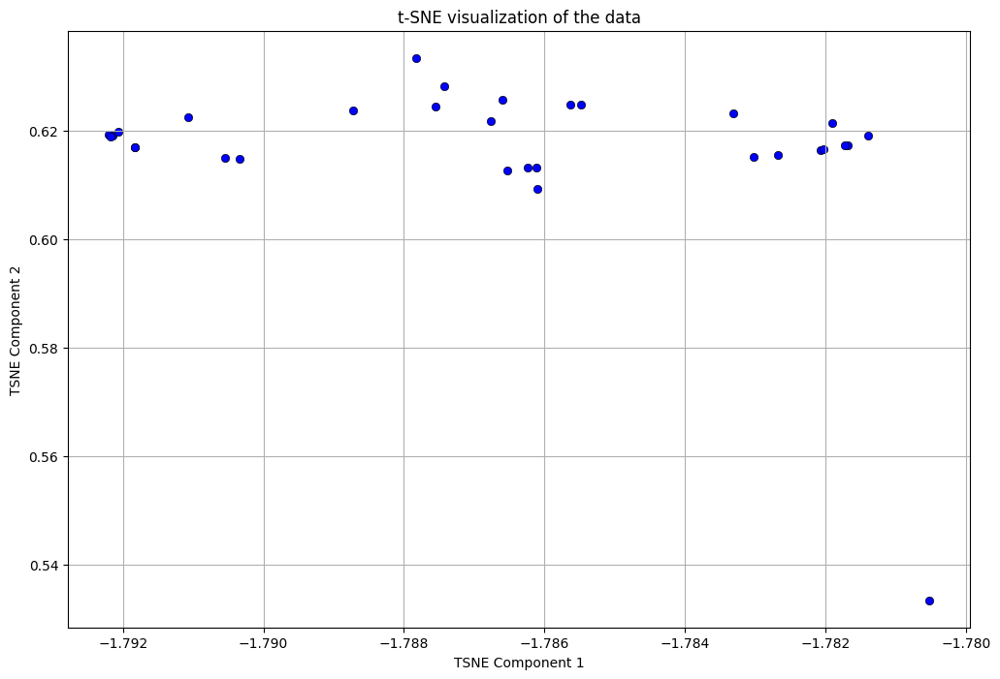

In [84]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import seaborn as sns
import matplotlib.pyplot as plt

data_transposed = west_midlands_local_authority_emissions

numerical_data = data_transposed.select_dtypes(include=[np.number])

numerical_data_filled = numerical_data.fillna(numerical_data.mean())

sampled_data = numerical_data_filled.sample(frac=1.0, random_state=0)

# t-SNE transformation
tsne = TSNE(n_components=2, random_state=0)
tsne_results = tsne.fit_transform(sampled_data)

# Creating a DataFrame for the t-SNE results
tsne_df = pd.DataFrame({
    'TSNE1': tsne_results[:, 0],
    'TSNE2': tsne_results[:, 1]
})

# Plotting the t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', color='blue', edgecolor='black', data=tsne_df)
plt.title('t-SNE visualization of the data')
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.grid(True)
plt.show()

In [85]:
tsne_df

,TSNE1,TSNE2
0,-1.785631,0.624841
1,-1.788719,0.623817
2,-1.787833,0.633427
3,-1.792142,0.619114
4,-1.787550,0.624467
5,-1.781393,0.619026
6,-1.786603,0.625624
7,-1.783308,0.623274
8,-1.792199,0.619256
9,-1.781684,0.617315


In [86]:
data_transposed

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [87]:
data_transposed.dtypes

Calendar Year
2005    float64
2006    float64
2007    float64
2008    float64
2009    float64
2010    float64
2011    float64
2012    float64
2013    float64
2014    float64
2015    float64
2016    float64
2017    float64
2018    float64
2019    float64
2020    float64
2021    float64
dtype: object

In [88]:
numerical_data

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [89]:
tsne_df

,TSNE1,TSNE2
0,-1.785631,0.624841
1,-1.788719,0.623817
2,-1.787833,0.633427
3,-1.792142,0.619114
4,-1.787550,0.624467
5,-1.781393,0.619026
6,-1.786603,0.625624
7,-1.783308,0.623274
8,-1.792199,0.619256
9,-1.781684,0.617315


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


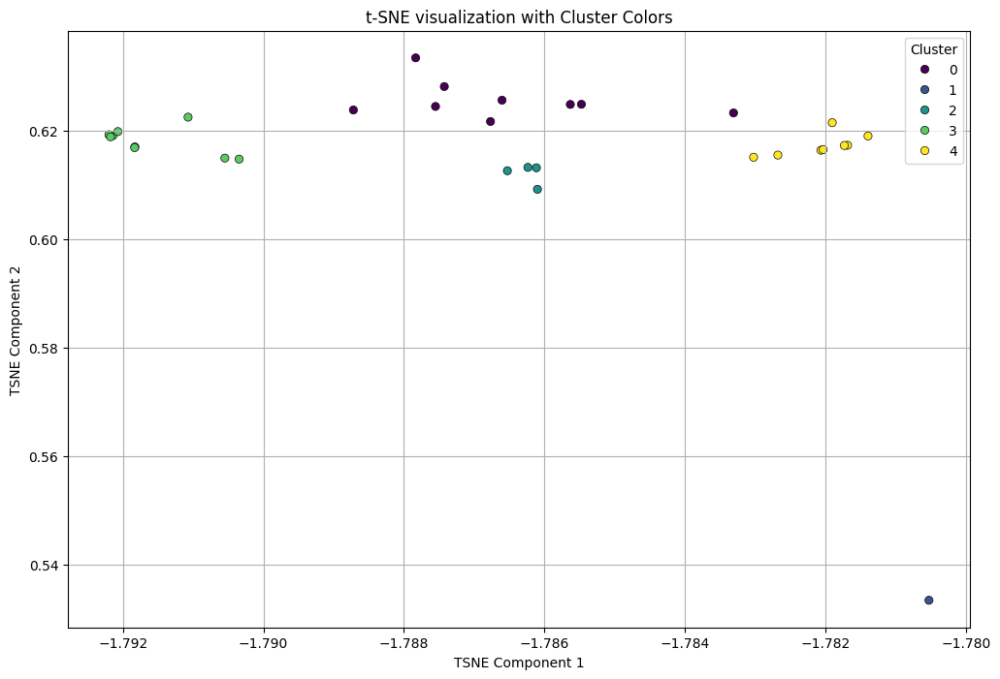

In [90]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


tsne_results = tsne_df

tsne_component_1 = tsne_results['TSNE1']
tsne_component_2 = tsne_results['TSNE2']

kmeans = KMeans(n_clusters=5, random_state=0)
tsne_results['Cluster'] = kmeans.fit_predict(tsne_results[['TSNE1', 'TSNE2']])

plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='Cluster', palette='viridis', edgecolor='black', data=tsne_results, legend='full')

plt.title('t-SNE visualization with Cluster Colors')
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [91]:
tsne_df

,TSNE1,TSNE2,Cluster
0,-1.785631,0.624841,0
1,-1.788719,0.623817,0
2,-1.787833,0.633427,0
3,-1.792142,0.619114,3
4,-1.787550,0.624467,0
5,-1.781393,0.619026,4
6,-1.786603,0.625624,0
7,-1.783308,0.623274,0
8,-1.792199,0.619256,3
9,-1.781684,0.617315,4


In [92]:
tsne_df.to_csv('tsne.csv', index=False)

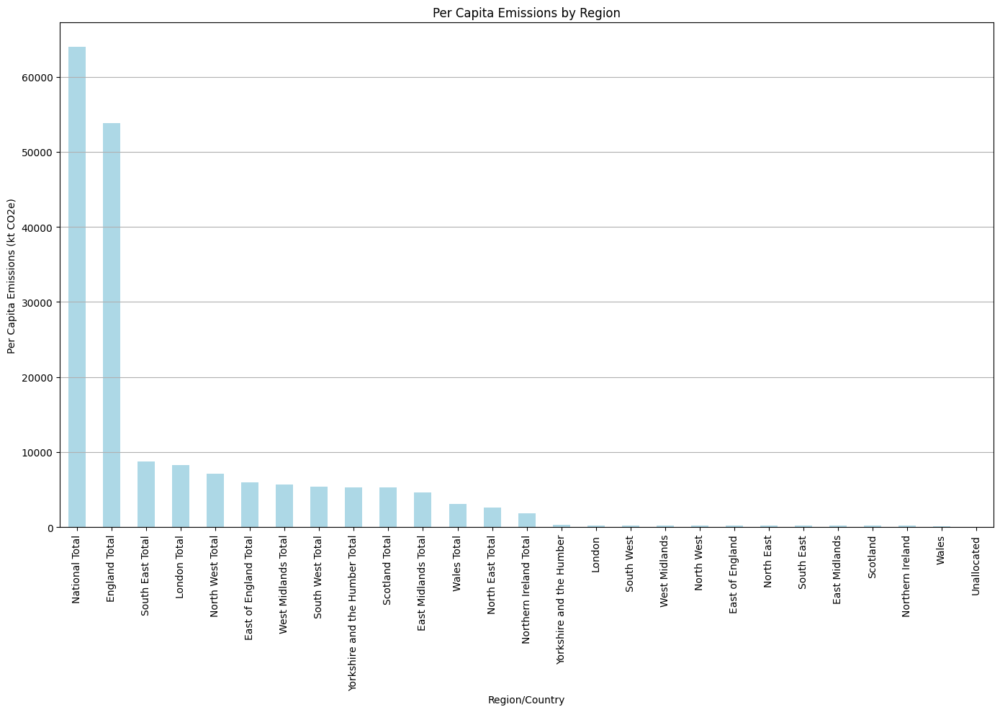

In [93]:
# Sort the regions based on average per capita emissions
sorted_per_capita = average_emissions['Per Capita Emissions'].sort_values(ascending=False)

# Plotting average per capita emissions for each region
plt.figure(figsize=(14, 10))
sorted_per_capita.plot(kind='bar', color='lightblue')
plt.title('Per Capita Emissions by Region')
plt.ylabel('Per Capita Emissions (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [94]:

average_emissions

3,Per Capita Emissions,Emissions per km^2
Region/Country,,
East Midlands,207.488221,775.042820
East Midlands Total,4616.416898,15810.724100
East of England,219.709033,755.488316
East of England Total,5971.139613,19584.438300
England Total,53808.864075,132929.086100
London,250.849430,48.324148
London Total,8278.031179,1594.696900
National Total,64016.313391,248717.570600
North East,216.943797,722.891083


In [95]:
print(average_emissions.columns)

Index(['Per Capita Emissions', 'Emissions per km^2'], dtype='object', name=3)


In [96]:
print(average_emissions.index)

Index(['East Midlands', 'East Midlands Total', 'East of England',
       'East of England Total', 'England Total', 'London', 'London Total',
       'National Total', 'North East', 'North East Total', 'North West',
       'North West Total', 'Northern Ireland', 'Northern Ireland Total',
       'Scotland', 'Scotland Total', 'South East', 'South East Total',
       'South West', 'South West Total', 'Unallocated', 'Wales', 'Wales Total',
       'West Midlands', 'West Midlands Total', 'Yorkshire and the Humber',
       'Yorkshire and the Humber Total'],
      dtype='object', name='Region/Country')


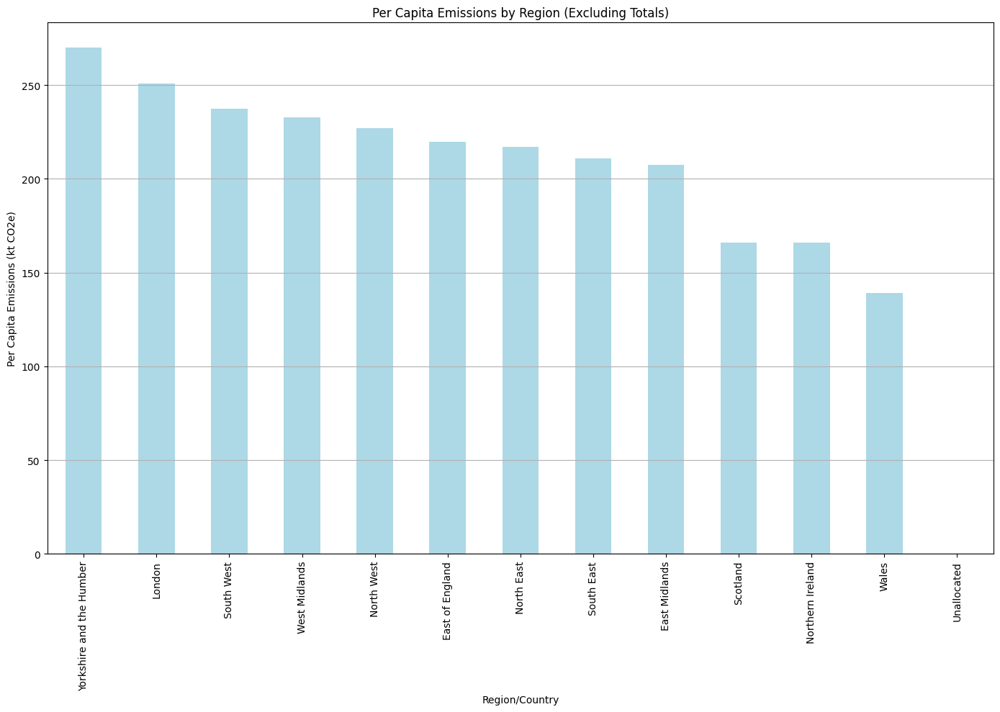

In [97]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter out rows where 'Region/Country' ends with 'Total'
filtered_average_emissions = average_emissions[~average_emissions.index.str.endswith('Total')]

# Sort the regions based on average per capita emissions
sorted_per_capita = filtered_average_emissions['Per Capita Emissions'].sort_values(ascending=False)

# Plotting average per capita emissions for each region
plt.figure(figsize=(14, 10))
sorted_per_capita.plot(kind='bar', color='lightblue')
plt.title('Per Capita Emissions by Region (Excluding Totals)')
plt.ylabel('Per Capita Emissions (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

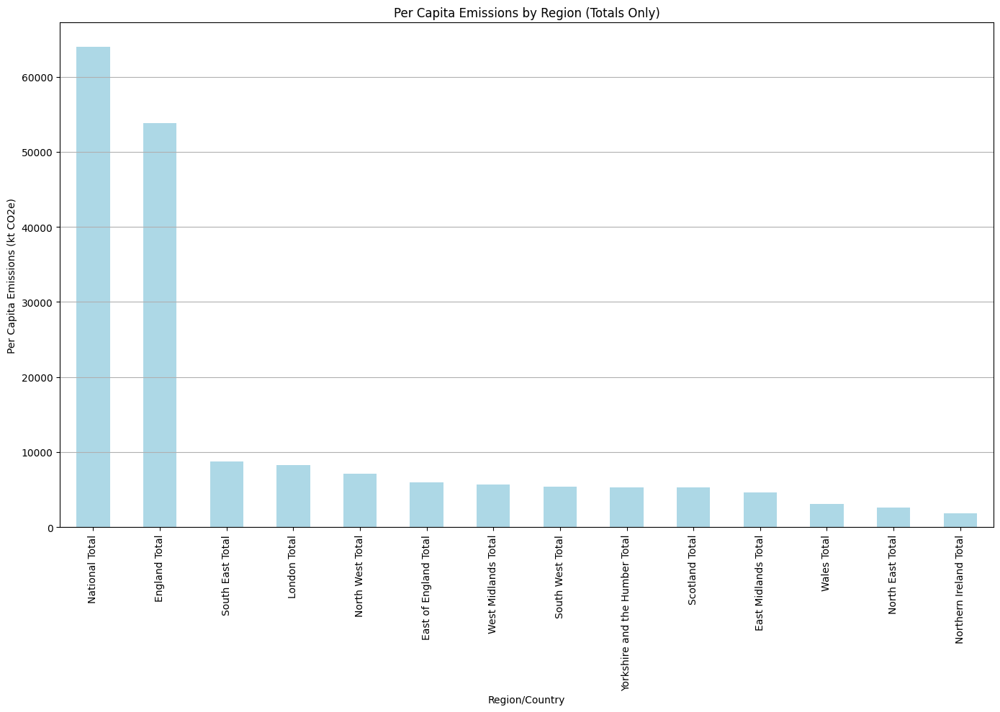

In [98]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter for only rows where 'Region/Country' ends with 'Total'
filtered_average_emissions = average_emissions[average_emissions.index.str.endswith('Total')]

# Sort the regions based on average per capita emissions
sorted_per_capita = filtered_average_emissions['Per Capita Emissions'].sort_values(ascending=False)

# Plotting average per capita emissions for each region
plt.figure(figsize=(14, 10))
sorted_per_capita.plot(kind='bar', color='lightblue')
plt.title('Per Capita Emissions by Region (Totals Only)')
plt.ylabel('Per Capita Emissions (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

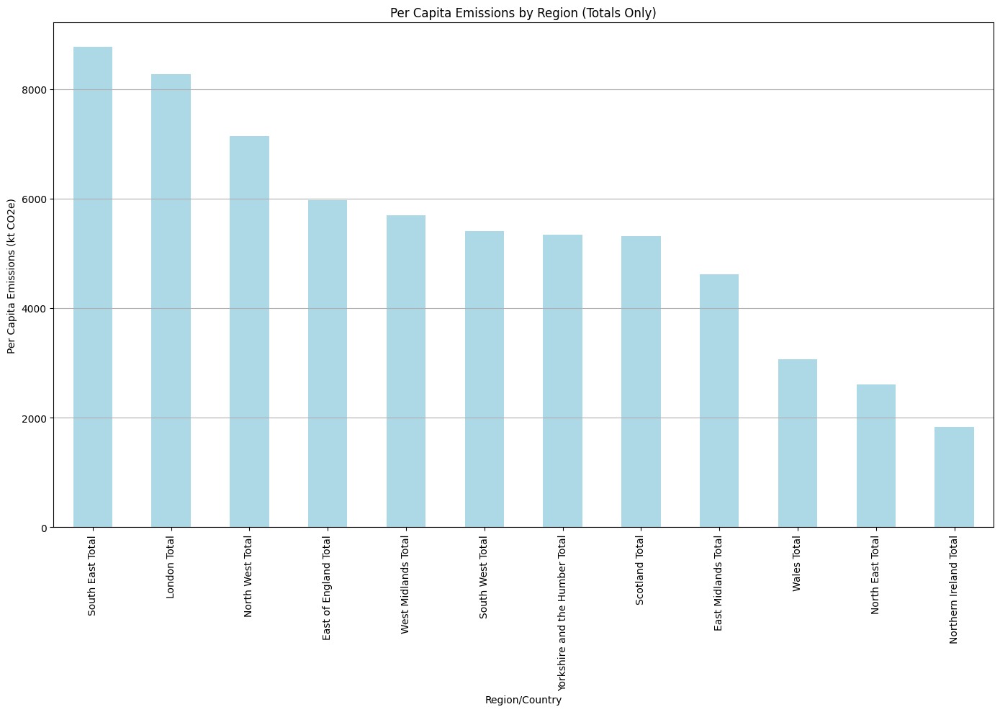

In [99]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter for only rows where 'Region/Country' ends with 'Total' also without 'National Total' and 'England Total'
# filtered_average_emissions = average_emissions[average_emissions.index.str.endswith('Total')]
filtered_average_emissions = average_emissions[average_emissions.index.str.endswith('Total') & ~(average_emissions.index.isin(['National Total', 'England Total']))]


# Sort the regions based on average per capita emissions
sorted_per_capita = filtered_average_emissions['Per Capita Emissions'].sort_values(ascending=False)

# Plotting average per capita emissions for each region
plt.figure(figsize=(14, 10))
sorted_per_capita.plot(kind='bar', color='lightblue')
plt.title('Per Capita Emissions by Region (Totals Only)')
plt.ylabel('Per Capita Emissions (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

<h1>Per capita emissions refer to the average release of emissions (carbon dioxide, CO2) attributed to each individual within a certain population.</h1>

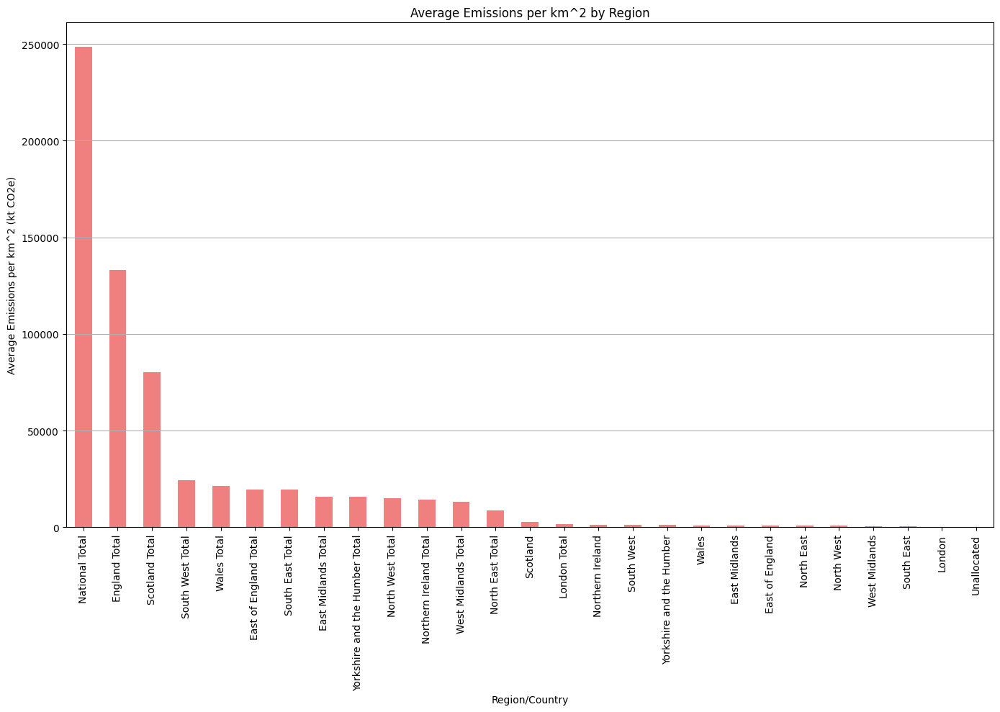

In [100]:
# Sort the regions based on average emissions per km^2
sorted_per_km2 = average_emissions['Emissions per km^2'].sort_values(ascending=False)

# Plotting average emissions per km^2 for each region
plt.figure(figsize=(14, 10))
sorted_per_km2.plot(kind='bar', color='lightcoral')
plt.title('Average Emissions per km^2 by Region')
plt.ylabel('Average Emissions per km^2 (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [101]:
sorted_per_km2



Region/Country
National Total                    248717.570600
England Total                     132929.086100
Scotland Total                     80232.836400
South West Total                   24385.758100
Wales Total                        21225.884000
East of England Total              19584.438300
South East Total                   19400.106000
East Midlands Total                15810.724100
Yorkshire and the Humber Total     15560.501300
North West Total                   14914.430300
Northern Ireland Total             14329.764100
West Midlands Total                13003.738100
North East Total                    8674.693000
Scotland                            2507.276138
London Total                        1594.696900
Northern Ireland                    1302.705827
South West                          1174.519568
Yorkshire and the Humber            1073.304277
Wales                                964.812909
East Midlands                        775.042820
East of England          

In [102]:
sorted_per_km2.values

array([2.48717571e+05, 1.32929086e+05, 8.02328364e+04, 2.43857581e+04,
       2.12258840e+04, 1.95844383e+04, 1.94001060e+04, 1.58107241e+04,
       1.55605013e+04, 1.49144303e+04, 1.43297641e+04, 1.30037381e+04,
       8.67469300e+03, 2.50727614e+03, 1.59469690e+03, 1.30270583e+03,
       1.17451957e+03, 1.07330428e+03, 9.64812909e+02, 7.75042820e+02,
       7.55488316e+02, 7.22891083e+02, 6.49704917e+02, 5.86214827e+02,
       4.97128019e+02, 4.83241485e+01,            nan])

In [103]:

print(sorted_per_km2.index)

Index(['National Total', 'England Total', 'Scotland Total', 'South West Total',
       'Wales Total', 'East of England Total', 'South East Total',
       'East Midlands Total', 'Yorkshire and the Humber Total',
       'North West Total', 'Northern Ireland Total', 'West Midlands Total',
       'North East Total', 'Scotland', 'London Total', 'Northern Ireland',
       'South West', 'Yorkshire and the Humber', 'Wales', 'East Midlands',
       'East of England', 'North East', 'North West', 'West Midlands',
       'South East', 'London', 'Unallocated'],
      dtype='object', name='Region/Country')


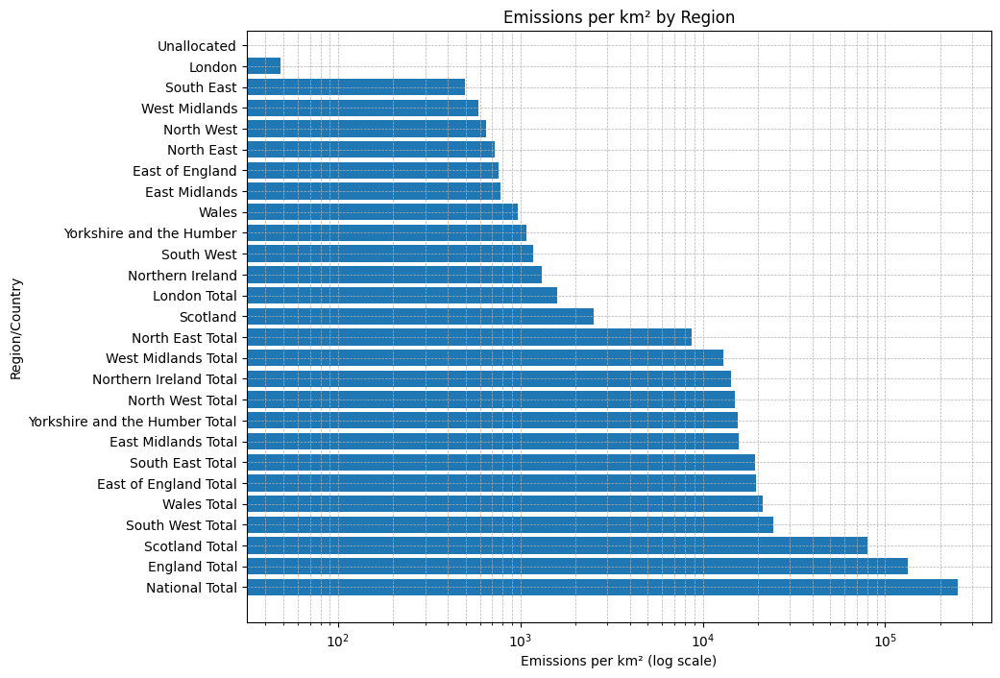

In [104]:
plt.figure(figsize=(10, 8))
plt.barh(sorted_per_km2.index, sorted_per_km2.values)
plt.xscale('log')  # Using logarithmic scale due to wide range of values
plt.xlabel('Emissions per km² (log scale)')
plt.ylabel('Region/Country')
plt.title('Emissions per km² by Region')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

In [105]:
individual_regions = sorted_per_km2[~sorted_per_km2.index.str.contains('Total') & ~(sorted_per_km2.index.isin(['Unallocated']))]


In [106]:
individual_regions

Region/Country
Scotland                    2507.276138
Northern Ireland            1302.705827
South West                  1174.519568
Yorkshire and the Humber    1073.304277
Wales                        964.812909
East Midlands                775.042820
East of England              755.488316
North East                   722.891083
North West                   649.704917
West Midlands                586.214827
South East                   497.128019
London                        48.324148
Name: Emissions per km^2, dtype: float64

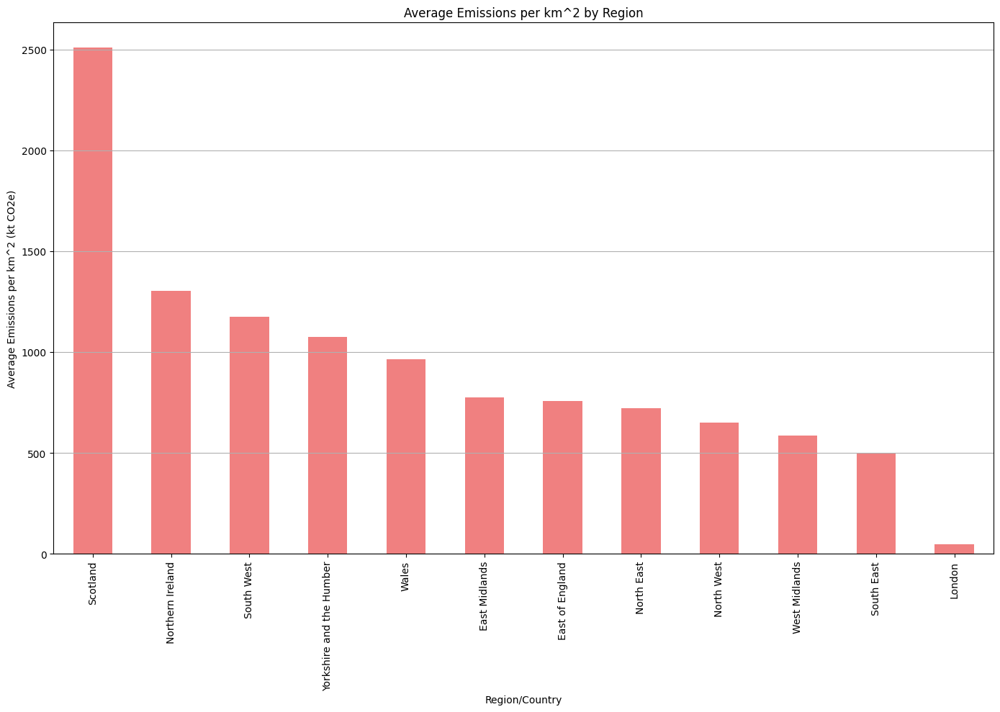

In [107]:
plt.figure(figsize=(14, 10))
individual_regions.plot(kind='bar', color='lightcoral')
plt.title('Average Emissions per km^2 by Region')
plt.ylabel('Average Emissions per km^2 (kt CO2e)')
plt.xlabel('Region/Country')
plt.xticks(rotation=90)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

Average Emissions per km² by Region refers to a measure used to understand the density of emissions in a given area. This metric provides an average value of emissions (carbon dioxide, CO2) distributed over the total land area of a region, expressed in square kilometers (km²)

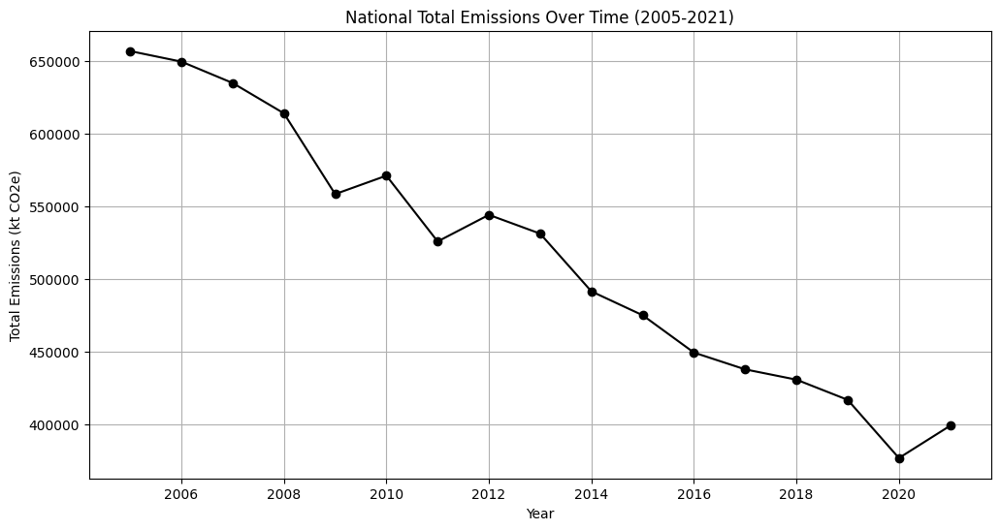

In [108]:
# Filter the data for 'National Total' and group by 'Calendar Year' to get yearly national emissions
national_emissions = data_1_1_actual[data_1_1_actual['Region/Country'] == 'National Total']
national_time_series = national_emissions.groupby('Calendar Year')['Grand Total'].sum()

# Plotting the national total emissions time series
plt.figure(figsize=(12, 6))
national_time_series.plot(marker='o', linestyle='-', color='black')
plt.title('National Total Emissions Over Time (2005-2021)')
plt.xlabel('Year')
plt.ylabel('Total Emissions (kt CO2e)')
plt.grid(True)
plt.show()

In [109]:
# Assuming data_1_1_actual is a pandas DataFrame with the relevant data
national_emissions = data_1_1_actual[data_1_1_actual['Region/Country'] == 'National Total']

# Group by 'Calendar Year' and sum the 'Grand Total'
national_time_series = national_emissions.groupby('Calendar Year')['Grand Total'].sum()

# Convert the Series back to a DataFrame and reset the index
national_time_series_table = national_time_series.reset_index()

# Display the DataFrame as a table
national_time_series_table

,Calendar Year,Grand Total
0,2005,656867.315366
1,2006,649603.223057
2,2007,634904.263654
3,2008,614046.665833
4,2009,558455.613837
5,2010,571129.481835
6,2011,525842.800141
7,2012,544172.639988
8,2013,531229.165974
9,2014,491490.767041


In [110]:
national_time_series_table['Grand Total'].mean()

515499.05076104676

<Axes: xlabel='Grand Total', ylabel='Count'>

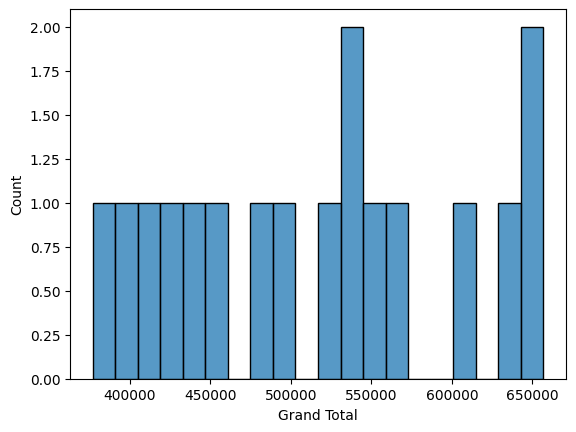

In [111]:
sns.histplot(data=national_time_series_table,x='Grand Total',bins=20)

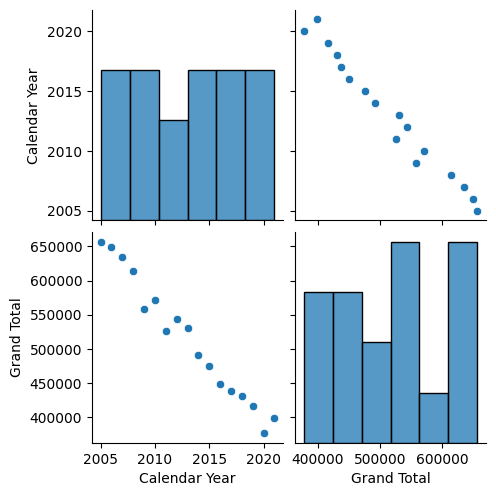

In [112]:
#sns.histplot(data=national_time_series_table,x='Grand Total',bins=20)
sns.pairplot(national_time_series_table)

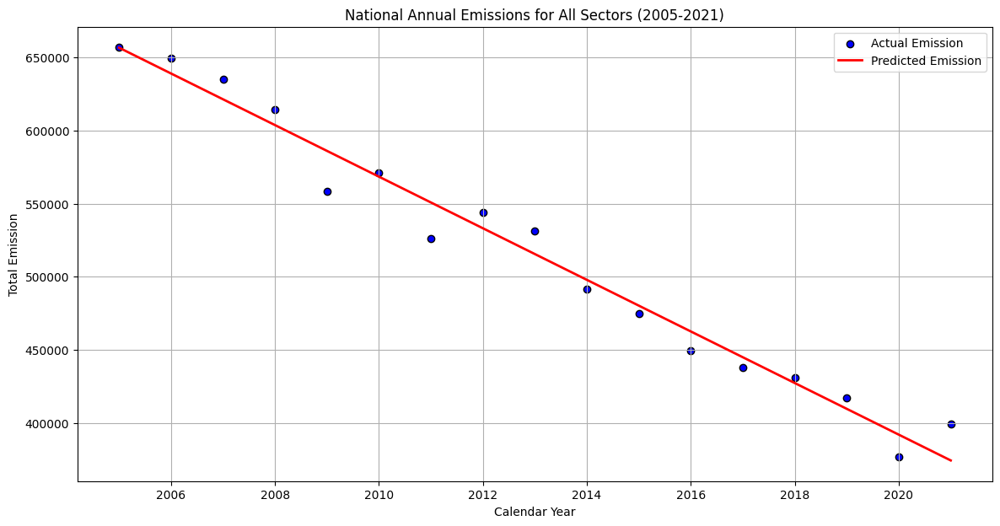

In [113]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Initialize the linear regression model
model = LinearRegression()

# Reshape the data and fit the model
X = national_time_series_table['Calendar Year'].values.reshape(-1, 1)  # Independent variable
y = national_time_series_table['Grand Total'].values  # Dependent variable
model.fit(X, y)

# Make predictions
national_time_series_table['Predicted Emission'] = model.predict(X)

# Coefficients
slope = model.coef_[0]
intercept = model.intercept_

# R^2 score
r_squared = model.score(X, y)

# Plotting the actual vs predicted values
plt.figure(figsize=(14, 7))
plt.scatter(X, y, color='blue', edgecolors='black', label='Actual Emission')
plt.plot(X, national_time_series_table['Predicted Emission'], color='red', linewidth=2, label='Predicted Emission')
plt.title('National Annual Emissions for All Sectors (2005-2021)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.grid(True)
plt.legend()
plt.show()

In [114]:
(slope, intercept, r_squared)

(-17644.370521085082, 36033616.90970531, 0.9742324674401649)

In [115]:
import numpy as np

# Predicting the emissions for the year 2024
year_2024 = np.array([[2024]])
emissions_2024 = model.predict(year_2024)
emissions_2024[0]

321410.97502910346

In [116]:
# Predicting the emissions for the year 2022
year_2022 = np.array([[2022]])
emissions_forecast_2022 = model.predict(year_2022)

emissions_forecast_2022[0]

356699.71607127786

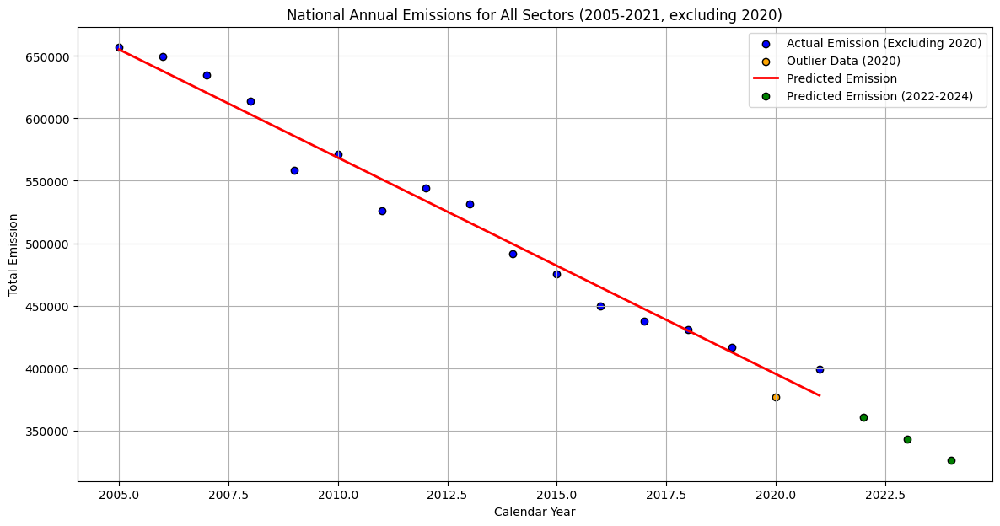

In [117]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Exclude the year 2020 from the dataset for training
training_data = national_time_series_table[national_time_series_table['Calendar Year'] != 2020]

# Initialize the linear regression model
model = LinearRegression()

# Reshape the data and fit the model
X_train = training_data['Calendar Year'].values.reshape(-1, 1)  # Independent variable (excluding 2020)
y_train = training_data['Grand Total'].values  # Dependent variable (excluding 2020)
model.fit(X_train, y_train)

# Make predictions for the entire dataset including 2020
X_full = national_time_series_table['Calendar Year'].values.reshape(-1, 1)
national_time_series_table['Predicted Emission'] = model.predict(X_full)

# Predictions for 2022 to 2024
future_years = np.array([[2022], [2023], [2024]])
future_predictions = model.predict(future_years)

# Coefficients and R^2 score
slope = model.coef_[0]
intercept = model.intercept_
r_squared = model.score(X_train, y_train)

# Plotting the actual vs predicted values
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', edgecolors='black', label='Actual Emission (Excluding 2020)')
plt.scatter([2020], national_time_series_table[national_time_series_table['Calendar Year'] == 2020]['Grand Total'], color='orange', edgecolors='black', label='Outlier Data (2020)')
plt.plot(X_full, national_time_series_table['Predicted Emission'], color='red', linewidth=2, label='Predicted Emission')
plt.scatter(future_years, future_predictions, color='green', edgecolors='black', label='Predicted Emission (2022-2024)')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.grid(True)
plt.legend()
plt.show()

In [118]:
# Extracting the predicted emissions for 2022, 2023, and 2024
predicted_2022 = future_predictions[0]
predicted_2023 = future_predictions[1]
predicted_2024 = future_predictions[2]

# Printing the predicted emissions
print(f"Predicted Emissions for 2022: {predicted_2022}")
print(f"Predicted Emissions for 2023: {predicted_2023}")
print(f"Predicted Emissions for 2024: {predicted_2024}")

Predicted Emissions for 2022: 360642.15265548974
Predicted Emissions for 2023: 343314.9896756634
Predicted Emissions for 2024: 325987.82669582963


In [119]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculating MSE, MAE, and R^2 score using the training data (excluding 2020)
mse = mean_squared_error(y_train, model.predict(X_train))
mae = mean_absolute_error(y_train, model.predict(X_train))
r2 = r2_score(y_train, model.predict(X_train))

# Printing the metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²) Score: {r2}")

Mean Squared Error (MSE): 192430790.51199067
Mean Absolute Error (MAE): 11517.010197188152
R-squared (R²) Score: 0.9719953551351923


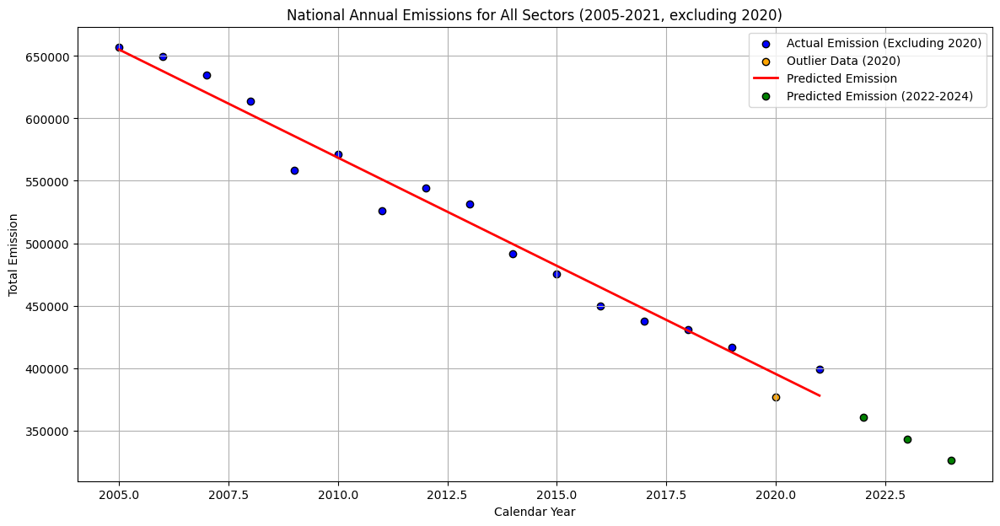

In [120]:
import pandas as pd
import numpy as np
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt

# Exclude the year 2020 from the dataset for training
training_data = national_time_series_table[national_time_series_table['Calendar Year'] != 2020]

# Reshape the data
X_train = training_data['Calendar Year'].values.reshape(-1, 1)  # Independent variable (excluding 2020)
y_train = training_data['Grand Total'].values  # Dependent variable (excluding 2020)

# It's important to scale features when using SGD
pipeline = make_pipeline(StandardScaler(), SGDRegressor(max_iter=1000, tol=1e-3))

# Train the SGD model
sgd_model = pipeline.fit(X_train, y_train)

# Make predictions for the entire dataset including 2020
X_full = national_time_series_table['Calendar Year'].values.reshape(-1, 1)
national_time_series_table['Predicted Emission'] = sgd_model.predict(X_full)

# Predictions for 2022 to 2024
future_years = np.array([[2022], [2023], [2024]])
future_predictions = sgd_model.predict(future_years)

# Plotting the actual vs predicted values
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', edgecolors='black', label='Actual Emission (Excluding 2020)')
plt.scatter([2020], national_time_series_table[national_time_series_table['Calendar Year'] == 2020]['Grand Total'], color='orange', edgecolors='black', label='Outlier Data (2020)')
plt.plot(X_full, national_time_series_table['Predicted Emission'], color='red', linewidth=2, label='Predicted Emission')
plt.scatter(future_years, future_predictions, color='green', edgecolors='black', label='Predicted Emission (2022-2024)')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.grid(True)
plt.legend()
plt.show()

In [121]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculating the metrics
mse = mean_squared_error(y_train, sgd_model.predict(X_train))
mae = mean_absolute_error(y_train, sgd_model.predict(X_train))
r2 = r2_score(y_train, sgd_model.predict(X_train))

# Printing the metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R²) Score: {r2}")

Mean Squared Error (MSE): 192432242.0479305
Mean Absolute Error (MAE): 11528.563599834313
R-squared (R²) Score: 0.9719951438917193


In [122]:
pip install statsmodels

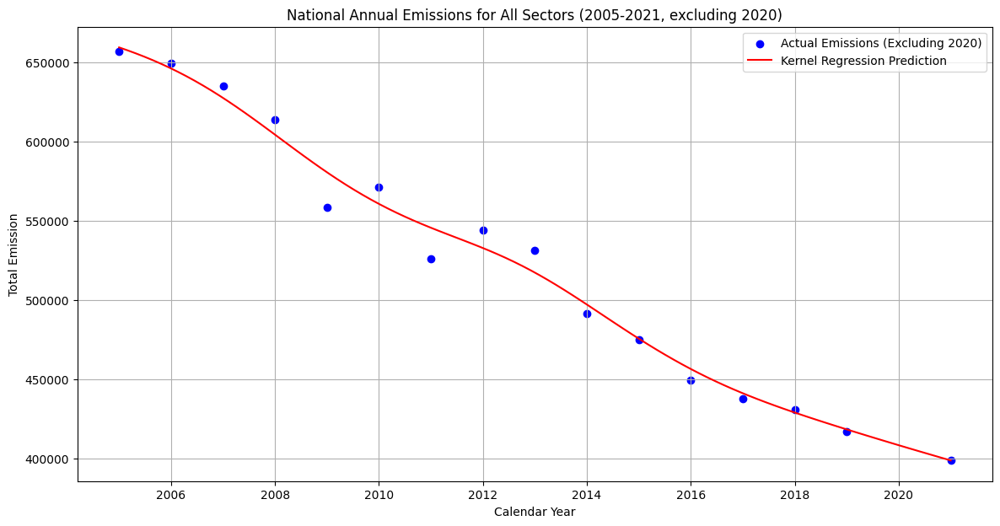

In [123]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kernel_regression import KernelReg


# considering using the data excluding the outlier year 2020
training_data = national_time_series_table[national_time_series_table['Calendar Year'] != 2020]

# Prepare the data
X_train = training_data['Calendar Year'].values
y_train = training_data['Grand Total'].values

# Kernel Regression
kr = KernelReg(endog=y_train, exog=X_train, var_type='c')  # 'c' for continuous
X_predict = np.linspace(X_train.min(), X_train.max(), 100)  # Range of years for prediction
y_kr, y_std = kr.fit(X_predict)

# Plotting the actual data and the kernel regression prediction
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', label='Actual Emissions (Excluding 2020)')
plt.plot(X_predict, y_kr, color='red', label='Kernel Regression Prediction')
#plt.fill_between(X_predict, y_kr - y_std, y_kr + y_std, color='red', alpha=0.2, label='Prediction Standard Error')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.legend()
plt.grid(True)
plt.show()

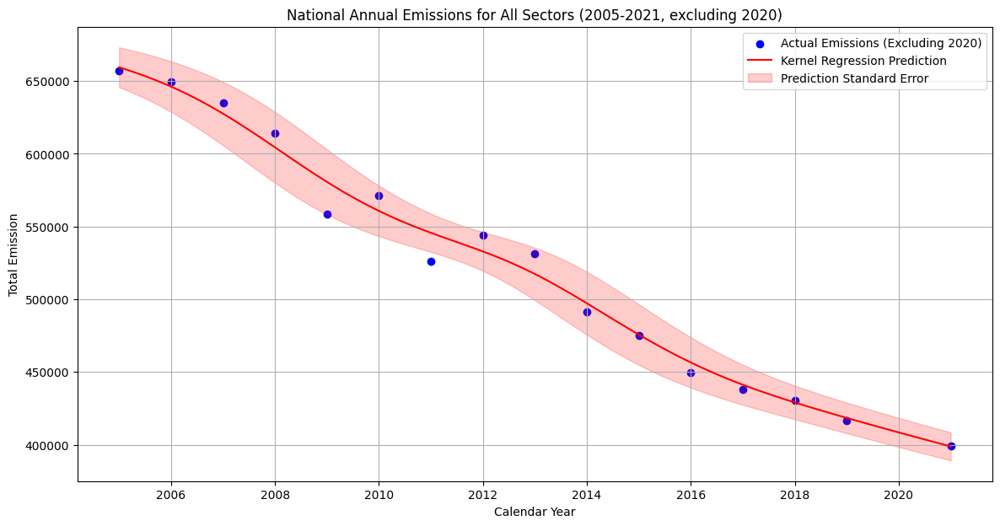

In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kernel_regression import KernelReg

# Considering using the data excluding the outlier year 2020
training_data = national_time_series_table[national_time_series_table['Calendar Year'] != 2020]

# Prepare the data
X_train = training_data['Calendar Year'].values
y_train = training_data['Grand Total'].values

# Kernel Regression
kr = KernelReg(endog=y_train, exog=X_train, var_type='c')  # 'c' for continuous
X_predict = np.linspace(X_train.min(), X_train.max(), 100)  # Range of years for prediction
y_kr, y_std = kr.fit(X_predict)

# Ensure y_kr and y_std are 1-dimensional
y_kr = np.squeeze(y_kr)
y_std = np.squeeze(y_std)

# Plotting the actual data and the kernel regression prediction
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', label='Actual Emissions (Excluding 2020)')
plt.plot(X_predict, y_kr, color='red', label='Kernel Regression Prediction')
plt.fill_between(X_predict, y_kr - y_std, y_kr + y_std, color='red', alpha=0.2, label='Prediction Standard Error')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.legend()
plt.grid(True)
plt.show()


In [125]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predictions on the training data
y_pred_train, _ = kr.fit(X_train)

# Calculating MSE and MAE
mse = mean_squared_error(y_train, y_pred_train)
mae = mean_absolute_error(y_train, y_pred_train)

# Printing the metrics
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")


Mean Squared Error (MSE): 98854665.3250708
Mean Absolute Error (MAE): 7560.483432559919


In [126]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
import numpy as np

# Define a range of bandwidths to test
bandwidths = np.linspace(0.1, 2, 20)

# Best bandwidth and score initialization
best_bandwidth = None
best_score = float('inf')

# K-Fold for cross-validation
kf = KFold(n_splits=5)

for bandwidth in bandwidths:
    mse_scores = []
    for train_index, test_index in kf.split(X_train):
        X_train_kf, X_test_kf = X_train[train_index], X_train[test_index]
        y_train_kf, y_test_kf = y_train[train_index], y_train[test_index]

        # Kernel Regression with the current bandwidth
        kr = KernelReg(endog=y_train_kf, exog=X_train_kf, var_type='c', bw=[bandwidth])
        y_pred_kf, _ = kr.fit(X_test_kf)

        # Calculate MSE for this fold
        mse = mean_squared_error(y_test_kf, y_pred_kf)
        mse_scores.append(mse)

    # Average MSE score for this bandwidth
    avg_mse = np.mean(mse_scores)
    if avg_mse < best_score:
        best_score = avg_mse
        best_bandwidth = bandwidth

# Best bandwidth
print(f"Best Bandwidth: {best_bandwidth}")

Best Bandwidth: 2.0


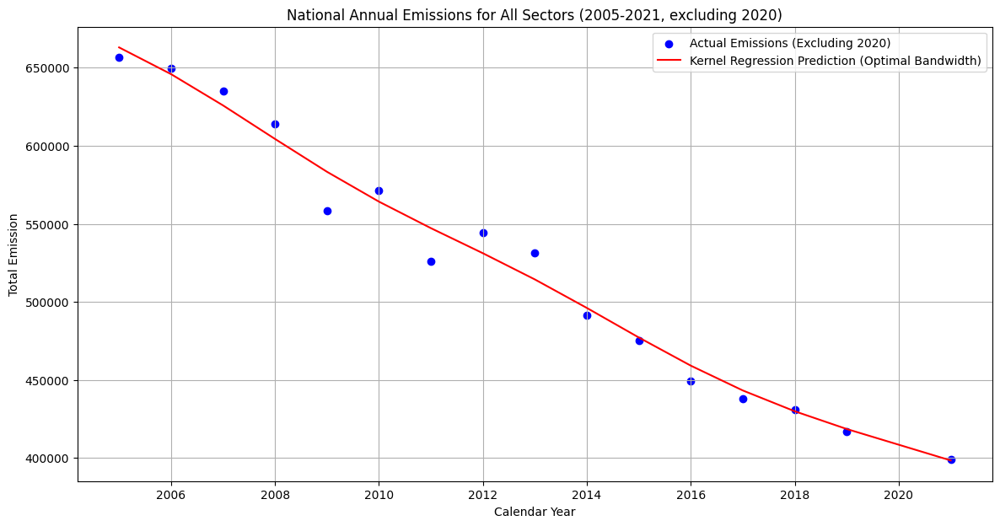

In [127]:
# Fitting the Kernel Regression model with the best bandwidth
kr_optimal = KernelReg(endog=y_train, exog=X_train, var_type='c', bw=[best_bandwidth])
y_pred_optimal, _ = kr_optimal.fit(X_train)

# Plotting
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', label='Actual Emissions (Excluding 2020)')
plt.plot(X_train, y_pred_optimal, color='red', label='Kernel Regression Prediction (Optimal Bandwidth)')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.legend()
plt.grid(True)
plt.show()

In [128]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Making predictions on the training data using the optimal bandwidth model
y_pred_optimal, _ = kr_optimal.fit(X_train)

# Calculating MSE and MAE
mse_optimal = mean_squared_error(y_train, y_pred_optimal)
mae_optimal = mean_absolute_error(y_train, y_pred_optimal)

# Printing the metrics
print(f"Mean Squared Error (MSE): {mse_optimal}")
print(f"Mean Absolute Error (MAE): {mae_optimal}")

Mean Squared Error (MSE): 122452257.76925173
Mean Absolute Error (MAE): 8541.347118299647


Mean Squared Error (MSE): 122454007.79715747
Mean Absolute Error (MAE): 8541.433550188427


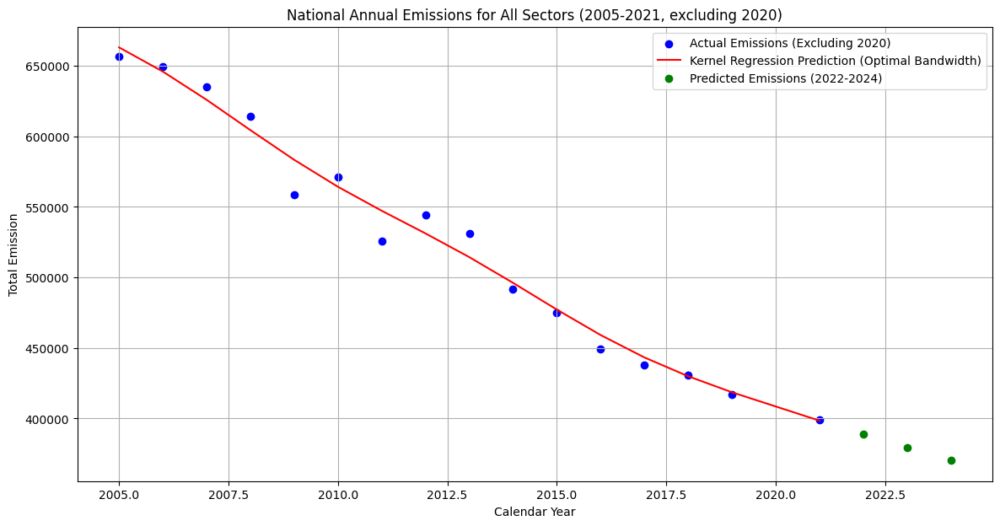

Predicted Emissions for 2022: 388856.1049887401
Predicted Emissions for 2023: 379455.74041452317
Predicted Emissions for 2024: 370225.2050343967


In [129]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.nonparametric.kernel_regression import KernelReg
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Creating a sample DataFrame based on the data
data = {
    'Calendar Year': [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2021],
    'Grand Total': [
        656867, 649603, 634904, 614046, 558455, 571129, 525842, 544172, 531229, 491490, 475077, 449383, 437824, 430745, 416856, 399046
    ]
}
national_time_series_table = pd.DataFrame(data)

# Exclude the year 2020 from the dataset for training
training_data = national_time_series_table

# Prepare the data
X_train = training_data['Calendar Year'].values
y_train = training_data['Grand Total'].values

# Best bandwidth (as obtained from previous grid search)
best_bandwidth = 2.0

# Kernel Regression with the optimal bandwidth
kr_optimal = KernelReg(endog=y_train, exog=X_train, var_type='c', bw=[best_bandwidth])
y_pred_optimal, _ = kr_optimal.fit(X_train)

# Calculating MSE and MAE
mse_optimal = mean_squared_error(y_train, y_pred_optimal)
mae_optimal = mean_absolute_error(y_train, y_pred_optimal)

# Predicting emissions for 2022, 2023, and 2024
future_years = np.array([2022, 2023, 2024]).reshape(-1, 1)
future_predictions, _ = kr_optimal.fit(future_years)

# Printing the metrics
print(f"Mean Squared Error (MSE): {mse_optimal}")
print(f"Mean Absolute Error (MAE): {mae_optimal}")

# Plotting the actual data, kernel regression prediction, and future predictions
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', label='Actual Emissions (Excluding 2020)')
plt.plot(X_train, y_pred_optimal, color='red', label='Kernel Regression Prediction (Optimal Bandwidth)')
plt.scatter(future_years, future_predictions, color='green', marker='o', label='Predicted Emissions (2022-2024)')
plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.legend()
plt.grid(True)
plt.show()

# Print predicted emissions for 2022, 2023, and 2024
for year, prediction in zip(range(2022, 2025), future_predictions):
    print(f"Predicted Emissions for {year}: {prediction}")

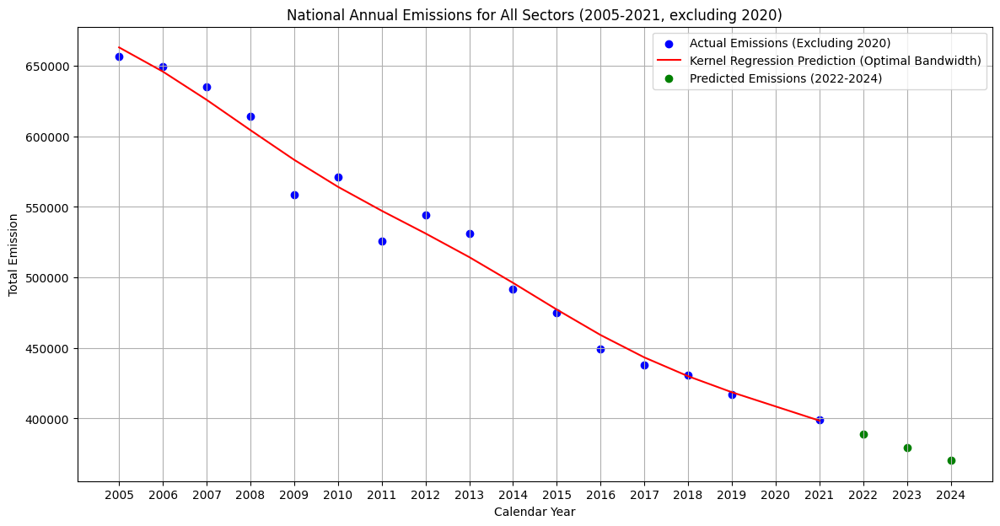

Predicted Emissions for 2022: 388856.1049887401
Predicted Emissions for 2023: 379455.74041452317
Predicted Emissions for 2024: 370225.2050343967


In [130]:
# Plotting the actual data, kernel regression prediction, and future predictions
plt.figure(figsize=(14, 7))
plt.scatter(X_train, y_train, color='blue', label='Actual Emissions (Excluding 2020)')
plt.plot(X_train, y_pred_optimal, color='red', label='Kernel Regression Prediction (Optimal Bandwidth)')
plt.scatter(future_years, future_predictions, color='green', marker='o', label='Predicted Emissions (2022-2024)')

# Adjust x-axis to show each year
plt.xticks(np.arange(min(X_train), max(future_years) + 1, 1.0))

plt.title('National Annual Emissions for All Sectors (2005-2021, excluding 2020)')
plt.xlabel('Calendar Year')
plt.ylabel('Total Emission')
plt.legend()
plt.grid(True)
plt.show()

# Print predicted emissions for 2022, 2023, and 2024
for year, prediction in zip(range(2022, 2025), future_predictions):
    print(f"Predicted Emissions for {year}: {prediction}")

<h1>ARIMA</h1>

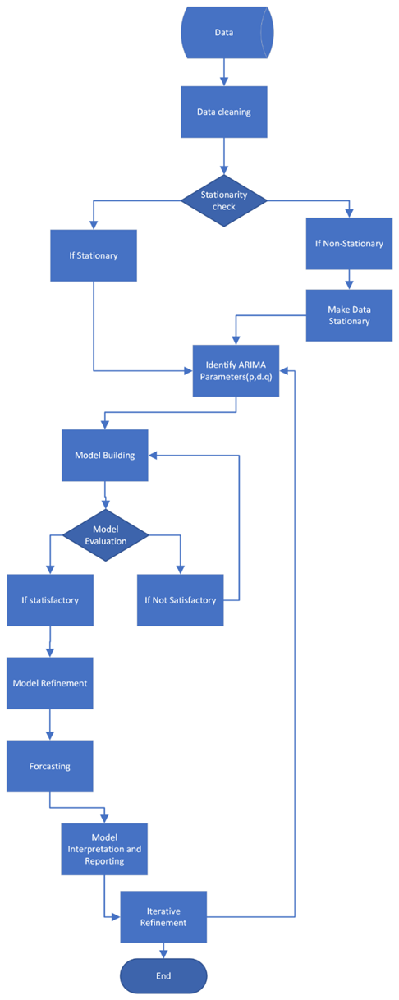

In [131]:
# 1. Data Preparation
import pandas as pd

url = 'https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/1166194/2005-21-uk-local-authority-ghg-emissions.xlsx'
data_1_1_cleaned = pd.read_excel(url, sheet_name='1_1', skiprows=4)


In [132]:
# Filter the data for the "West Midlands" Region/Country
data_1_1_cleaned = data_1_1_cleaned[data_1_1_cleaned['Region/Country'] == 'West Midlands']
# Filter out rows where "Second Tier Authority" ends with "Total"
data_1_1_cleaned = data_1_1_cleaned[~data_1_1_cleaned['Second Tier Authority'].str.endswith("Total")]

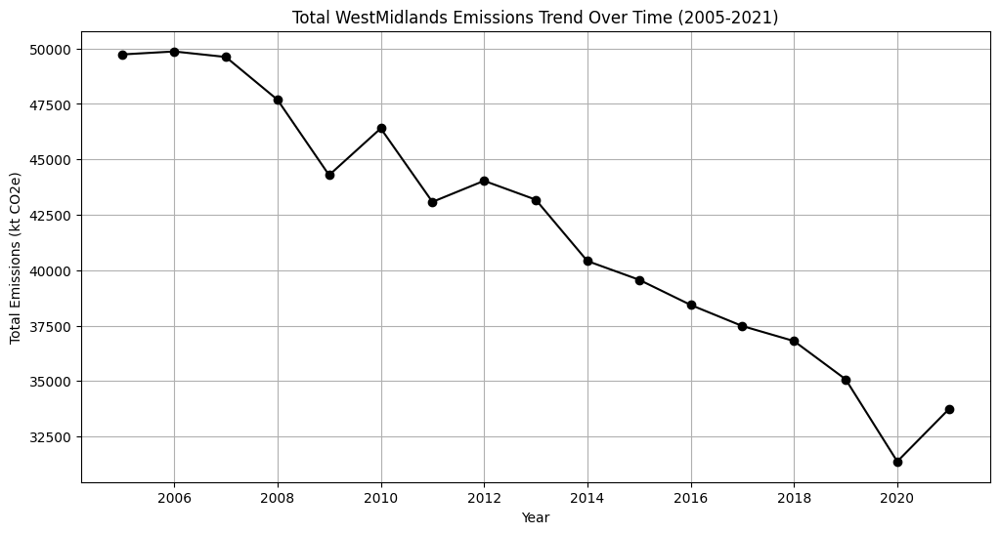

Calendar Year
2005    49732.222417
2006    49865.040184
2007    49616.825647
2008    47689.374420
2009    44287.997799
2010    46396.818960
2011    43080.033683
2012    44031.880064
2013    43181.893928
2014    40413.744458
2015    39570.616279
2016    38433.656517
2017    37482.255734
2018    36805.003905
2019    35080.103036
2020    31372.640144
2021    33736.855308
Name: Grand Total, dtype: float64

In [133]:
import matplotlib.pyplot as plt

# Group by 'Calendar Year' and sum the 'Grand Total' column to get total emissions for each year
yearly_emissions = data_1_1_cleaned.groupby('Calendar Year')['Grand Total'].sum()

yearly_emissions_ = pd.DataFrame(yearly_emissions)

# Plotting the trend over time
plt.figure(figsize=(12, 6))
yearly_emissions.plot(marker='o', linestyle='-', color='black')
plt.title('Total WestMidlands Emissions Trend Over Time (2005-2021)')
plt.xlabel('Year')
plt.ylabel('Total Emissions (kt CO2e)')
plt.grid(True)
plt.show()
yearly_emissions

In [134]:
from statsmodels.tsa.stattools import adfuller

#Augmented Dickey-Fuller test is used to test for the stationarity of a time series
adf_test = adfuller(yearly_emissions_['Grand Total'])
adf_test_output = pd.Series(adf_test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

In [135]:
# Adding critical values
for key, value in adf_test[4].items():
    adf_test_output[f'Critical Value ({key})'] = value

In [136]:
adf_test_output

Test Statistic                  1.644176
p-value                         0.997984
#Lags Used                      6.000000
Number of Observations Used    10.000000
Critical Value (1%)            -4.331573
Critical Value (5%)            -3.232950
Critical Value (10%)           -2.748700
dtype: float64

p-value = 0.997984
Given the p-value is larger than 0.05, it suggest non-stationary data hence an attempt to difference the data

because p-value is greater than 0.05 this indicated that its non-stationary hence differencing is required

In [137]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Differencing the data to make it stationary
df_diff = yearly_emissions_['Grand Total'].diff().dropna()

adf_test_diff = adfuller(df_diff)
adf_test_diff_output = pd.Series(adf_test_diff[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])

adf_test_diff_output

Test Statistic                 -5.102136
p-value                         0.000014
#Lags Used                      1.000000
Number of Observations Used    14.000000
dtype: float64

Now p-value 0.000014 is acceptable.
That suggest (d=1)

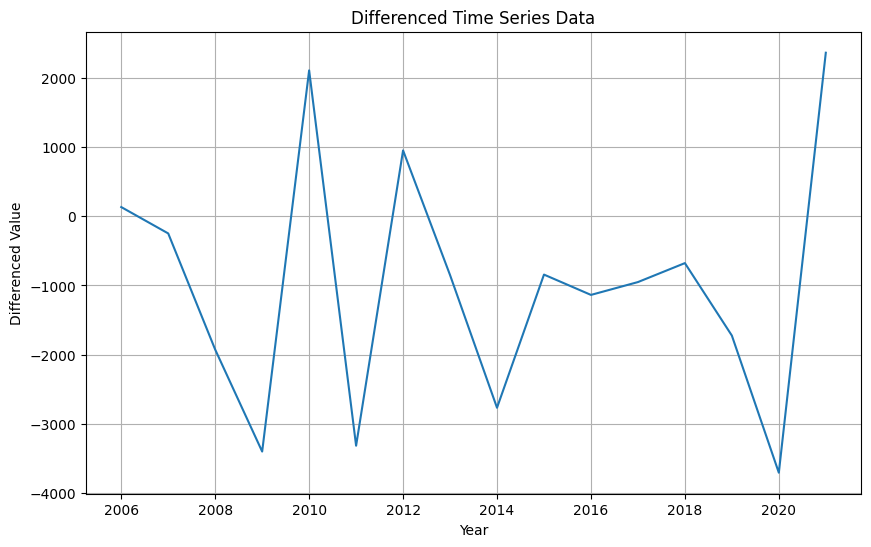

In [138]:
# Plotting the differenced data
plt.figure(figsize=(10, 6))
plt.plot(df_diff)
plt.title('Differenced Time Series Data')
plt.xlabel('Year')
plt.ylabel('Differenced Value')
plt.grid(True)
plt.show()

For the AR and MA(p and q)

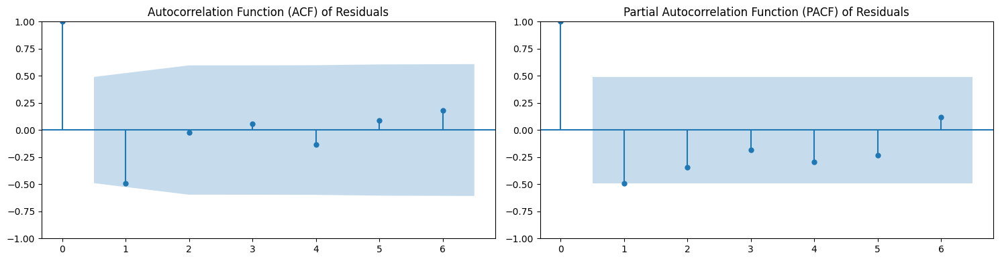

In [139]:
 #ACF and PACF of residuals with fewer lags
fig, ax = plt.subplots(1, 2, figsize=(15, 4))

# ACF plot
plot_acf(df_diff, ax=ax[0], lags=6)
ax[0].set_title('Autocorrelation Function (ACF) of Residuals')

# PACF plot
plot_pacf(df_diff, ax=ax[1], lags=6)
ax[1].set_title('Partial Autocorrelation Function (PACF) of Residuals')

plt.tight_layout()
plt.show()

Differencing happen once (d=1), Picking p = 1 and q = 1 from the above plot

In [140]:
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Filter out the specific warning message
warnings.simplefilter("ignore", category=Warning)


# Fitting the ARIMA model with the determined parameters (p=1, d=1, q=1)
model = ARIMA(yearly_emissions_['Grand Total'], order=(1, 1, 1))
model_fit = model.fit()

# Summarizing the model output
model_summary = model_fit.summary()
model_summary


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:            Grand Total   No. Observations:                   17
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -142.429
Date:                Sun, 11 Feb 2024   AIC                            290.858
Time:                        00:10:15   BIC                            293.175
Sample:                             0   HQIC                           290.976
                                 - 17                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9270      0.047     19.674      0.000       0.835       1.019
ma.L1         -0.9999      0.460     -2.174      0.030      -1.902      -0.098
sigma2      3.132e+06   1.47e-07   2.14e+13      0.000    3.13e+06    3.13e+06
===================================================================================
Ljung-Box (L1) (Q):                   3.15   Jarque-Bera (JB):                 0.47
Prob(Q):                              0.08   Prob(JB):                         0.79
Heteroskedasticity (H):               1.06   Skew:                             0.15
Prob(H) (two-sided):                  0.95   Kurtosis:                         2.22
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.19e+28. Standard errors may be unstable.
"""

In [141]:
# Forecasting future values using the ARIMA(1,1,1) model
forecast_periods = 5  # forecasting for next 5 years

# Forecasting future values
forecast = model_fit.forecast(steps=forecast_periods)
print(forecast)

17    33459.620002
18    33202.613189
19    32964.358894
20    32743.488839
21    32538.734582
Name: predicted_mean, dtype: float64


In [142]:
# iterating over the ARIMA model
fitted_values = model_fit.predict(start=1, end=len(yearly_emissions_['Grand Total']))

# Printing the fitted values
print(fitted_values)

1     48344.756406
2     48521.854537
3     48329.290745
4     46521.264575
5     43296.417748
6     45347.749297
7     42204.603475
8     43140.477064
9     42353.687898
10    39733.880016
11    38947.878181
12    37880.404265
13    36988.257415
14    36355.859160
15    34725.826942
16    31209.360027
17    33459.620002
Name: predicted_mean, dtype: float64


In [143]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Actual values from 2006 to 2021
actual_values = [49865.040184, 49616.825647, 47689.374420, 44287.997799, 46396.818960,
                 43080.033683, 44031.880064, 43181.893928, 40413.744458, 39570.616279,
                 38433.656517, 37482.255734, 36805.003905, 35080.103036, 31372.640144,
                 33736.855308]

# Fitted values from your model for the same years
fitted_values = [48344.756378, 48521.854516, 48329.290731, 46521.264576, 43296.417769,
                 45347.749311, 42204.603509, 43140.477094, 42353.687935, 39733.880070,
                 38947.878241, 37880.404331, 36988.257487, 36355.859235, 34725.827027,
                 31209.360134]

mse = mean_squared_error(actual_values, fitted_values)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual_values, fitted_values)
r2 = r2_score(actual_values, fitted_values)

print("MSE:", mse)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2 Score:", r2)

MSE: 3156817.9134824006
RMSE: 1776.7436262675606
MAE: 1442.5323537499994
R2 Score: 0.8933601637161586


<h1>Model Calibration</h1>

<h1>LSTM</h1>


In [144]:
# 1. Data Preparation
import pandas as pd

url = 'https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/1166194/2005-21-uk-local-authority-ghg-emissions.xlsx'
data_1_1_cleaned = pd.read_excel(url, sheet_name='1_1', skiprows=4)

In [145]:
# Filter the data for the "West Midlands" Region/Country
data_1_1_cleaned = data_1_1_cleaned[data_1_1_cleaned['Region/Country'] == 'West Midlands']
# Filter out rows where "Second Tier Authority" ends with "Total"
data_1_1_cleaned = data_1_1_cleaned[~data_1_1_cleaned['Second Tier Authority'].str.endswith("Total")]


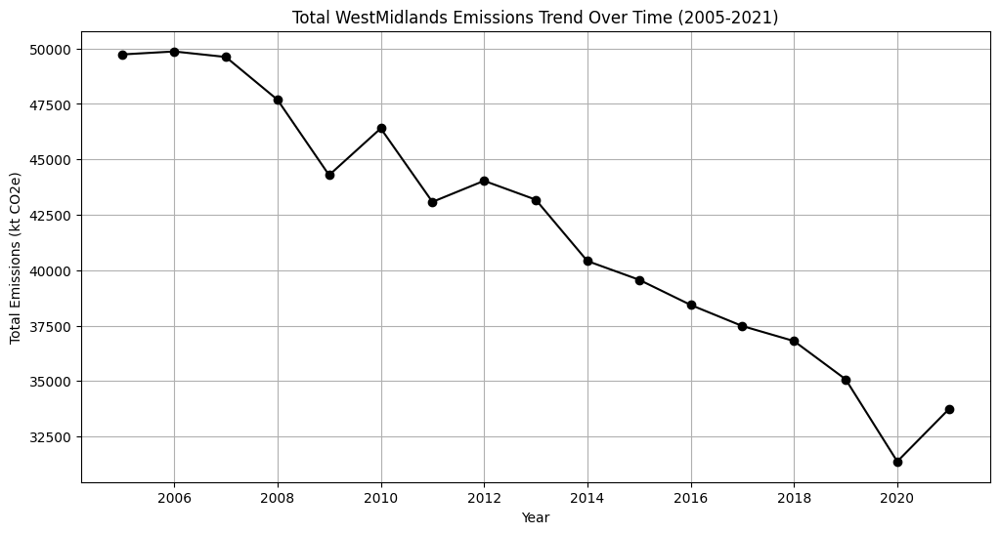

Calendar Year
2005    49732.222417
2006    49865.040184
2007    49616.825647
2008    47689.374420
2009    44287.997799
2010    46396.818960
2011    43080.033683
2012    44031.880064
2013    43181.893928
2014    40413.744458
2015    39570.616279
2016    38433.656517
2017    37482.255734
2018    36805.003905
2019    35080.103036
2020    31372.640144
2021    33736.855308
Name: Grand Total, dtype: float64

In [146]:
import matplotlib.pyplot as plt

# Group by 'Calendar Year' and sum the 'Grand Total' column to get total emissions for each year
yearly_emissions = data_1_1_cleaned.groupby('Calendar Year')['Grand Total'].sum()

yearly_emissions_ = pd.DataFrame(yearly_emissions)

# Plotting the trend over time
plt.figure(figsize=(12, 6))
yearly_emissions.plot(marker='o', linestyle='-', color='black')
plt.title('Total WestMidlands Emissions Trend Over Time (2005-2021)')
plt.xlabel('Year')
plt.ylabel('Total Emissions (kt CO2e)')
plt.grid(True)
plt.show()
yearly_emissions

In [147]:
pip install tensorflow

In [148]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Convert the Series to a DataFrame
yearly_emissions_df = yearly_emissions.to_frame()

# Normalize the dataset using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_emissions = scaler.fit_transform(yearly_emissions_df)

# Spliting the data into training and testing sets
train_size = int(len(scaled_emissions) * 0.67)
test_size = len(scaled_emissions) - train_size
train, test = scaled_emissions[0:train_size,:], scaled_emissions[train_size:len(scaled_emissions),:]

# Convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

#def create_dataset(dataset, look_back=1):
#    dataX, dataY = [], []
#    for i in range(len(dataset)-look_back):
#        a = dataset[i:(i+look_back), 0]
#        dataX.append(a)
#        dataY.append(dataset[i + look_back, 0])
#    return np.array(dataX), np.array(dataY)

#def create_dataset(dataset, look_back=1):
#    dataX, dataY = [], []
#    for i in range(len(dataset)-look_back):
#        a = dataset[i:(i+look_back), 0]
#        dataX.append(a)
#        dataY.append(dataset[i + look_back])
#    return np.array(dataX), np.array(dataY)



# Reshape the data into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

# Reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

# Create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
#model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
history = model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2, validation_data=(testX, testY))

# Make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

# Invert predictions to original scale
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
#trainY = scaler.inverse_transform(trainY)
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
#testY = scaler.inverse_transform(testY)

#testY = testY.reshape(-1, 1)  # Reshape testY to 2D
#testY = scaler.inverse_transform(testY)

# Calculate root mean squared error
trainScore = np.sqrt(np.mean((trainPredict[:,0] - trainY[0]) ** 2))
testScore = np.sqrt(np.mean((testPredict[:,0] - testY[0]) ** 2))

print('Train Score: %.2f RMSE' % trainScore)
print('Test Score: %.2f RMSE' % testScore)

Epoch 1/100
9/9 - 4s - loss: 0.9877 - val_loss: 0.1006 - 4s/epoch - 401ms/step
Epoch 2/100
9/9 - 0s - loss: 0.9446 - val_loss: 0.0908 - 61ms/epoch - 7ms/step
Epoch 3/100
9/9 - 0s - loss: 0.9008 - val_loss: 0.0820 - 47ms/epoch - 5ms/step
Epoch 4/100
9/9 - 0s - loss: 0.8632 - val_loss: 0.0737 - 60ms/epoch - 7ms/step
Epoch 5/100
9/9 - 0s - loss: 0.8244 - val_loss: 0.0665 - 49ms/epoch - 5ms/step
Epoch 6/100
9/9 - 0s - loss: 0.7915 - val_loss: 0.0597 - 45ms/epoch - 5ms/step
Epoch 7/100
9/9 - 0s - loss: 0.7566 - val_loss: 0.0539 - 47ms/epoch - 5ms/step
Epoch 8/100
9/9 - 0s - loss: 0.7261 - val_loss: 0.0486 - 48ms/epoch - 5ms/step
Epoch 9/100
9/9 - 0s - loss: 0.6960 - val_loss: 0.0439 - 45ms/epoch - 5ms/step
Epoch 10/100
9/9 - 0s - loss: 0.6693 - val_loss: 0.0397 - 48ms/epoch - 5ms/step
Epoch 11/100
9/9 - 0s - loss: 0.6420 - val_loss: 0.0360 - 47ms/epoch - 5ms/step
Epoch 12/100
9/9 - 0s - loss: 0.6179 - val_loss: 0.0327 - 55ms/epoch - 6ms/step
Epoch 13/100
9/9 - 0s - loss: 0.5941 - val_loss: 

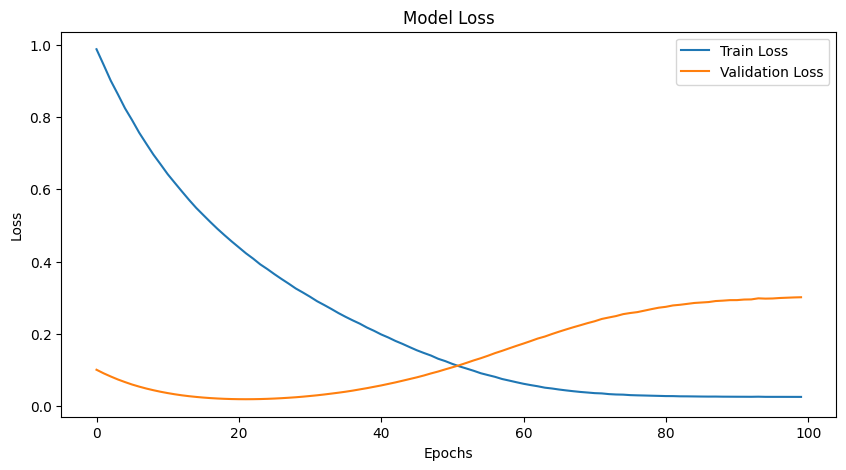

In [149]:
# Plot the training loss and validation loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')

plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(loc='upper right')
plt.show()

<h1>Regression Analysis</h1>

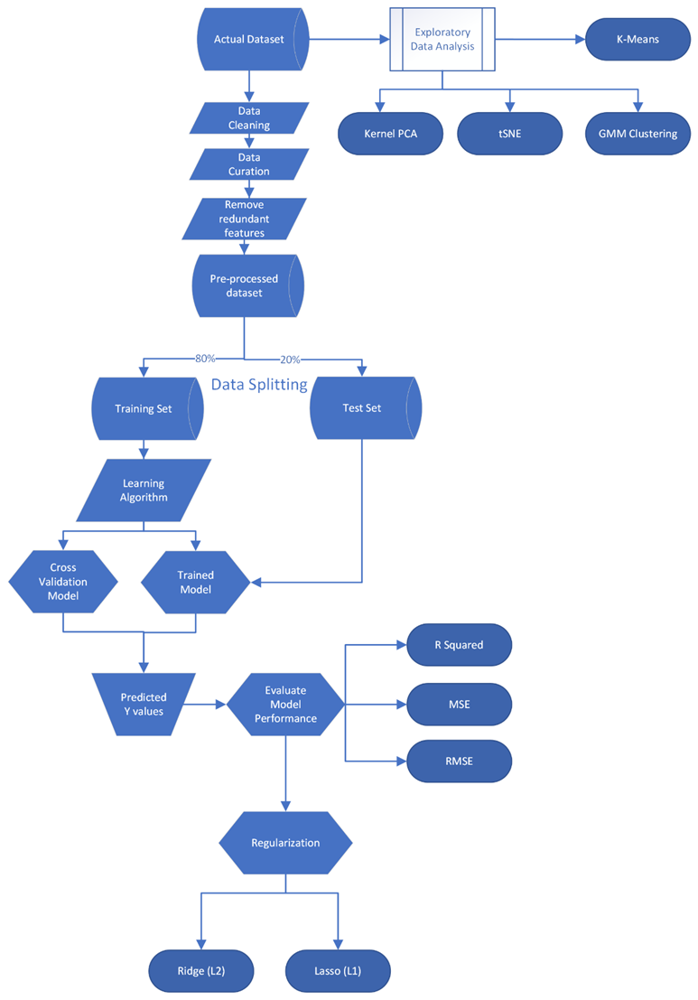

<h1>K-Means</h1>

- Understanding Cluster
- History and Intuition of K-Means
- Mathematical Theory of K-Means
- Implementation Of K-Means
- Limitations of K-Means

<p><b>Clustering</b> is a technique for grouping a set of objects in such a way that similiar objects fall in the same group.</p>

<p>Cluster Analysis refers to a family of algorithms and tasks rather than one specific algorithm.</p>

<p> Clustering uses unlabeled data and looks for similarities between groups(Clusters) in order to attempt to segment the data into separate clusters </p>



In [150]:
#Considering the dataset and features to understand the Clusters each feature belongs to...
west_midlands_local_authority_emissions


Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [151]:
west_midlands_local_authority_emissions.index

Index(['Birmingham', 'Bromsgrove', 'Cannock Chase', 'Coventry', 'Dudley',
       'East Staffordshire', 'Herefordshire, County of', 'Lichfield',
       'Malvern Hills', 'Newcastle-under-Lyme', 'North Warwickshire',
       'Nuneaton and Bedworth', 'Redditch', 'Rugby', 'Sandwell', 'Shropshire',
       'Solihull', 'South Staffordshire', 'Stafford',
       'Staffordshire Moorlands', 'Stoke-on-Trent', 'Stratford-on-Avon',
       'Tamworth', 'Telford and Wrekin', 'Walsall', 'Warwick', 'Wolverhampton',
       'Worcester', 'Wychavon', 'Wyre Forest', 'Total'],
      dtype='object', name='Local Authority')

In [152]:
west_midlands_local_authority_emissions.columns

Int64Index([2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
            2016, 2017, 2018, 2019, 2020, 2021],
           dtype='int64', name='Calendar Year')

In [153]:
west_midlands_local_authority_emissions.shape


(31, 17)

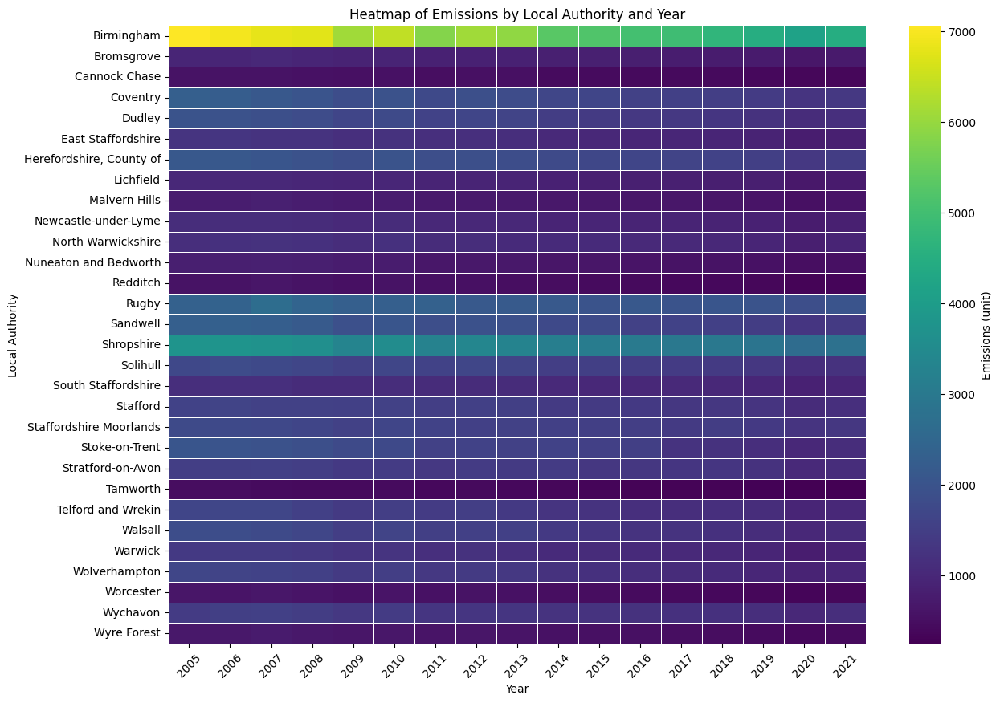

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt

heatmap_data = west_midlands_local_authority_emissions.drop('Total')

plt.figure(figsize=(14, 10))
sns.heatmap(data=heatmap_data, cmap='viridis', annot=False, fmt='.1f',
            linewidths=.5, cbar_kws={'label': 'Emissions (unit)'})

plt.title('Heatmap of Emissions by Local Authority and Year')
plt.xlabel('Year')
plt.ylabel('Local Authority')
plt.xticks(rotation=45)
plt.show()


In [155]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

data = west_midlands_local_authority_emissions.drop('Total')

scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)


In [156]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])


In [157]:
pca.components_

array([[ 0.24192287,  0.24223511,  0.24255641,  0.24253435,  0.2427949 ,
         0.24279934,  0.24297813,  0.24273366,  0.24292687,  0.2429049 ,
         0.24289228,  0.24270512,  0.24273703,  0.24222308,  0.2420564 ,
         0.24205745,  0.24204334],
       [-0.37627222, -0.32392438, -0.20941655, -0.25328571, -0.15938166,
        -0.1853121 , -0.03843648, -0.16302679, -0.11623624,  0.05613084,
         0.03268356,  0.17266696,  0.18846076,  0.3249652 ,  0.36153544,
         0.34600303,  0.34437717]])

In [158]:
df_comp = pd.DataFrame(pca.components_,index=['PC1','PC2'],columns=data.columns)

In [159]:
df_comp

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
PC1,0.241923,0.242235,0.242556,0.242534,0.242795,0.242799,0.242978,0.242734,0.242927,0.242905,0.242892,0.242705,0.242737,0.242223,0.242056,0.242057,0.242043
PC2,-0.376272,-0.323924,-0.209417,-0.253286,-0.159382,-0.185312,-0.038436,-0.163027,-0.116236,0.056131,0.032684,0.172667,0.188461,0.324965,0.361535,0.346003,0.344377


<Axes: xlabel='Calendar Year'>

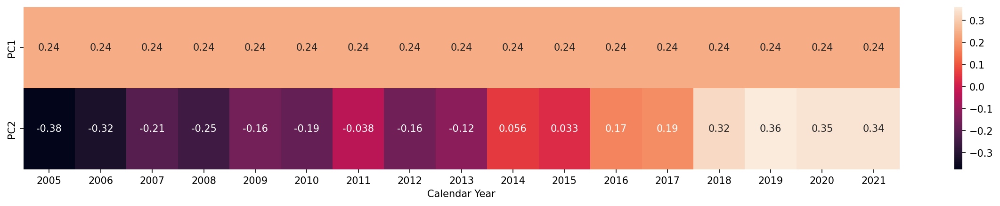

In [160]:
plt.figure(figsize=(20,3),dpi=150)
sns.heatmap(df_comp, annot=True)

In [161]:
pca.explained_variance_ratio_

array([0.99531019, 0.00374062])

In [162]:
np.sum(pca.explained_variance_ratio_)

0.9990508134631346

In [163]:
pca_17 = PCA(n_components=17)

In [164]:
pca_17.fit(scaled_data)

PCA(n_components=17)

In [165]:
pca_17.explained_variance_ratio_

array([9.95310194e-01, 3.74061947e-03, 3.17158012e-04, 2.51064771e-04,
       1.27220624e-04, 7.54477610e-05, 5.93953518e-05, 3.11035852e-05,
       2.94116835e-05, 2.13034261e-05, 1.18730680e-05, 9.32542644e-06,
       7.22035956e-06, 3.65188699e-06, 2.73950349e-06, 1.27063766e-06,
       1.00044040e-06])

In [166]:
np.sum(pca_17.explained_variance_ratio_)

1.0

In [167]:
explained_variance = []
for n in range(1,17):
  pca = PCA(n_components=n)
  pca.fit(scaled_data)

  explained_variance.append(np.sum(pca.explained_variance_ratio_))

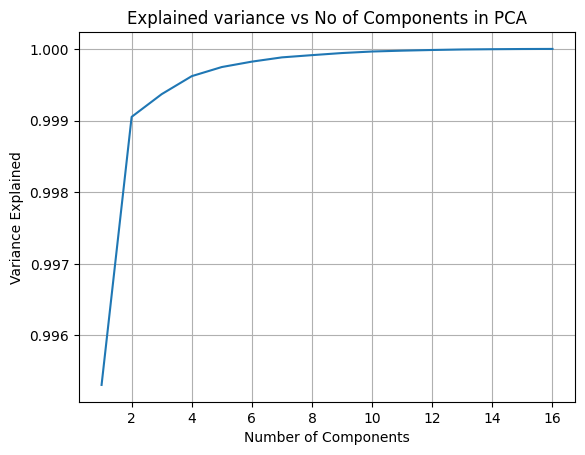

In [168]:
plt.plot(range(1,17),explained_variance)
plt.xlabel('Number of Components')
plt.ylabel('Variance Explained')
plt.title('Explained variance vs No of Components in PCA')
plt.grid()

Chosing number of components as n=2 in PCA, that explains 99% of the variance in the Westmidlands emission dataset over years 2005 to 2021 Data. Now the choice of K in Kmeans can be computed with and elbow method as depicted below

In [169]:
ssd = []

for k in range(2,17):

  model = KMeans(n_clusters=k)
  model.fit(scaled_data)

  ssd.append(model.inertia_)

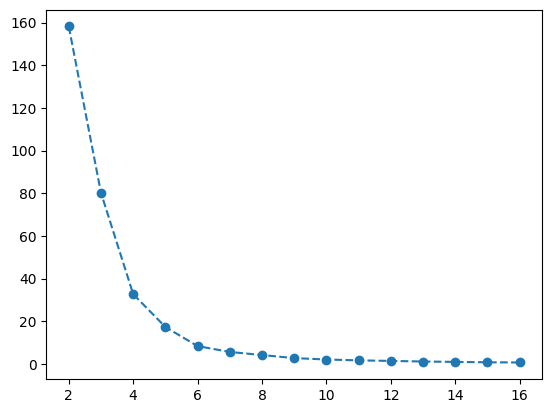

In [170]:
plt.plot(range(2,17),ssd,'o--')

In [171]:
pd.Series(ssd)

0     158.218204
1      80.245355
2      32.734399
3      17.332454
4       8.368756
5       5.645997
6       4.177670
7       2.758563
8       2.097702
9       1.687188
10      1.433258
11      1.157563
12      0.975200
13      0.788417
14      0.702298
dtype: float64

In [172]:
pd.Series(ssd).diff()

0           NaN
1    -77.972848
2    -47.510956
3    -15.401946
4     -8.963697
5     -2.722759
6     -1.468327
7     -1.419107
8     -0.660861
9     -0.410514
10    -0.253930
11    -0.275695
12    -0.182362
13    -0.186783
14    -0.086119
dtype: float64

In [173]:
k = 2
kmeans = KMeans(n_clusters=k, random_state=0)
pca_df['Cluster'] = kmeans.fit_predict(pca_result)


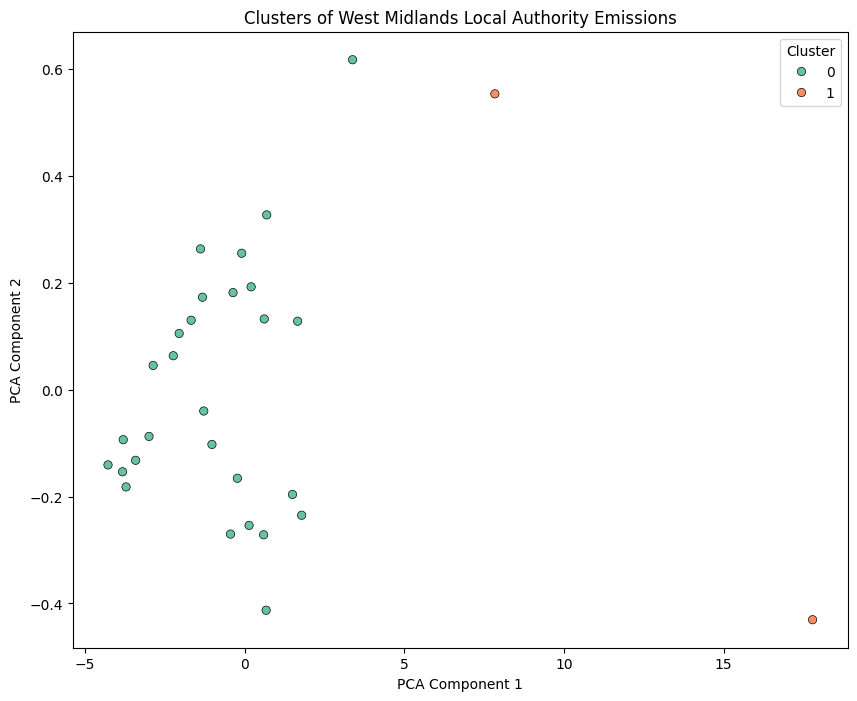

In [174]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=pca_df, palette=sns.color_palette('Set2', k), edgecolor='black', legend='full')
plt.title('Clusters of West Midlands Local Authority Emissions')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()


In [175]:
pca_df

,PCA1,PCA2,Cluster
0,17.786187,-0.430495,1
1,-2.230576,0.063494,0
2,-3.796888,-0.093612,0
3,1.501872,-0.196131,0
4,0.599197,-0.271551,0
5,-1.275962,-0.039956,0
6,1.663698,0.128103,0
7,-2.046951,0.105178,0
8,-2.861057,0.045305,0
9,-1.670643,0.129865,0


<p>- Unsupervised Learning Paradigm Shift:</p>
<ul>How are clusters assigned?</ul>
<ul>Are Cluster assignment accurate?</ul>

<p>Cluster assigment: In unsupervised learning, different approaches depending on the unsupervised learning algorithm used, determine how features are assigned to clusters. Different distance metrics are used (usually using Euclidean distance).</p>

<h1>Brief History</h1>
<p><b>Hugo Steinhaus</b> was the mathematician who began laying out the for groundwork for clustering methods. He introduced his algorithmic clustering approach in French paper “Sur la Division des Corps Matérielsen Parties” naming it bagging predictors</p>

<p>1957: <b>Stuart Lloyd</b> of Bell Labs developed the standard algorithmic technique for clustering related to K-Means.</p>

<p>1965: <b>Edward W. Forgy</b> published the clustering technique, thus both Lloyd and Forgy are credited with the development as well.</p>

<p>In 1967, <b>James MacQueen</b> introduced the term K-Means in his article “Some Methods for Classification and Analysis of MultivariateObservations” published by University of California.  This is the first publication to introduce the term 'K-Means' as a sequential clustering algorithm.
</p>

<h1>How it works</h1>
As the name implies K-Means is an unsupervised learning algorithm used for partitioning a dataset into K distinct, non-overlapping clusters.

<p>The algorithm begins by accepting a <b>K</b> value(how many clusters to create(k)).</p>
<p>A Random point is selected as the initial centroid for each cluster. For each data point the distance to centroids is computed for all clusters (usually using Euclidean distance) </p>
<p> Recalculating the centroids by taking the <b>mean</b> of all data points assigned to each <b>cluster</b>.</p>
<p>Iterating until the centroids no longer change significantly or a maximum number of iterations is reached.</p>

## Euclidean Distance:
   - Represents the **shortest straight-line distance** between two points in Euclidean space (flat space).
   - Formula: Distance = √((x₁ - x₂)² + (y₁ - y₂)² + (z₁ - z₂)² + ...)





##Mahalanobis Distance:





In [176]:
data

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [177]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30 entries, Birmingham to Wyre Forest
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2005    30 non-null     float64
 1   2006    30 non-null     float64
 2   2007    30 non-null     float64
 3   2008    30 non-null     float64
 4   2009    30 non-null     float64
 5   2010    30 non-null     float64
 6   2011    30 non-null     float64
 7   2012    30 non-null     float64
 8   2013    30 non-null     float64
 9   2014    30 non-null     float64
 10  2015    30 non-null     float64
 11  2016    30 non-null     float64
 12  2017    30 non-null     float64
 13  2018    30 non-null     float64
 14  2019    30 non-null     float64
 15  2020    30 non-null     float64
 16  2021    30 non-null     float64
dtypes: float64(17)
memory usage: 4.2+ KB


In [178]:
data.describe()

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000
mean,1657.740747,1662.168006,1653.894188,1589.645814,1476.266593,1546.560632,1436.001123,1467.729335,1439.396464,1347.124815,1319.020543,1281.121884,1249.408524,1226.833463,1169.336768,1045.754671,1124.561844
std,1240.208721,1221.034690,1190.802690,1175.775511,1062.127968,1119.335080,1022.272648,1066.092646,1039.119800,940.872541,923.447136,899.480444,884.293216,851.617706,819.079115,764.142236,815.048191
min,475.068557,474.697517,448.760723,436.457918,421.964679,440.200738,404.836659,414.618735,406.701043,363.694164,347.631884,326.917746,317.951130,318.231567,290.820254,254.020488,268.838288
25%,968.610118,980.217702,1013.513626,973.225054,925.237440,952.536655,882.329971,898.613892,890.718600,854.890525,845.401627,833.628541,812.352503,783.638908,770.682643,664.206133,722.542881
50%,1474.499323,1509.134020,1541.767107,1478.268074,1377.118770,1431.302592,1326.858848,1355.865608,1339.410414,1246.352045,1222.620234,1148.058727,1122.186942,1121.909180,1054.520022,935.111729,994.433394
75%,1948.102293,1936.532707,1859.387560,1782.244109,1634.686999,1744.064460,1599.371280,1630.556330,1609.066258,1533.243609,1523.848461,1491.582777,1396.797949,1389.281089,1313.415451,1134.609414,1211.319798
max,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084


In [179]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



In [180]:
melted_data = data.melt(var_name='Year', value_name='Emissions')


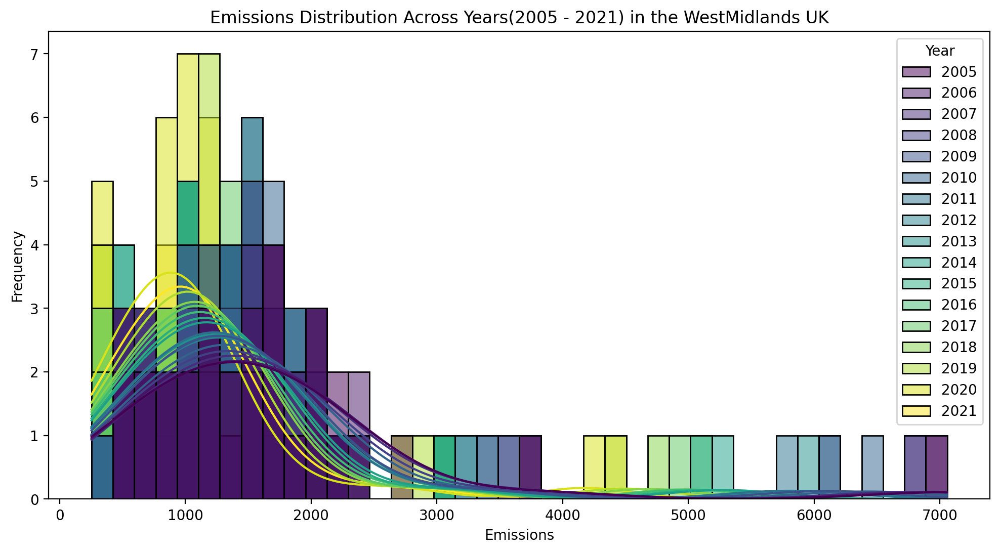

In [181]:
plt.figure(figsize=(12, 6), dpi=200)

sns.histplot(data=melted_data, x='Emissions', bins=40, kde=True, hue='Year', palette='viridis')


plt.title('Emissions Distribution Across Years(2005 - 2021) in the WestMidlands UK')
plt.xlabel('Emissions')
plt.ylabel('Frequency')
plt.show()


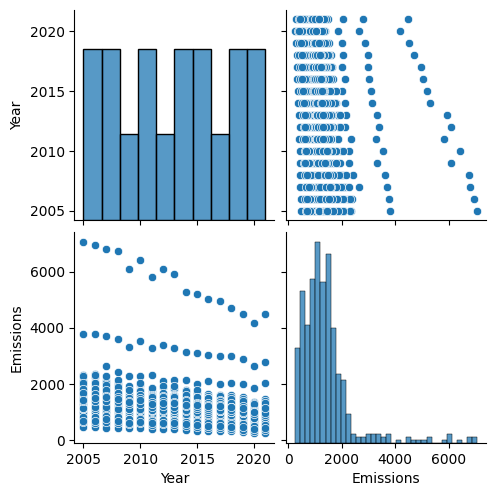

In [182]:
 sns.pairplot(melted_data)

In [183]:
X = pd.get_dummies(melted_data)

In [184]:
X

,Year,Emissions
0,2005,7059.334372
1,2005,956.642291
2,2005,588.979929
3,2005,2285.257172
4,2005,1983.590348
...,...,...
505,2021,892.125608
506,2021,985.990590
507,2021,375.993686
508,2021,1148.046126


In [185]:
from sklearn.preprocessing import StandardScaler

In [186]:
scaler = StandardScaler()

In [187]:
scaled_X = scaler.fit_transform(X)

In [188]:
from sklearn.cluster import KMeans

In [189]:
help(KMeans)

Help on class KMeans in module sklearn.cluster._kmeans:

class KMeans(_BaseKMeans)
 |  KMeans(n_clusters=8, *, init='k-means++', n_init='warn', max_iter=300, tol=0.0001, verbose=0, random_state=None, copy_x=True, algorithm='lloyd')
 |  
 |  K-Means clustering.
 |  
 |  Read more in the :ref:`User Guide <k_means>`.
 |  
 |  Parameters
 |  ----------
 |  
 |  n_clusters : int, default=8
 |      The number of clusters to form as well as the number of
 |      centroids to generate.
 |  
 |  init : {'k-means++', 'random'}, callable or array-like of shape             (n_clusters, n_features), default='k-means++'
 |      Method for initialization:
 |  
 |      'k-means++' : selects initial cluster centroids using sampling based on
 |      an empirical probability distribution of the points' contribution to the
 |      overall inertia. This technique speeds up convergence. The algorithm
 |      implemented is "greedy k-means++". It differs from the vanilla k-means++
 |      by making several t

In [190]:
model = KMeans(n_clusters=2)
#model.fit_predict()
#model.predict
Cluster_labels = model.fit_predict(scaled_X)

In [191]:
Cluster_labels

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,

In [192]:
X['Cluster'] = Cluster_labels

In [193]:
X.corr()

,Year,Emissions,Cluster
Year,1.000000,-0.181965,-0.843720
Emissions,-0.181965,1.000000,0.301425
Cluster,-0.843720,0.301425,1.000000


In [194]:
X.corr()['Cluster']

Year        -0.843720
Emissions    0.301425
Cluster      1.000000
Name: Cluster, dtype: float64

In [195]:
X.corr()['Cluster'].iloc[:-1]

Year        -0.843720
Emissions    0.301425
Name: Cluster, dtype: float64

<Axes: >

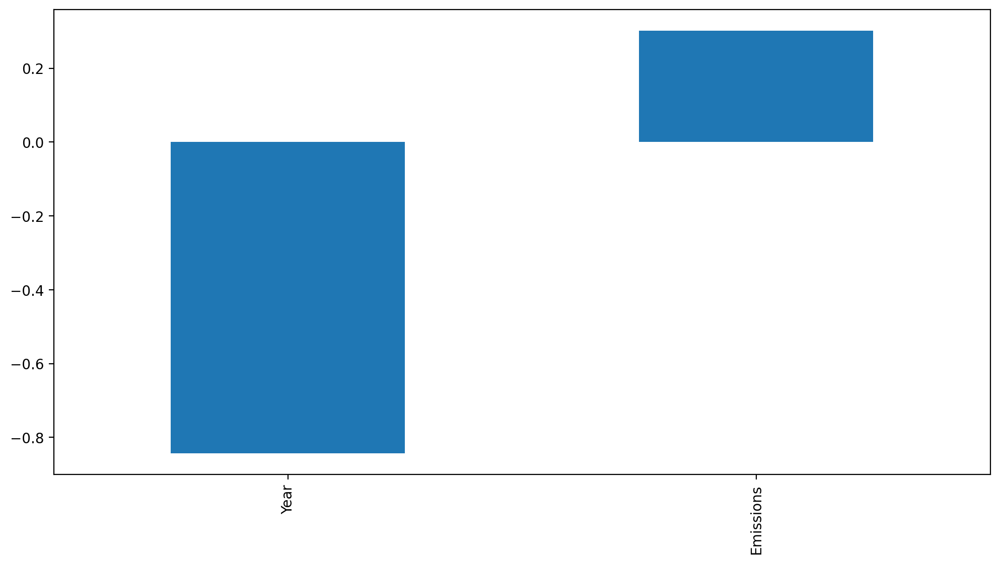

In [196]:
plt.figure(figsize=(12,6),dpi=200)
X.corr()['Cluster'].iloc[:-1].sort_values().plot(kind='bar')

<p>Method of choosing the K-Value</p>
<ul>Elbow Method</ul>

In [197]:
ssd = []

for k in range(2,10):

  model = KMeans(n_clusters=k)
  model.fit(scaled_X)

  ssd.append(model.inertia_) #sum of square differences point -- cluster center

In [198]:
ssd

[610.6129745674853,
 314.23602757426147,
 246.56280792333627,
 197.8428637064374,
 162.49682677687727,
 140.97760193823265,
 121.70322492634577,
 102.39765216814922]

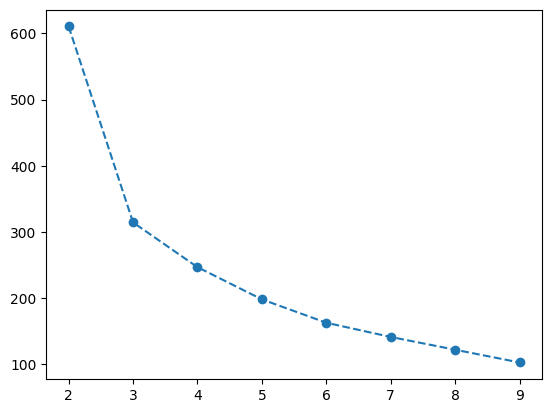

In [199]:
plt.plot(range(2,10),ssd,'o--')

In [200]:
pd.Series(ssd)

0    610.612975
1    314.236028
2    246.562808
3    197.842864
4    162.496827
5    140.977602
6    121.703225
7    102.397652
dtype: float64

In [201]:
pd.Series(ssd).diff()

0           NaN
1   -296.376947
2    -67.673220
3    -48.719944
4    -35.346037
5    -21.519225
6    -19.274377
7    -19.305573
dtype: float64

K at 4 is a good K from the ssd diff above

In [202]:

url = 'https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx'
data_1_1 = pd.read_excel(url, sheet_name='1_1')

data_1_1_actual = data_1_1.iloc[4:]

data_1_1_actual.columns = data_1_1.iloc[3]

west_midlands_data = data_1_1_actual[data_1_1_actual['Region/Country'] == 'West Midlands']

west_midlands_data_filtered = west_midlands_data[~west_midlands_data['Second Tier Authority'].str.endswith("Total")]

#columns_to_keep = ['Region/Country', 'Second Tier Authority', 'Local Authority', 'Local Authority Code', 'Calendar Year', 'LULUCF Net Emissions', 'Population ('000s, mid-year estimate)', 'Per Capita Emissions (tCO2e)','Area (km2)', 'Emissions per km2 (kt CO2e)']

columns_to_keep = ["Region/Country", "Second Tier Authority", "Local Authority", "Local Authority Code", "Calendar Year", "LULUCF Net Emissions", "Population ('000s, mid-year estimate)", "Per Capita Emissions (tCO2e)","Area (km2)", "Emissions per km2 (kt CO2e)"]

columns_to_keep.extend([col for col in west_midlands_data_filtered.columns if col.endswith("Total")])

west_midlands_filtered_columns = west_midlands_data_filtered[columns_to_keep]

#west_midlands_filtered_columns.to_csv('west_midlands_filtered_columns.csv')
west_midlands_filtered_columns.columns


Index(['Region/Country', 'Second Tier Authority', 'Local Authority',
       'Local Authority Code', 'Calendar Year', 'LULUCF Net Emissions',
       'Population ('000s, mid-year estimate)', 'Per Capita Emissions (tCO2e)',
       'Area (km2)', 'Emissions per km2 (kt CO2e)', 'Industry Total',
       'Commercial Total', 'Public Sector Total', 'Domestic Total',
       'Transport Total', 'Agriculture Total', 'Waste Management Total',
       'Grand Total'],
      dtype='object', name=3)

In [203]:
west_midlands_filtered_columns_ = west_midlands_filtered_columns.drop('Grand Total', axis=1)


In [204]:
# Pivot table creation
west_midlands_filtered_columns_pivot = pd.pivot_table(
    west_midlands_filtered_columns_,
    values=[
        "Commercial Total", "Waste Management Total", "Agriculture Total",
        "Transport Total", "Domestic Total", "Public Sector Total",
        "Industry Total", "LULUCF Net Emissions","Emissions per km2 (kt CO2e)",
		"Population ('000s, mid-year estimate)", "Per Capita Emissions (tCO2e)",
       "Area (km2)"
    ],
    index=['Local Authority'],
    aggfunc=sum
)

In [205]:
west_midlands_filtered_columns_pivot

3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
Local Authority,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016


In [206]:
pip install plotly

In [207]:
west_midlands_filtered_columns_pivot.columns

Index(['Agriculture Total', 'Area (km2)', 'Commercial Total', 'Domestic Total',
       'Emissions per km2 (kt CO2e)', 'Industry Total', 'LULUCF Net Emissions',
       'Per Capita Emissions (tCO2e)', 'Population ('000s, mid-year estimate)',
       'Public Sector Total', 'Transport Total', 'Waste Management Total'],
      dtype='object', name=3)

In [208]:
west_midlands_filtered_columns_pivot.index

Index(['Birmingham', 'Bromsgrove', 'Cannock Chase', 'Coventry', 'Dudley',
       'East Staffordshire', 'Herefordshire, County of', 'Lichfield',
       'Malvern Hills', 'Newcastle-under-Lyme', 'North Warwickshire',
       'Nuneaton and Bedworth', 'Redditch', 'Rugby', 'Sandwell', 'Shropshire',
       'Solihull', 'South Staffordshire', 'Stafford',
       'Staffordshire Moorlands', 'Stoke-on-Trent', 'Stratford-on-Avon',
       'Tamworth', 'Telford and Wrekin', 'Walsall', 'Warwick', 'Wolverhampton',
       'Worcester', 'Wychavon', 'Wyre Forest'],
      dtype='object', name='Local Authority')

In [209]:
X = west_midlands_filtered_columns_pivot

In [210]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [211]:
from sklearn.cluster import KMeans
k_Values = range(2,30)
sum_squared_distance = []
for k in k_Values:
  model = KMeans(n_clusters=k)
  model.fit(scaled_X)

  sum_squared_distance.append(model.inertia_)


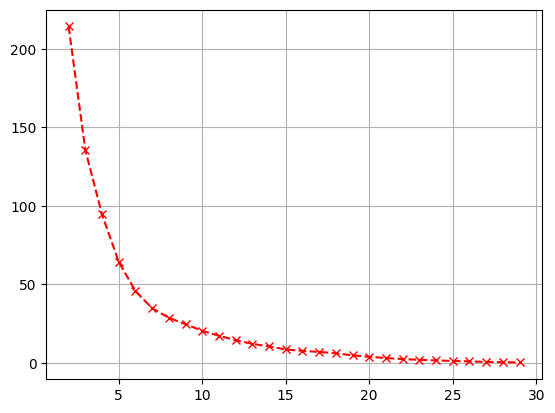

In [212]:
plt.plot(k_Values,sum_squared_distance,'x--', color='red')
plt.grid(True)

In [213]:
pip install kneed

In [214]:
from kneed import KneeLocator

knee_locator = KneeLocator(k_Values, sum_squared_distance, curve='convex', direction='decreasing')

# The optimal k is where the elbow is located
optimal_k = knee_locator.elbow

print(f"The optimal k is: {optimal_k}")

The optimal k is: 7


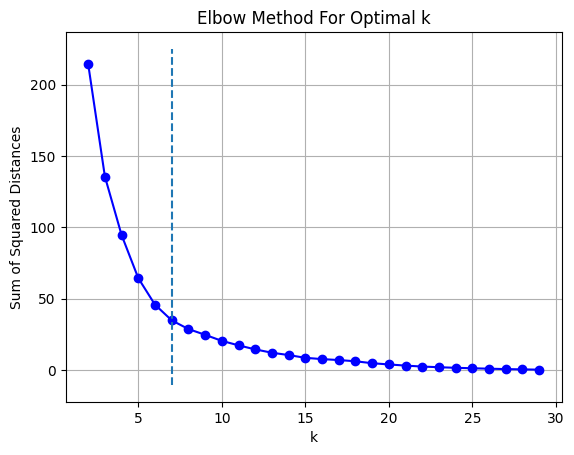

In [215]:
plt.plot(k_Values, sum_squared_distance, 'bo-')
plt.xlabel('k')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method For Optimal k')
plt.vlines(optimal_k, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.grid()
plt.show()

<Axes: >

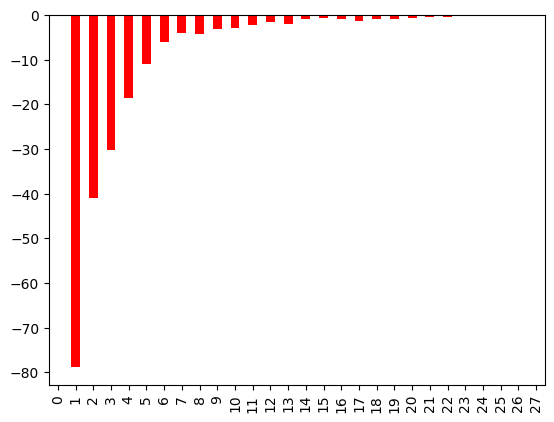

In [216]:
pd.Series(sum_squared_distance).diff().plot(kind='bar', color='red')

<h1><b>Choosing K=4</b></h1>

In [217]:
model = KMeans(n_clusters=4)
model.fit(scaled_X)

KMeans(n_clusters=4)

In [218]:
model.labels_

array([1, 0, 2, 2, 2, 0, 3, 0, 0, 0, 0, 2, 2, 0, 2, 3, 2, 0, 0, 0, 2, 0,
       2, 2, 2, 0, 2, 2, 0, 0], dtype=int32)

In [219]:
X['K=4 Cluster Labels'] = model.labels_

In [220]:
X.corr()['K=4 Cluster Labels']

3
Agriculture Total                        0.211372
Area (km2)                               0.221690
Commercial Total                         0.188345
Domestic Total                           0.257360
Emissions per km2 (kt CO2e)              0.501305
Industry Total                          -0.027931
LULUCF Net Emissions                    -0.149034
Per Capita Emissions (tCO2e)            -0.530270
Population ('000s, mid-year estimate)    0.252131
Public Sector Total                      0.174393
Transport Total                         -0.095106
Waste Management Total                   0.257540
K=4 Cluster Labels                       1.000000
Name: K=4 Cluster Labels, dtype: float64

<Axes: xlabel='3'>

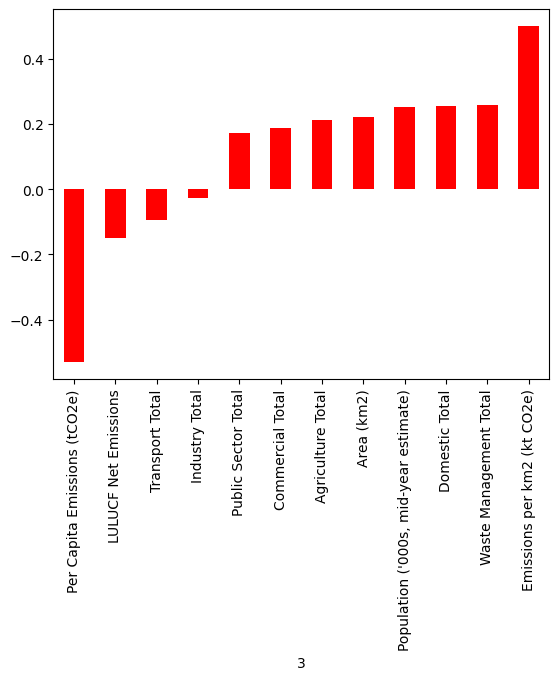

In [221]:
X.corr()['K=4 Cluster Labels'].iloc[:-1].sort_values().plot(kind='bar', color='red')

In [222]:
west_midlands_filtered_columns_pivot['K=4 Cluster Labels'] = model.labels_

In [223]:
west_midlands_filtered_columns_pivot

3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total,K=4 Cluster Labels
Local Authority,,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782,1
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642,0
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513,2
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882,2
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702,2
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079,0
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915,3
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271,0
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016,0


In [224]:
west_midlands_filtered_columns_pivot

3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total,K=4 Cluster Labels
Local Authority,,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782,1
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642,0
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513,2
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882,2
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702,2
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079,0
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915,3
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271,0
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016,0


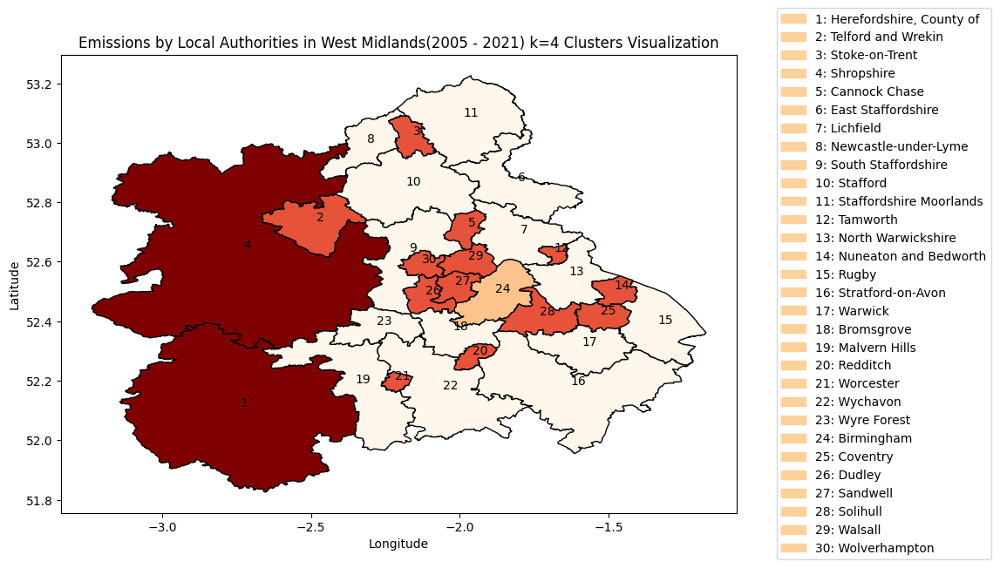

In [225]:
import pandas as pd
# Reading the CSV file into a DataFrame
topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)

# Converting the DataFrame to a GeoDataFrame
topo_lad_gdf = gpd.GeoDataFrame(topo_lad_df, geometry=gpd.GeoSeries.from_wkt(topo_lad_df['geometry']))

#westmidlands_emissions_df = pd.DataFrame(areas_to_visualize)
westmidlands_emissions_df = west_midlands_filtered_columns_pivot.reset_index()
#westmidlands_emissions_df.columns = ['clusters']

filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(areas_to_visualize["Local Authority"])]

filtered_gdf = filtered_gdf.merge(westmidlands_emissions_df, left_on='LAD13NM', right_on='Local Authority')

ax = filtered_gdf.plot(column='K=4 Cluster Labels', cmap='OrRd', legend=False,  edgecolor='black', figsize=(10, 10))

filtered_gdf['ID'] = range(1, len(filtered_gdf) + 1)

for idx, row in filtered_gdf.iterrows():
    plt.annotate(text=row['ID'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
             xytext=(5, 5), textcoords='offset points',
             horizontalalignment='center', verticalalignment='center')

from matplotlib.patches import Patch
legend_labels = [Patch(label=f'{row["ID"]}: {row["LAD13NM"]}', color = '#FDD19B') for idx, row in filtered_gdf.iterrows()]

plt.legend(handles=legend_labels, bbox_to_anchor=(1.05, 0.5), loc='center left')

# Setting the title and labels
plt.title('Emissions by Local Authorities in West Midlands(2005 - 2021) k=4 Clusters Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Displaying the plot
plt.show()

<h1><b>Choosing K=3</b></h1>

In [226]:
model = KMeans(n_clusters=3)
model.fit(scaled_X)

KMeans(n_clusters=3)

In [227]:
model.labels_

array([1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [228]:
X['K=3 Cluster Labels'] = model.labels_

In [229]:
X.corr()['K=3 Cluster Labels']

3
Agriculture Total                        0.819530
Area (km2)                               0.864158
Commercial Total                         0.342033
Domestic Total                           0.433327
Emissions per km2 (kt CO2e)             -0.141141
Industry Total                           0.211011
LULUCF Net Emissions                    -0.741228
Per Capita Emissions (tCO2e)             0.052027
Population ('000s, mid-year estimate)    0.387955
Public Sector Total                      0.353747
Transport Total                          0.434594
Waste Management Total                   0.575881
K=4 Cluster Labels                       0.445527
K=3 Cluster Labels                       1.000000
Name: K=3 Cluster Labels, dtype: float64

<Axes: xlabel='3'>

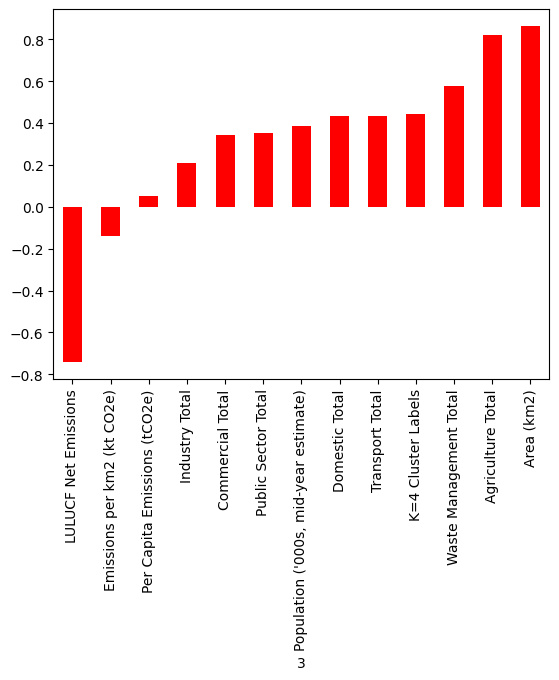

In [230]:
X.corr()['K=3 Cluster Labels'].iloc[:-1].sort_values().plot(kind='bar', color='red')

In [231]:
west_midlands_filtered_columns_pivot['K=3 Cluster Labels'] = model.labels_

In [232]:
west_midlands_filtered_columns_pivot


3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total,K=4 Cluster Labels,K=3 Cluster Labels
Local Authority,,,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782,1,1
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642,0,0
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513,2,0
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882,2,0
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702,2,0
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079,0,0
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915,3,2
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271,0,0
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016,0,0


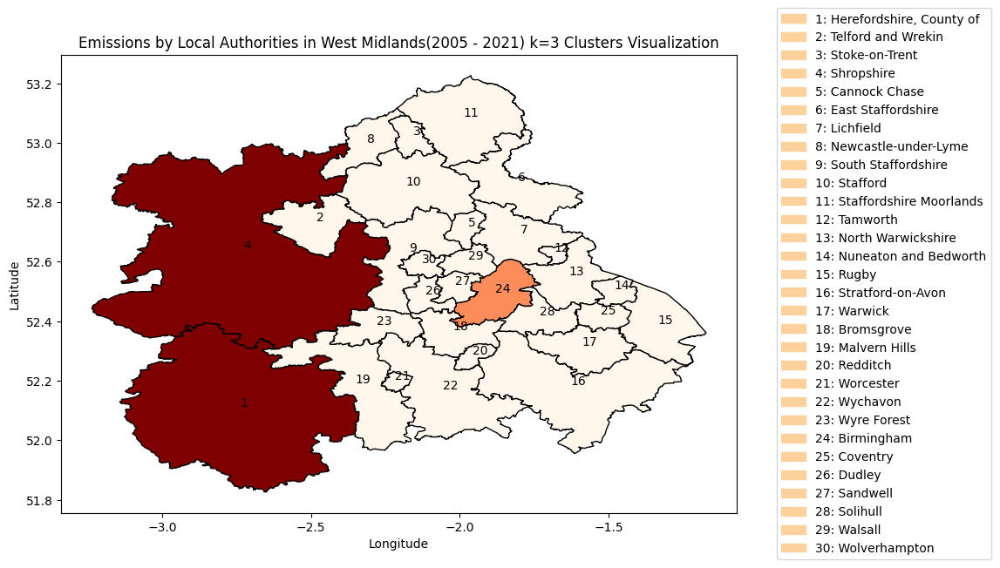

In [233]:

import pandas as pd
# Reading the CSV file into a DataFrame
topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)

# Converting the DataFrame to a GeoDataFrame
topo_lad_gdf = gpd.GeoDataFrame(topo_lad_df, geometry=gpd.GeoSeries.from_wkt(topo_lad_df['geometry']))

#westmidlands_emissions_df = pd.DataFrame(areas_to_visualize)
westmidlands_emissions_df = west_midlands_filtered_columns_pivot.reset_index()
#westmidlands_emissions_df.columns = ['clusters']

filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(areas_to_visualize["Local Authority"])]

filtered_gdf = filtered_gdf.merge(westmidlands_emissions_df, left_on='LAD13NM', right_on='Local Authority')

ax = filtered_gdf.plot(column='K=3 Cluster Labels', cmap='OrRd', legend=False,  edgecolor='black', figsize=(10, 10))

filtered_gdf['ID'] = range(1, len(filtered_gdf) + 1)

for idx, row in filtered_gdf.iterrows():
    plt.annotate(text=row['ID'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
             xytext=(5, 5), textcoords='offset points',
             horizontalalignment='center', verticalalignment='center')

from matplotlib.patches import Patch
legend_labels = [Patch(label=f'{row["ID"]}: {row["LAD13NM"]}', color = '#FDD19B') for idx, row in filtered_gdf.iterrows()]

plt.legend(handles=legend_labels, bbox_to_anchor=(1.05, 0.5), loc='center left')

# Setting the title and labels
plt.title('Emissions by Local Authorities in West Midlands(2005 - 2021) k=3 Clusters Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Displaying the plot
plt.show()

<h1>DBSCAN</h1>
<p><b>Density-Based Spatial Clustering of Applications with Noise</b> is a technique which can be used for clustering and outlier detection.</p>

<ul> DBSCAN vs. K-Means Clustering</ul>
<ul> DBSCAN Hyperparameters Theory</ul>
<ul> DBSCAN Hyperparameters Coding</ul>


<h1>Brief History</h1>
<p>1972: <b>Robert F. Ling</b> published a closely related algorithm in "The theory and Construction of k-Clusters" with an expected run time of O(n^3).Meaning as n number of points grows, the runtime of the algorthm grows cubically.</p>

<p>1996: <b>MArtin Ester, Hans-Peter Kriegel, Jorg Sander and Xiaowei Xu</b> proposed the modern version of DBSCAN with a runtime of O(n^2)</p>

<p>2014: DBSCAN was awarded the <b>test of time award</b> at the leading data mining conference, SIGKDD<b>(ACM Special Interest Group on Knowledge Discovery and Data Mining) conference</b>.</p>

<h1>How it works</h1>
<p><b>DBSCAN</b> as the name implies is based on the idea of grouping points that are close together in high-density regions, and marking points that are far away in low-density regions as outliers. </p>

<p>DBSCAN has two main parameters: <b>epsilon (ε)</b>, which defines the radius of a neighborhood around a point, and <b>minPts</b>, which defines the minimum number of points required to form a dense region. Unlike K-Means, it focuses on density as the main factor for cluster assignment of points.</p>

<p>DBSCAN starts with a random point and checks if it is a core point, meaning it has at least minPts points within distance ε. If it is, it forms a cluster with all the points that are reachable from it. If it is not, it marks it as noise and moves on to another point. This process is repeated until all points are either assigned to a cluster or marked as noise.
</p>

In [234]:
#Considering the dataset and features to understand the Clusters each feature belongs to...
west_midlands_local_authority_emissions

Calendar Year,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
Local Authority,,,,,,,,,,,,,,,,,
Birmingham,7059.334372,6952.112034,6800.522322,6744.677640,6099.737055,6412.804284,5805.907414,6094.847957,5928.649539,5283.528982,5187.812112,5018.990855,4952.980766,4694.297182,4500.378294,4177.186378,4480.654084
Bromsgrove,956.642291,966.027098,1014.325992,966.508457,915.239428,943.043254,865.875640,885.439318,875.957613,847.917226,839.358149,828.019311,799.333806,765.570975,756.273104,655.139864,711.760256
Cannock Chase,588.979929,597.874966,584.212829,554.965633,534.431424,565.871617,516.643905,523.651492,521.293200,463.806795,448.224377,432.415392,438.056787,428.182712,400.378294,360.878619,364.042820
Coventry,2285.257172,2244.459643,2109.501041,2028.053404,1835.162506,1962.611578,1766.002096,1881.254900,1815.756821,1664.671871,1647.571233,1574.337656,1548.946359,1496.667926,1428.701726,1280.312165,1344.000349
Dudley,1983.590348,1972.154700,1888.505634,1818.345968,1657.763334,1778.665829,1603.028674,1645.915361,1619.695684,1452.515600,1412.477913,1356.141083,1347.120418,1295.213550,1217.885198,1079.756656,1163.033149
East Staffordshire,1287.270750,1298.775799,1260.546128,1245.328814,1170.588639,1228.732489,1160.773439,1165.877455,1143.246946,1050.973296,1014.291935,988.598271,981.240089,966.664142,903.141998,810.544121,853.521292
"Herefordshire, County of",2091.684474,2090.207781,2038.853224,1975.986634,1872.500149,1994.484316,1849.438619,1892.331768,1847.560317,1777.587181,1696.464807,1660.690961,1618.084774,1598.639996,1527.132610,1364.626064,1472.865799
Lichfield,1004.513597,1022.789515,1013.242837,993.374843,955.231477,981.016859,931.692962,938.137617,935.001562,875.810423,863.532062,850.456232,851.408592,837.842706,813.911260,691.404937,754.890754
Malvern Hills,772.773159,799.621230,848.442583,797.397569,757.938462,782.645008,723.285139,726.094378,717.922272,695.654404,688.580938,676.822279,655.588099,642.098370,619.590085,538.434311,601.444378


In [235]:
X = west_midlands_local_authority_emissions.iloc[:-1]

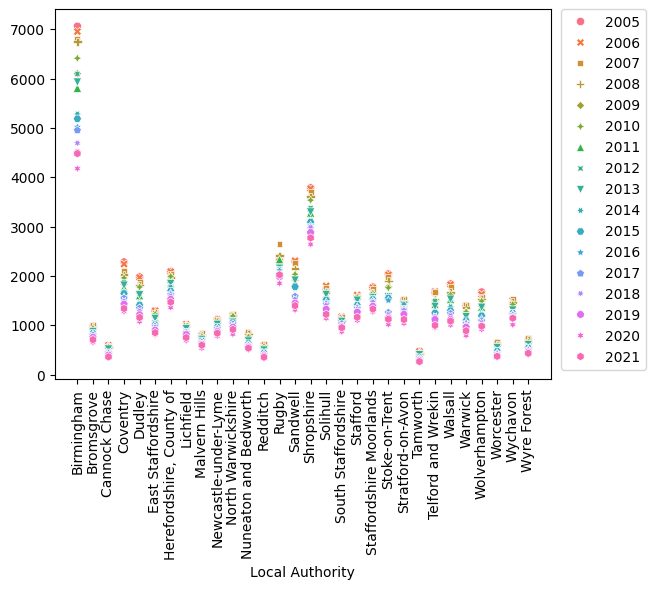

In [236]:
sns.scatterplot(data=X, legend=True)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [237]:
X1 = west_midlands_filtered_columns_pivot

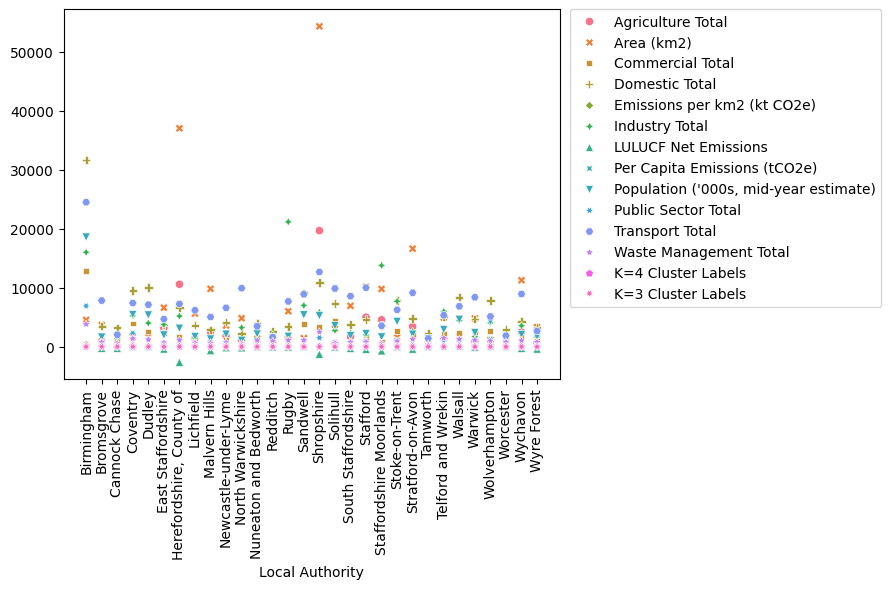

In [238]:
sns.scatterplot(data=X1, legend=True)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)


Explained variance ratio: [0.45403269 0.28130925]


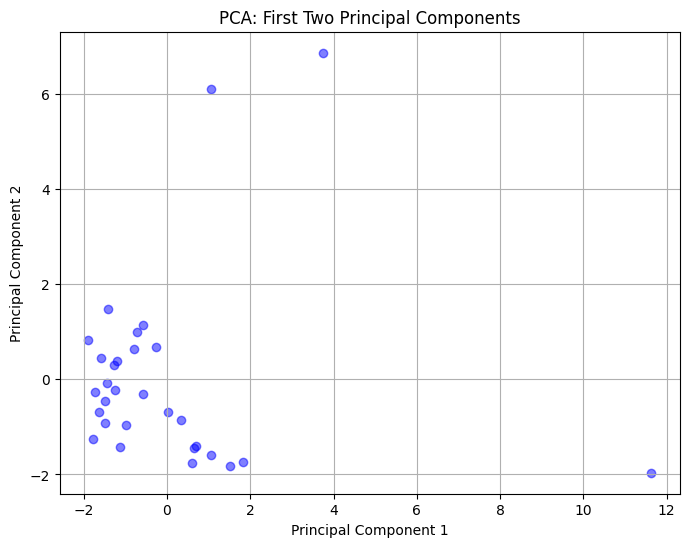

In [239]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

scaler = StandardScaler()
X_scaled = scaler.fit_transform(west_midlands_filtered_columns_pivot)

n_components = 2
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained variance ratio: {explained_variance_ratio}")

plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c='b', marker='o', alpha=0.5)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA: First Two Principal Components")
plt.grid(True)
plt.show()


In [240]:
X_pca_df = pd.DataFrame(X_pca, columns=['Principal_Component_1', 'Principal_Component_2'])

In [241]:
X_pca_df.head()

,Principal_Component_1,Principal_Component_2
0,11.634719,-1.964432
1,-1.446781,-0.087934
2,-1.639933,-0.693586
3,1.820766,-1.742504
4,1.057845,-1.588081


<Axes: xlabel='Principal_Component_1', ylabel='Principal_Component_2'>

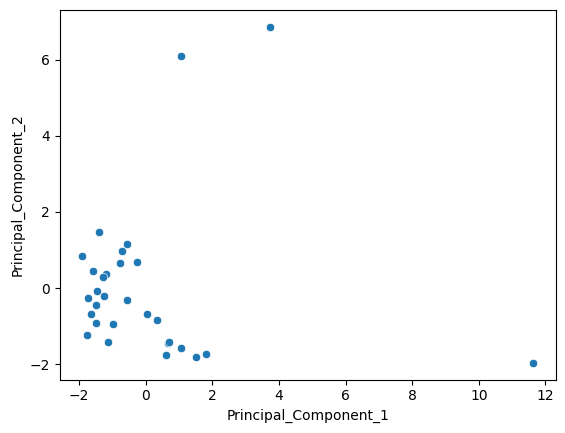

In [242]:
sns.scatterplot(data=X_pca_df,  x='Principal_Component_1', y='Principal_Component_2')

In [243]:
def display_categories(model,data):
    labels = model.fit_predict(data)
    sns.scatterplot(data=data,x='Principal_Component_1',y='Principal_Component_2',hue=labels,palette='Set1')

In [244]:
from sklearn.cluster import KMeans

In [245]:
model = KMeans(n_clusters=3)

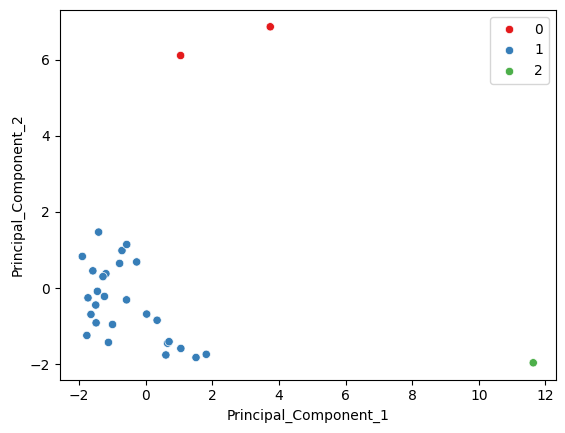

In [246]:
display_categories(model,X_pca_df)


In [247]:
help(DBSCAN)

Help on class DBSCAN in module sklearn.cluster._dbscan:

class DBSCAN(sklearn.base.ClusterMixin, sklearn.base.BaseEstimator)
 |  DBSCAN(eps=0.5, *, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)
 |  
 |  Perform DBSCAN clustering from vector array or distance matrix.
 |  
 |  DBSCAN - Density-Based Spatial Clustering of Applications with Noise.
 |  Finds core samples of high density and expands clusters from them.
 |  Good for data which contains clusters of similar density.
 |  
 |  Read more in the :ref:`User Guide <dbscan>`.
 |  
 |  Parameters
 |  ----------
 |  eps : float, default=0.5
 |      The maximum distance between two samples for one to be considered
 |      as in the neighborhood of the other. This is not a maximum bound
 |      on the distances of points within a cluster. This is the most
 |      important DBSCAN parameter to choose appropriately for your data set
 |      and distance function.
 |  
 |  min_sam

In [248]:
model = DBSCAN()

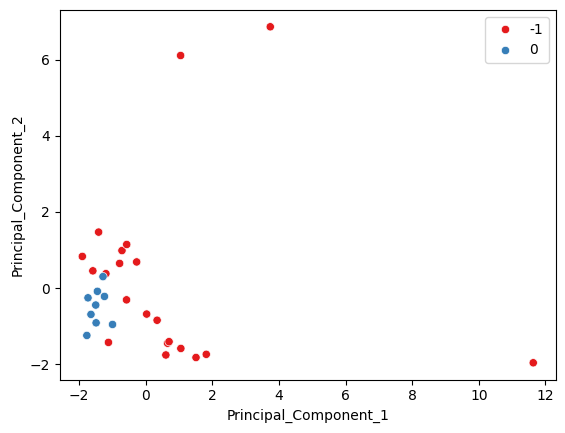

In [249]:
display_categories(model,X_pca_df)

In [250]:
model.labels_

array([-1,  0,  0, -1, -1, -1, -1,  0, -1,  0, -1,  0,  0, -1, -1, -1, -1,
        0, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1,  0])

In [251]:
X_pca_df['DBSCAN Cluster Labels'] = model.labels_

In [252]:
X_pca_df.corr()['DBSCAN Cluster Labels']

Principal_Component_1   -0.377056
Principal_Component_2   -0.166073
DBSCAN Cluster Labels    1.000000
Name: DBSCAN Cluster Labels, dtype: float64

In [253]:
#X_pca_df.corr()['DBSCAN Cluster Labels'].iloc[:-1].sort_values().plot(kind='bar', color='red')

In [254]:
west_midlands_filtered_columns_pivot['clusters DBSCAN'] = model.labels_

In [255]:
west_midlands_filtered_columns_pivot

3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total,K=4 Cluster Labels,K=3 Cluster Labels,clusters DBSCAN
Local Authority,,,,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782,1,1,-1
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642,0,0,0
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513,2,0,0
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882,2,0,-1
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702,2,0,-1
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079,0,0,-1
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915,3,2,-1
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271,0,0,0
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016,0,0,-1


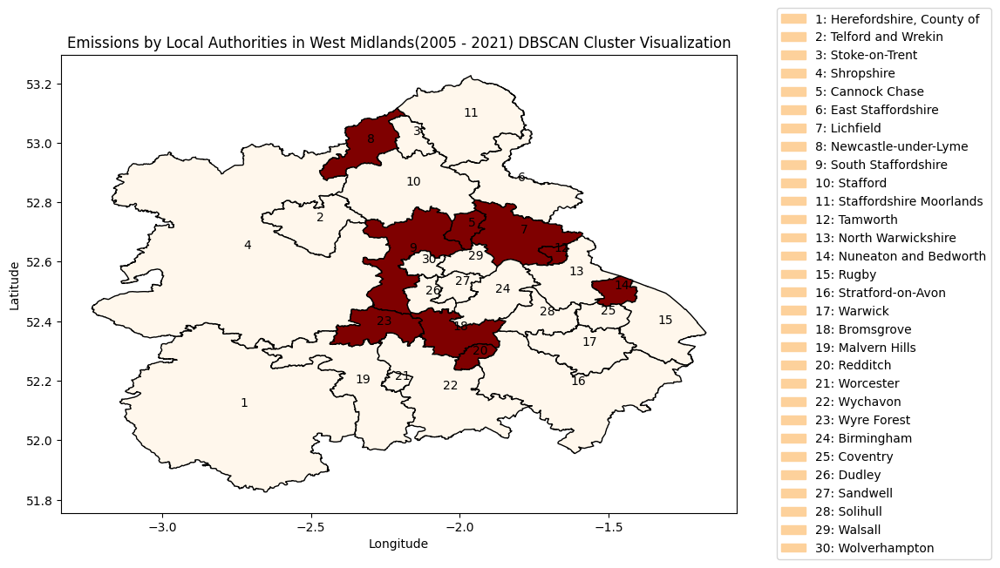

In [256]:

import pandas as pd
# Reading the CSV file into a DataFrame
topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)

# Converting the DataFrame to a GeoDataFrame
topo_lad_gdf = gpd.GeoDataFrame(topo_lad_df, geometry=gpd.GeoSeries.from_wkt(topo_lad_df['geometry']))

#westmidlands_emissions_df = pd.DataFrame(areas_to_visualize)
westmidlands_emissions_df = west_midlands_filtered_columns_pivot.reset_index()
#westmidlands_emissions_df.columns = ['clusters']

filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(areas_to_visualize["Local Authority"])]

filtered_gdf = filtered_gdf.merge(westmidlands_emissions_df, left_on='LAD13NM', right_on='Local Authority')

ax = filtered_gdf.plot(column='clusters DBSCAN', cmap='OrRd', legend=False,  edgecolor='black', figsize=(10, 10))

filtered_gdf['ID'] = range(1, len(filtered_gdf) + 1)

for idx, row in filtered_gdf.iterrows():
    plt.annotate(text=row['ID'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
             xytext=(5, 5), textcoords='offset points',
             horizontalalignment='center', verticalalignment='center')

from matplotlib.patches import Patch
legend_labels = [Patch(label=f'{row["ID"]}: {row["LAD13NM"]}', color = '#FDD19B') for idx, row in filtered_gdf.iterrows()]

plt.legend(handles=legend_labels, bbox_to_anchor=(1.05, 0.5), loc='center left')

# Setting the title and labels
plt.title('Emissions by Local Authorities in West Midlands(2005 - 2021) DBSCAN Cluster Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Displaying the plot
plt.show()

<h1>Adjusting DBSCAN parameter Epsilon</h1>

In [257]:
model = DBSCAN(eps=1)

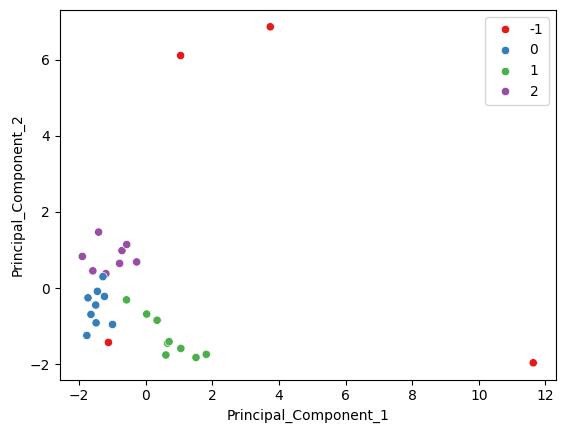

In [258]:
display_categories(model,X_pca_df)

In [259]:
model.labels_

array([-1,  0,  0,  1,  1,  2, -1,  0,  2,  0,  2,  0,  0,  2,  1, -1,  1,
        0,  2,  2,  1,  2,  0,  1,  1,  1,  1, -1,  2,  0])

In [260]:
X_pca_df['DBSCAN(ε = 1) Cluster Labels'] = model.labels_

In [261]:
west_midlands_filtered_columns_pivot['clusters DBSCAN(ε = 1)'] = model.labels_

In [262]:
west_midlands_filtered_columns_pivot

3,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total,K=4 Cluster Labels,K=3 Cluster Labels,clusters DBSCAN,clusters DBSCAN(ε = 1)
Local Authority,,,,,,,,,,,,,,,,
Birmingham,232.234593,4552.4504,12852.635286,31681.462010,359.214273,16013.982910,182.955910,88.781634,18590.768486,6913.832893,24501.206885,3816.110782,1,1,-1,-1
Bromsgrove,942.038895,3688.4628,801.268832,3457.285332,67.256023,712.056170,-248.569485,153.895192,1618.025967,356.132438,7825.261960,746.957642,0,0,0,0
Cannock Chase,113.860612,1341.0025,1071.978144,3224.318889,105.522908,1381.093986,-250.732242,85.365659,1662.680051,206.946300,2029.322591,547.122513,2,0,0,0
Coventry,157.346755,1676.8630,3927.635477,9506.371323,303.260054,5222.952202,50.674464,94.099677,5458.103551,2280.684771,7399.844574,1367.758882,2,0,-1,1
Dudley,79.601540,1665.2928,2571.047917,10040.025758,268.397698,4000.821571,62.952006,83.536119,5369.738154,1208.608099,7131.934507,1196.817702,2,0,-1,1
East Staffordshire,3138.978602,6629.7841,2369.959872,3790.455148,47.514664,3776.954458,-391.020558,160.815033,1975.117263,496.766051,4669.833948,678.188079,0,0,-1,2
"Herefordshire, County of",10584.462434,37055.0598,1690.736774,6594.869230,13.932655,5189.683076,-2649.403829,165.695093,3122.276526,594.197354,7252.194517,1112.399915,3,2,-1,-1
Lichfield,1436.446885,5632.0048,1141.870438,3635.441997,46.225527,1470.058646,386.516330,151.232768,1727.140404,434.095747,6164.601920,645.226271,0,0,0,0
Malvern Hills,2488.276312,9810.2070,528.639775,2861.291191,20.871492,924.314615,-662.829990,158.725040,1294.979045,235.488978,5041.119767,628.032016,0,0,-1,2


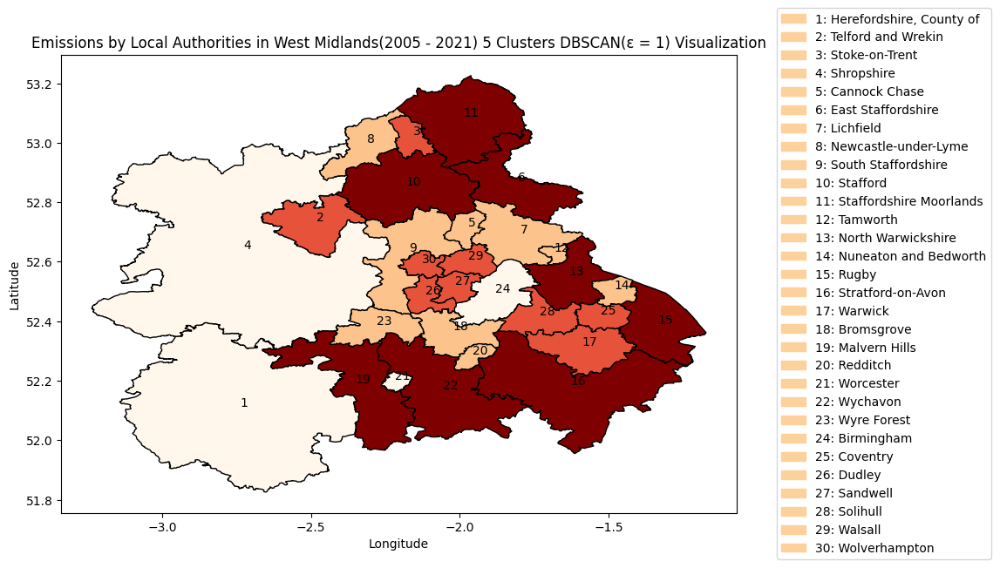

In [263]:
import pandas as pd
# Reading the CSV file into a DataFrame
topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)

# Converting the DataFrame to a GeoDataFrame
topo_lad_gdf = gpd.GeoDataFrame(topo_lad_df, geometry=gpd.GeoSeries.from_wkt(topo_lad_df['geometry']))

#westmidlands_emissions_df = pd.DataFrame(areas_to_visualize)
westmidlands_emissions_df = west_midlands_filtered_columns_pivot.reset_index()
#westmidlands_emissions_df.columns = ['clusters']

filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(areas_to_visualize["Local Authority"])]

filtered_gdf = filtered_gdf.merge(westmidlands_emissions_df, left_on='LAD13NM', right_on='Local Authority')

ax = filtered_gdf.plot(column='clusters DBSCAN(ε = 1)', cmap='OrRd', legend=False,  edgecolor='black', figsize=(10, 10))

filtered_gdf['ID'] = range(1, len(filtered_gdf) + 1)

for idx, row in filtered_gdf.iterrows():
    plt.annotate(text=row['ID'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
             xytext=(5, 5), textcoords='offset points',
             horizontalalignment='center', verticalalignment='center')

from matplotlib.patches import Patch
legend_labels = [Patch(label=f'{row["ID"]}: {row["LAD13NM"]}', color = '#FDD19B') for idx, row in filtered_gdf.iterrows()]

plt.legend(handles=legend_labels, bbox_to_anchor=(1.05, 0.5), loc='center left')

# Setting the title and labels
plt.title('Emissions by Local Authorities in West Midlands(2005 - 2021) 5 Clusters DBSCAN(ε = 1) Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Displaying the plot
plt.show()

<H1>Choosing the optimal Hyperparmeter Epsilon</H1>

> Indented block



The importance of an inflection point is that is shows when the changes occur and help to pick the optimal epsilon

Explained variance ratio: [0.45403269 0.28130925]


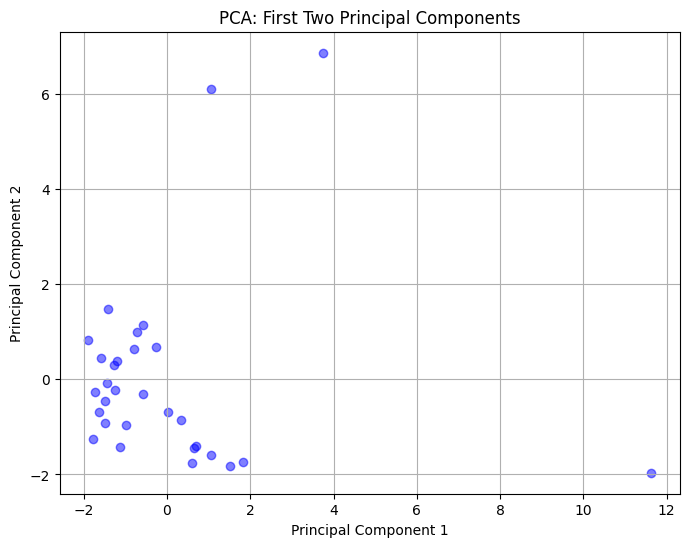

In [264]:
X_pca = pca.fit_transform(X_scaled)

explained_variance_ratio = pca.explained_variance_ratio_
print(f"Explained variance ratio: {explained_variance_ratio}")

plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c='b', marker='o', alpha=0.5)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA: First Two Principal Components")
plt.grid(True)
plt.show()

In [265]:
X_pca_df = pd.DataFrame(X_pca, columns=['Principal_Component_1', 'Principal_Component_2'])

In [266]:
X_pca_df

,Principal_Component_1,Principal_Component_2
0,11.634719,-1.964432
1,-1.446781,-0.087934
2,-1.639933,-0.693586
3,1.820766,-1.742504
4,1.057845,-1.588081
5,-1.191563,0.376531
6,1.050605,6.105513
7,-1.497038,-0.448075
8,-1.898883,0.828866
9,-1.234848,-0.221968


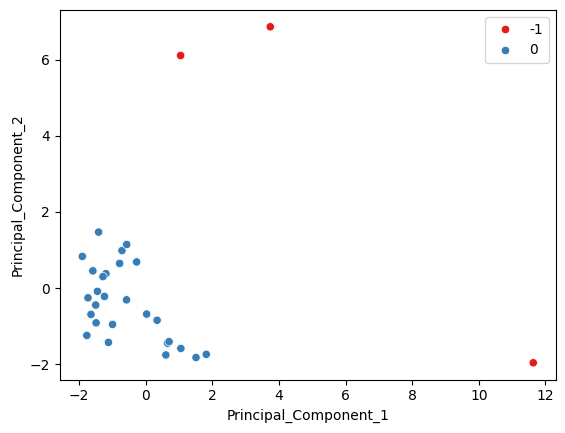

In [267]:
dbscan = DBSCAN(eps = 1)
display_categories(dbscan, X_pca_df)

In [268]:
len(np.unique(dbscan.labels_))

2

In [269]:
np.sum(dbscan.labels_ == -1)

3

In [270]:
100*np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)

10.0

In [271]:
len(dbscan.labels_)

30

In [272]:
outlier_percent = []
number_of_outliers = []

for eps in np.linspace(0.001,10,100):
  dbscan = DBSCAN(eps=eps)
  dbscan.fit(X_pca_df)

  number_of_outliers.append(np.sum(dbscan.labels_ == -1))

  perc_outliers = 100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)

  outlier_percent.append(perc_outliers)

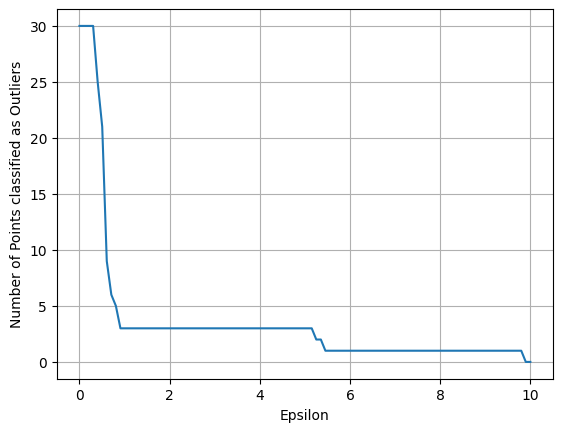

In [273]:
sns.lineplot(x=np.linspace(0.001,10,100), y=number_of_outliers)
plt.ylabel('Number of Points classified as Outliers')
plt.xlabel('Epsilon')
plt.grid()

From the plot above, as the epsilon value increases from 0 to around 2, the number of Outliers drops significantly. After this point, the curve flattens out, indicating that increasing epsilon further does not result in a significant reducation in the number of outliers.

Zooming in on the plot between O and 2

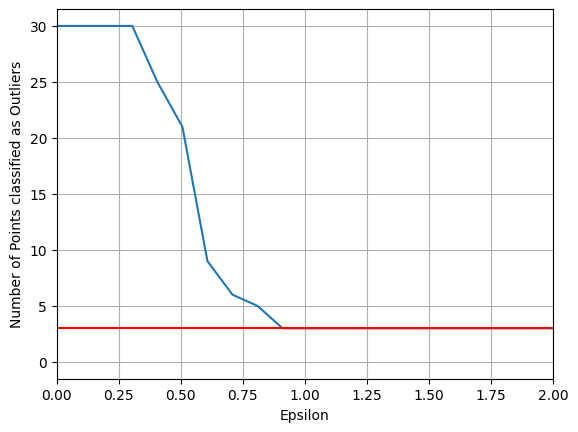

In [274]:
sns.lineplot(x=np.linspace(0.001,10,100),y=number_of_outliers)
plt.xlim(0,2)
plt.hlines(y=3,xmin=0,xmax=2,color='red')
plt.ylabel('Number of Points classified as Outliers')
plt.xlabel('Epsilon')
plt.grid()

From the above plot its observed that between 0.75 and 1.25 there seem to be an interesting stability

In [275]:
outlier_percent = []
number_of_outliers = []

for eps in np.linspace(0.001,7,100):
  dbscan = DBSCAN(eps=eps)
  dbscan.fit(X_pca_df)

  number_of_outliers.append(np.sum(dbscan.labels_ == -1))

  perc_outliers = 100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)

  outlier_percent.append(perc_outliers)

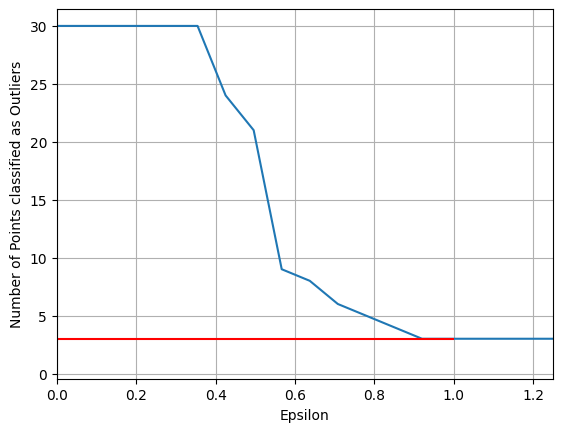

In [276]:
sns.lineplot(x=np.linspace(0.001,7,100),y=number_of_outliers)
plt.xlim(0,1.25)
plt.ylabel('Number of Points classified as Outliers')
plt.xlabel('Epsilon')
plt.hlines(y=3,xmin=0,xmax=1,color='red')
plt.grid()

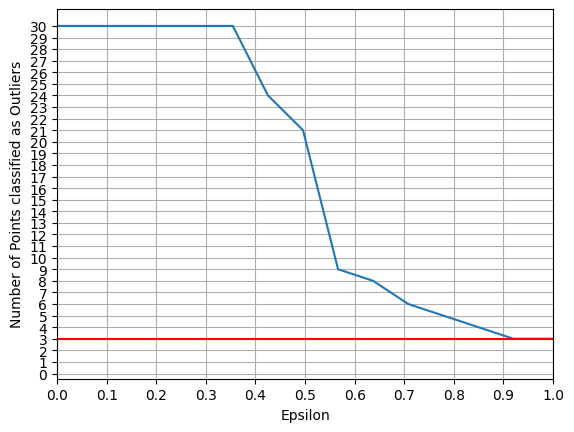

In [277]:
sns.lineplot(x=np.linspace(0.001,7,100),y=number_of_outliers)
plt.xlim(0,1)
plt.ylabel('Number of Points classified as Outliers')
plt.xlabel('Epsilon')
plt.hlines(y=3,xmin=0,xmax=1,color='red')
#plt.vlines(x=0.92,ymin=0,ymax=30,color='red')
plt.grid()
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 31, 1))
plt.show()

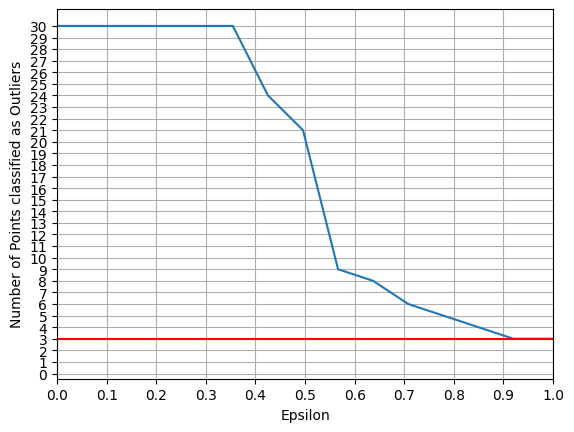

In [278]:
sns.lineplot(x=np.linspace(0.001,7,100),y=number_of_outliers)
plt.xlim(0,1)
plt.ylabel('Number of Points classified as Outliers')
plt.xlabel('Epsilon')
plt.hlines(y=3,xmin=0,xmax=1,color='red')
#plt.vlines(x=0.92,ymin=0,ymax=30,color='red')
plt.grid()
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 31, 1))
plt.show()

<H1>Calibrating DBSCAN Hyperparameters Further</H1>

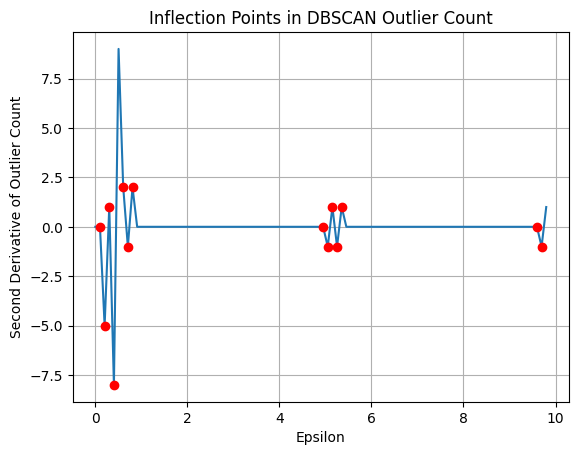

In [279]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from scipy.signal import find_peaks

outlier_counts = []
eps_values = np.linspace(0.001, 10, 100)

for eps in eps_values:
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(X_pca_df)
    outlier_counts.append(np.sum(dbscan.labels_ == -1))

second_derivative = np.diff(outlier_counts, n=2)

inflection_points = np.where(np.diff(np.sign(second_derivative)))[0]

plt.plot(eps_values[:-2], second_derivative)
plt.plot(eps_values[inflection_points], second_derivative[inflection_points], 'ro')
plt.xlabel('Epsilon')
plt.ylabel('Second Derivative of Outlier Count')
plt.title('Inflection Points in DBSCAN Outlier Count')
plt.grid()
plt.show()


In [280]:
eps_values = np.linspace(0.001, 10, 100)

eps_values = eps_values[:-2]

most_negative_index = np.argmin(second_derivative)
optimal_epsilon = eps_values[most_negative_index]
print(f"The optimal epsilon value is {optimal_epsilon}")


The optimal epsilon value is 0.405


In [281]:
import numpy as np

from sklearn import metrics
from sklearn.cluster import DBSCAN

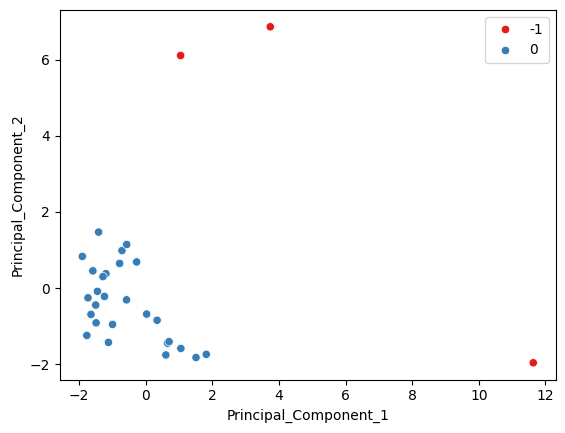

In [282]:
dbscan = DBSCAN(eps = 4.05)
display_categories(dbscan, X_pca_df)

In [283]:
outlier_percent = []
number_of_outliers = []

for n in np.arange(1,35):
  dbscan = DBSCAN(min_samples=n)
  dbscan.fit(X_pca_df)

  number_of_outliers.append(np.sum(dbscan.labels_ == -1))
  perc_outliers = 100 * np.sum(dbscan.labels_ == -1)/len(dbscan.labels_)

  outlier_percent.append(perc_outliers)



Text(0, 0.5, 'Percentage of points classified as an outlier')

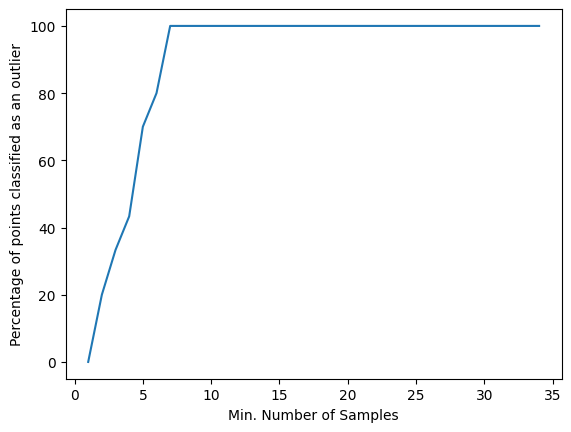

In [284]:
sns.lineplot(x=np.arange(1,35),y=outlier_percent)
plt.xlabel('Min. Number of Samples')
plt.ylabel('Percentage of points classified as an outlier')

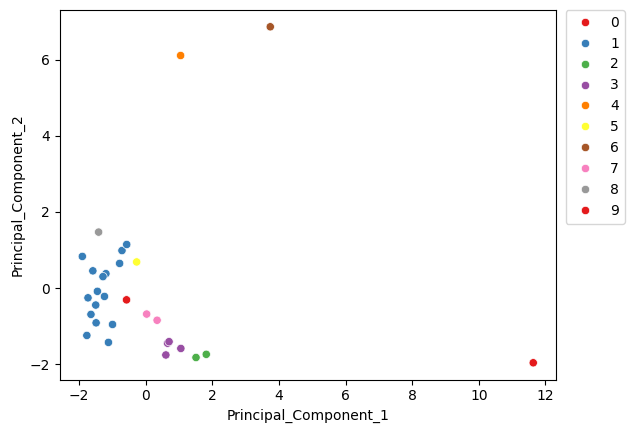

In [285]:
dbscan = DBSCAN(min_samples = 1)
display_categories(dbscan, X_pca_df)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

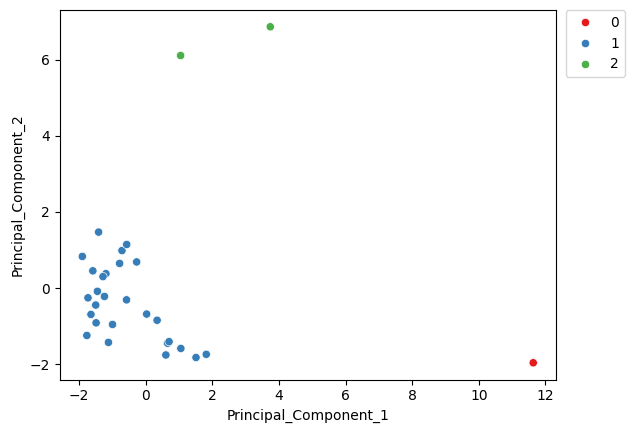

In [286]:
dbscan = DBSCAN(min_samples = 1, eps = 4.05)
display_categories(dbscan, X_pca_df)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

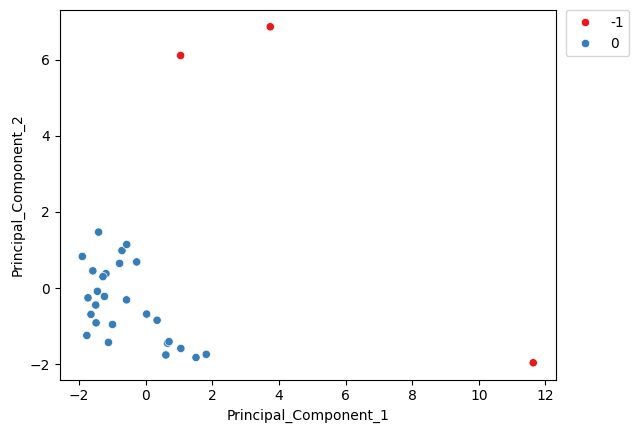

In [287]:
num_dim = X_pca_df.shape[1]
dbscan = DBSCAN(min_samples=2*num_dim,eps=4.05)
display_categories(dbscan,X_pca_df)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()


<h1>PCA</h1>

<p>Principal Component Analysis (PCA) is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components.</p>

<h1>Brief History</h1>

<p>1901: <b>Karl Pearson</b> a pivotal figure in the history of PCA, who in 1901 published a paper titled "On Lines and Planes of Closest Fit to Systems of Points in Space." This work, grounded in the principal axis theorem from geometry, laid the foundational concept for what would later evolve into PCA.</p> <p>Pearson, known for his contributions to statistics, was also the protege of Francis Galton. Among his many contributions to the field is the Pearson Correlation Coefficient, a measure of the linear correlation between two variables.</p>

<p>1933: American mathematician and economist <b>Harold Hotelling</b> made significant advancements in the methodology and application of PCA. Hotelling's publication, "Analysis of a Complex of Statistical Variables into Principal Components," not only independently developed the PCA technique but also named it. Hotelling's work expanded the application of PCA into various fields and solidified its role as a critical tool in statistical analysis.</p>





In [288]:
url = 'https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx'

data_1_1 = pd.read_excel(url, sheet_name='1_1')

In [289]:
# Extract the actual data, excluding the header information
data_1_1_actual = data_1_1.iloc[4:]

# Set the column names from the header row
data_1_1_actual.columns = data_1_1.iloc[3]


In [290]:
# Filter the data for the "london" Region/Country
London_data = data_1_1_actual[data_1_1_actual['Region/Country'] == 'London']
London_data

3,Region/Country,Second Tier Authority,Local Authority,Local Authority Code,Calendar Year,Industry Electricity,Industry Gas,Large Industrial Installations,Industry 'Other',Industry Total,...,Agriculture Soils,Agriculture Total,Landfill,Waste Management 'Other',Waste Management Total,Grand Total,"Population ('000s, mid-year estimate)",Per Capita Emissions (tCO2e),Area (km2),Emissions per km2 (kt CO2e)
3506,London,Barking and Dagenham,Barking and Dagenham,E09000002,2005,131.684063,17.459426,66.870493,28.426324,244.440306,...,0.211348,1.239115,161.428095,7.486672,168.914767,1143.769451,166.275,6.878782,37.7992,30.259091
3507,London,Barking and Dagenham,Barking and Dagenham,E09000002,2006,139.895257,13.63688,66.154453,28.690501,248.377092,...,0.396191,1.344134,149.864148,8.481513,158.345662,1137.669474,167.157,6.805994,37.7992,30.097713
3508,London,Barking and Dagenham,Barking and Dagenham,E09000002,2007,140.487938,12.727459,69.810178,30.324736,253.350311,...,0.25175,1.199139,155.877849,8.75395,164.631799,1129.493177,169.031,6.682166,37.7992,29.881404
3509,London,Barking and Dagenham,Barking and Dagenham,E09000002,2008,135.419965,12.319912,68.498117,25.60148,241.839473,...,0.151626,0.907199,128.605453,8.869047,137.4745,1059.17047,172.452,6.141828,37.7992,28.020976
3510,London,Barking and Dagenham,Barking and Dagenham,E09000002,2009,115.972501,12.15477,59.188809,21.28696,208.603041,...,0.129006,0.841917,178.517672,8.801381,187.319052,1027.842511,177.58,5.788053,37.7992,27.192176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4062,London,Westminster,Westminster,E09000033,2017,47.698762,23.283152,0.085511,95.767013,166.834438,...,0.017115,4.485572,9.338904,7.83116,17.170064,2062.990819,202.606251,10.182266,22.0301,93.644188
4063,London,Westminster,Westminster,E09000033,2018,131.422791,59.29191,1.014299,94.752952,286.481952,...,0.019147,15.027827,11.016105,7.773276,18.789381,1985.655839,201.909585,9.834381,22.0301,90.133764
4064,London,Westminster,Westminster,E09000033,2019,106.191379,57.354249,0.268476,84.414842,248.228947,...,0.021237,14.091068,9.521645,7.656918,17.178562,1768.356274,200.526526,8.818565,22.0301,80.270007
4065,London,Westminster,Westminster,E09000033,2020,69.206872,52.611429,0.188609,87.61706,209.62397,...,0.009882,14.423154,14.093663,7.487961,21.581624,1444.948575,200.752862,7.197649,22.0301,65.589742


In [291]:
import pandas as pd

url = 'https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx'
data_1_1 = pd.read_excel(url, sheet_name='1_1')

# Set the column names from the header row and skip the first 4 rows
data_1_1.columns = data_1_1.iloc[3]
data_1_1 = data_1_1.iloc[4:]

# Filter out rows where "Second Tier Authority" ends with "Total"
data_1_1_filtered = data_1_1[~data_1_1['Second Tier Authority'].str.endswith("Total")]

# Create a list of regions for filtering
regions = [
    'London', 'East Midlands', 'East of England', 'North East', 'North West',
    'Northern Ireland', 'Scotland', 'South East', 'South West', 'Wales',
    'West Midlands', 'Yorkshire and the Humber'
]

# Initialize a dictionary to hold pivot table for each region
regions_pivot_tables = {}

for region in regions:
    # Filter data for the current region
    region_data = data_1_1_filtered[data_1_1_filtered['Region/Country'] == region]

    # Create a pivot table for the current region
    pivot_table = pd.pivot_table(
        region_data,
        values=[
            "Commercial Total", "Waste Management Total", "Agriculture Total",
            "Transport Total", "Domestic Total", "Public Sector Total",
            "Industry Total", "LULUCF Net Emissions", "Emissions per km2 (kt CO2e)",
            "Population ('000s, mid-year estimate)", "Per Capita Emissions (tCO2e)",
            "Area (km2)"
        ],
        index=['Local Authority'],
        aggfunc=sum
    )

    # Store the pivot table in the dictionary
    regions_pivot_tables[region] = pivot_table


In [292]:
regions_pivot_tables[region].columns

Index(['Agriculture Total', 'Area (km2)', 'Commercial Total', 'Domestic Total',
       'Emissions per km2 (kt CO2e)', 'Industry Total', 'LULUCF Net Emissions',
       'Per Capita Emissions (tCO2e)', 'Population ('000s, mid-year estimate)',
       'Public Sector Total', 'Transport Total', 'Waste Management Total'],
      dtype='object', name=3)

In [293]:
import pandas as pd

url = 'https://raw.githubusercontent.com//OlajideFemi/OlajideFemi.github.io/index/2005-21-uk-local-authority-ghg-emissions-update-060723.xlsx'
data_1_1 = pd.read_excel(url, sheet_name='1_1')

# Set the column names from the header row and skip the first 4 rows
data_1_1.columns = data_1_1.iloc[3]
data_1_1 = data_1_1.iloc[4:]

# Filter out rows where "Second Tier Authority" ends with "Total"
data_1_1_filtered = data_1_1[~data_1_1['Second Tier Authority'].str.endswith("Total")]

# Create a list of regions for filtering
regions = [
    'London', 'East Midlands', 'East of England', 'North East', 'North West',
    'Northern Ireland', 'Scotland', 'South East', 'South West', 'Wales',
    'West Midlands', 'Yorkshire and the Humber'
]

# Initialize a list to hold all the region pivot tables
all_regions_pivot_tables = []

for region in regions:
    # Filter data for the current region
    region_data = data_1_1_filtered[data_1_1_filtered['Region/Country'] == region]

    # Create a pivot table for the current region
    pivot_table = pd.pivot_table(
        region_data,
        values=[
            "Commercial Total", "Waste Management Total", "Agriculture Total",
            "Transport Total", "Domestic Total", "Public Sector Total",
            "Industry Total", "LULUCF Net Emissions", "Emissions per km2 (kt CO2e)",
            "Population ('000s, mid-year estimate)", "Per Capita Emissions (tCO2e)",
            "Area (km2)"
        ],
        index=['Local Authority'],
        aggfunc=sum
    )

    # Add region as a level in the MultiIndex to distinguish between regions
    pivot_table_with_region = pivot_table.copy()
    pivot_table_with_region.index = pd.MultiIndex.from_product([[region], pivot_table.index], names=['Region', 'Local Authority'])

    # Append the pivot table to the list
    all_regions_pivot_tables.append(pivot_table_with_region)

# Concatenate all pivot tables into one DataFrame
all_regions_data = pd.concat(all_regions_pivot_tables)


In [294]:
all_regions_data

3                                              Agriculture Total  Area (km2)  \
Region                   Local Authority                                       
London                   Barking and Dagenham          19.579120    642.5864   
                         Barnet                        74.342545   1474.7211   
                         Bexley                        27.661103   1092.8705   
                         Brent                         10.207251    734.9525   
                         Bromley                      134.075680   2552.2916   
...                                                          ...         ...   
Yorkshire and the Humber Scarborough                 3139.385773  14033.5867   
                         Selby                       2159.358898  10237.7944   
                         Sheffield                    764.241315   6254.8134   
                         Wakefield                    855.568610   5756.5366   
                         York                        1011.558455   4624.2516   

3                                              Commercial Total  \
Region                   Local Authority                          
London                   Barking and Dagenham       1553.253161   
                         Barnet                     3601.821682   
                         Bexley                     2295.186992   
                         Brent                      3713.265008   
                         Bromley                    3078.271700   
...                                                         ...   
Yorkshire and the Humber Scarborough                1254.015123   
                         Selby                       912.579429   
                         Sheffield                  7975.425653   
                         Wakefield                  4413.715040   
                         York                       2912.510527   

3                                              Domestic Total  \
Region                   Local Authority                        
London                   Barking and Dagenham     4693.536163   
                         Barnet                  12364.593312   
                         Bexley                   7289.514848   
                         Brent                    8663.648628   
                         Bromley                 11476.036567   
...                                                       ...   
Yorkshire and the Humber Scarborough              4359.507361   
                         Selby                    3195.613204   
                         Sheffield               17158.808470   
                         Wakefield               10734.765687   
                         York                     6569.719860   

3                                              Emissions per km2 (kt CO2e)  \
Region                   Local Authority                                     
London                   Barking and Dagenham                   409.106813   
                         Barnet                                 330.741682   
                         Bexley                                 290.768666   
                         Brent                                  557.320791   
                         Bromley                                156.192098   
...                                                                    ...   
Yorkshire and the Humber Scarborough                             17.586032   
                         Selby                                   32.763694   
                         Sheffield                              148.418494   
                         Wakefield                              127.065455   
                         York                                    72.665497   

3                                              Industry Total  \
Region                   Local Authority                        
London                   Barking and Dagenham     3000.433754   
                         Barnet

In [295]:
all_regions_data_reset = all_regions_data.reset_index()


In [296]:
all_regions_data_reset.columns

Index(['Region', 'Local Authority', 'Agriculture Total', 'Area (km2)',
       'Commercial Total', 'Domestic Total', 'Emissions per km2 (kt CO2e)',
       'Industry Total', 'LULUCF Net Emissions',
       'Per Capita Emissions (tCO2e)', 'Population ('000s, mid-year estimate)',
       'Public Sector Total', 'Transport Total', 'Waste Management Total'],
      dtype='object', name=3)

In [297]:
all_regions_data_ = all_regions_data_reset.drop('Region', axis=1)
all_regions_data_.columns.name = None

In [298]:
all_regions_data_

,Local Authority,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
0,Barking and Dagenham,19.579120,642.5864,1553.253161,4693.536163,409.106813,3000.433754,43.106696,82.282843,3276.617269,465.037323,3213.478824,2475.485206
1,Barnet,74.342545,1474.7211,3601.821682,12364.593312,330.741682,898.185721,28.462209,79.685098,6189.282139,1717.304368,7643.282076,2363.286779
2,Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
3,Brent,10.207251,734.9525,3713.265008,8663.648628,557.320791,2611.735053,50.682257,77.356268,5379.886303,1483.027560,4305.373384,3256.431962
4,Bromley,134.075680,2552.2916,3078.271700,11476.036567,156.192098,706.049446,-134.951130,74.805600,5367.002039,1182.362262,5723.306438,1284.718390
...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
370,Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868
371,Sheffield,764.241315,6254.8134,7975.425653,17158.808470,148.418494,10930.638873,-215.406431,99.845601,9340.579916,2769.727076,11406.477143,3817.734255
372,Wakefield,855.568610,5756.5366,4413.715040,10734.765687,127.065455,9633.743066,-95.993901,129.556676,5680.795887,1552.273941,13195.590319,2737.216171


In [299]:
all_regions_data_.to_csv('all_regions_data_.csv')

In [300]:
all_regions_data_filtered = all_regions_data_.drop('Local Authority', axis = 1)

In [301]:
# Set 'Local Authority' as the index for the DataFrame
all_regions_data_filtered_ = all_regions_data_.set_index('Local Authority')


In [302]:
all_regions_data_filtered_



,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
Local Authority,,,,,,,,,,,,
Barking and Dagenham,19.579120,642.5864,1553.253161,4693.536163,409.106813,3000.433754,43.106696,82.282843,3276.617269,465.037323,3213.478824,2475.485206
Barnet,74.342545,1474.7211,3601.821682,12364.593312,330.741682,898.185721,28.462209,79.685098,6189.282139,1717.304368,7643.282076,2363.286779
Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
Brent,10.207251,734.9525,3713.265008,8663.648628,557.320791,2611.735053,50.682257,77.356268,5379.886303,1483.027560,4305.373384,3256.431962
Bromley,134.075680,2552.2916,3078.271700,11476.036567,156.192098,706.049446,-134.951130,74.805600,5367.002039,1182.362262,5723.306438,1284.718390
...,...,...,...,...,...,...,...,...,...,...,...,...
Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868
Sheffield,764.241315,6254.8134,7975.425653,17158.808470,148.418494,10930.638873,-215.406431,99.845601,9340.579916,2769.727076,11406.477143,3817.734255


In [303]:
all_regions_data_filtered_

,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
Local Authority,,,,,,,,,,,,
Barking and Dagenham,19.579120,642.5864,1553.253161,4693.536163,409.106813,3000.433754,43.106696,82.282843,3276.617269,465.037323,3213.478824,2475.485206
Barnet,74.342545,1474.7211,3601.821682,12364.593312,330.741682,898.185721,28.462209,79.685098,6189.282139,1717.304368,7643.282076,2363.286779
Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
Brent,10.207251,734.9525,3713.265008,8663.648628,557.320791,2611.735053,50.682257,77.356268,5379.886303,1483.027560,4305.373384,3256.431962
Bromley,134.075680,2552.2916,3078.271700,11476.036567,156.192098,706.049446,-134.951130,74.805600,5367.002039,1182.362262,5723.306438,1284.718390
...,...,...,...,...,...,...,...,...,...,...,...,...
Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868
Sheffield,764.241315,6254.8134,7975.425653,17158.808470,148.418494,10930.638873,-215.406431,99.845601,9340.579916,2769.727076,11406.477143,3817.734255


In [304]:
from sklearn.preprocessing import StandardScaler

In [305]:
scaler = StandardScaler()

In [306]:
scaled_X = scaler.fit_transform(all_regions_data_filtered_)

In [307]:
scaled_X - scaled_X.mean(axis=0)

array([[-0.61833332, -0.38259894, -0.30971649, ..., -0.44885379,
        -0.67308165,  1.21899702],
       [-0.60373338, -0.35274045,  0.53087629, ...,  0.96859124,
         0.4805603 ,  1.10810053],
       [-0.61617866, -0.36644193, -0.00527745, ..., -0.30298709,
        -0.3868911 , -0.28478938],
       ...,
       [-0.41980616, -0.18122213,  2.325505  , ...,  2.15983182,
         1.46059924,  2.54567085],
       [-0.39545828, -0.1991012 ,  0.86402194, ...,  0.78179277,
         1.92653325,  1.47769091],
       [-0.35387134, -0.23972962,  0.24803001, ...,  0.12907337,
        -0.13292876, -0.5090408 ]])

In [308]:
#scaled_X

In [309]:
covariance_matrix = np.cov(scaled_X, rowvar = False)

In [310]:
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)

In [311]:
eigen_values

array([4.46352683, 2.07652461, 1.80191724, 1.10061613, 0.97313572,
       0.50225069, 0.01329299, 0.05659962, 0.14970557, 0.22440822,
       0.34198764, 0.32820631])

In [312]:
eigen_vectors.shape

(12, 12)

In [313]:
num_components = 2

In [314]:
#sorted_key = np.argsort

In [315]:
#[0,1,2]
np.argsort([2,1,3])

array([1, 0, 2])

In [316]:
sorted_key = np.argsort(eigen_values)[::-1][:num_components]

In [317]:
eigen_values, eigen_vectors = eigen_values[sorted_key],eigen_vectors[:,sorted_key]

In [318]:
principal_components = np.dot(scaled_X, eigen_vectors)

In [319]:
principal_components

array([[-1.28593926e-01,  3.93453242e-01],
       [ 2.71366394e+00,  1.87957651e-01],
       [ 3.00729837e-02,  3.22140522e-01],
       [ 2.05171358e+00,  7.63829087e-01],
       [ 1.46365905e+00, -5.22840498e-03],
       [ 2.52998153e+00,  3.65026489e+00],
       [ 1.47038913e+00,  1.95506148e+01],
       [ 1.94047910e+00,  4.62224795e-01],
       [ 1.71535510e+00,  7.41496867e-01],
       [ 1.42390230e+00,  2.35565468e-01],
       [ 9.26092561e-01,  6.39099833e-01],
       [ 7.63268546e-02,  1.33536757e+00],
       [ 1.69507197e-01,  2.10030471e+00],
       [-1.97973444e-02,  7.96025759e-01],
       [-1.26807607e-01,  3.13145326e-01],
       [ 1.00427789e+00, -1.30159366e-01],
       [ 3.27173912e+00,  8.70371043e-01],
       [ 1.57230383e+00,  1.08281767e+00],
       [ 5.82395156e-01,  2.63407227e+00],
       [ 6.22293368e-01,  3.62098893e+00],
       [-7.29249841e-01,  6.10851717e-01],
       [ 1.70060311e+00,  1.66686470e+00],
       [ 8.75938406e-01,  5.45732197e-01],
       [-2.

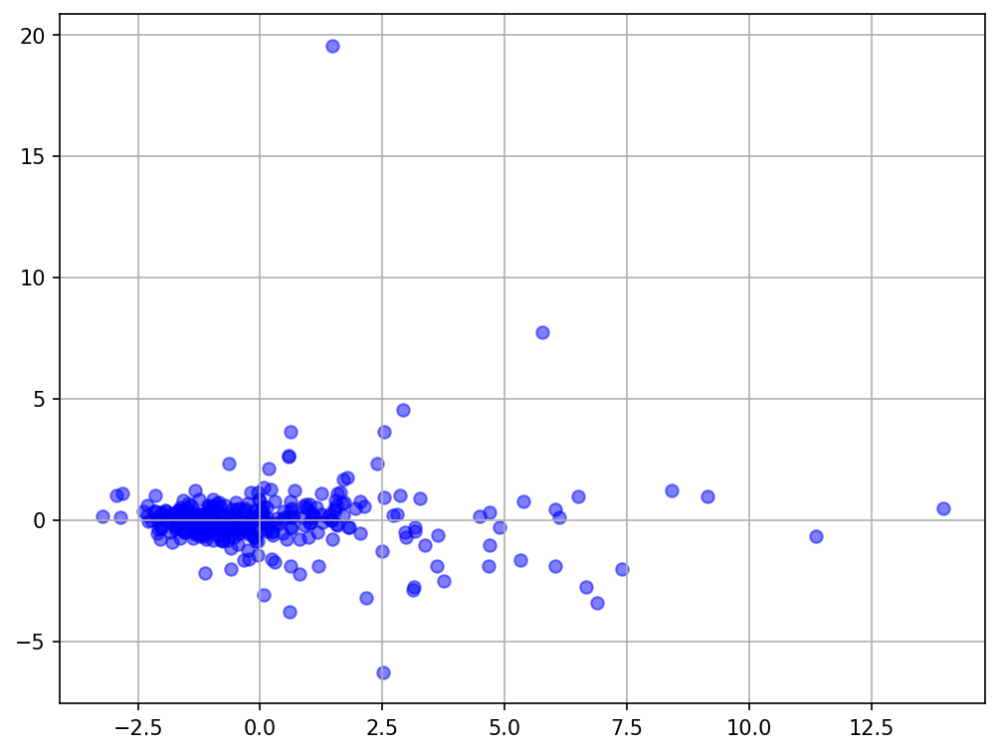

In [320]:
plt.figure(figsize=(8,6),dpi=150)
plt.scatter(principal_components[:,0],principal_components[:,1], c='b', marker='o', alpha=0.5)
plt.grid()

<h1>PCA Using Scikit-Learn</h1>

In [321]:
all_regions_data_filtered_

,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
Local Authority,,,,,,,,,,,,
Barking and Dagenham,19.579120,642.5864,1553.253161,4693.536163,409.106813,3000.433754,43.106696,82.282843,3276.617269,465.037323,3213.478824,2475.485206
Barnet,74.342545,1474.7211,3601.821682,12364.593312,330.741682,898.185721,28.462209,79.685098,6189.282139,1717.304368,7643.282076,2363.286779
Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
Brent,10.207251,734.9525,3713.265008,8663.648628,557.320791,2611.735053,50.682257,77.356268,5379.886303,1483.027560,4305.373384,3256.431962
Bromley,134.075680,2552.2916,3078.271700,11476.036567,156.192098,706.049446,-134.951130,74.805600,5367.002039,1182.362262,5723.306438,1284.718390
...,...,...,...,...,...,...,...,...,...,...,...,...
Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868
Sheffield,764.241315,6254.8134,7975.425653,17158.808470,148.418494,10930.638873,-215.406431,99.845601,9340.579916,2769.727076,11406.477143,3817.734255


In [322]:
from sklearn.preprocessing import StandardScaler

In [323]:
scaler = StandardScaler()

In [324]:
scaled_X = scaler.fit_transform(all_regions_data_filtered_)

In [325]:
scaled_X

array([[-0.61833332, -0.38259894, -0.30971649, ..., -0.44885379,
        -0.67308165,  1.21899702],
       [-0.60373338, -0.35274045,  0.53087629, ...,  0.96859124,
         0.4805603 ,  1.10810053],
       [-0.61617866, -0.36644193, -0.00527745, ..., -0.30298709,
        -0.3868911 , -0.28478938],
       ...,
       [-0.41980616, -0.18122213,  2.325505  , ...,  2.15983182,
         1.46059924,  2.54567085],
       [-0.39545828, -0.1991012 ,  0.86402194, ...,  0.78179277,
         1.92653325,  1.47769091],
       [-0.35387134, -0.23972962,  0.24803001, ...,  0.12907337,
        -0.13292876, -0.5090408 ]])

In [326]:
from sklearn.decomposition import PCA

In [327]:
pca_model = PCA(n_components=2)

In [328]:
pca_model.fit(scaled_X)

PCA(n_components=2)

In [329]:
pca_model.transform(scaled_X)

array([[-1.28593926e-01,  3.93453242e-01],
       [ 2.71366394e+00,  1.87957651e-01],
       [ 3.00729837e-02,  3.22140522e-01],
       [ 2.05171358e+00,  7.63829087e-01],
       [ 1.46365905e+00, -5.22840498e-03],
       [ 2.52998153e+00,  3.65026489e+00],
       [ 1.47038913e+00,  1.95506148e+01],
       [ 1.94047910e+00,  4.62224795e-01],
       [ 1.71535510e+00,  7.41496867e-01],
       [ 1.42390230e+00,  2.35565468e-01],
       [ 9.26092561e-01,  6.39099833e-01],
       [ 7.63268546e-02,  1.33536757e+00],
       [ 1.69507197e-01,  2.10030471e+00],
       [-1.97973444e-02,  7.96025759e-01],
       [-1.26807607e-01,  3.13145326e-01],
       [ 1.00427789e+00, -1.30159366e-01],
       [ 3.27173912e+00,  8.70371043e-01],
       [ 1.57230383e+00,  1.08281767e+00],
       [ 5.82395156e-01,  2.63407227e+00],
       [ 6.22293368e-01,  3.62098893e+00],
       [-7.29249841e-01,  6.10851717e-01],
       [ 1.70060311e+00,  1.66686470e+00],
       [ 8.75938406e-01,  5.45732197e-01],
       [-2.

In [330]:
pc_results = pca_model.fit_transform(scaled_X)

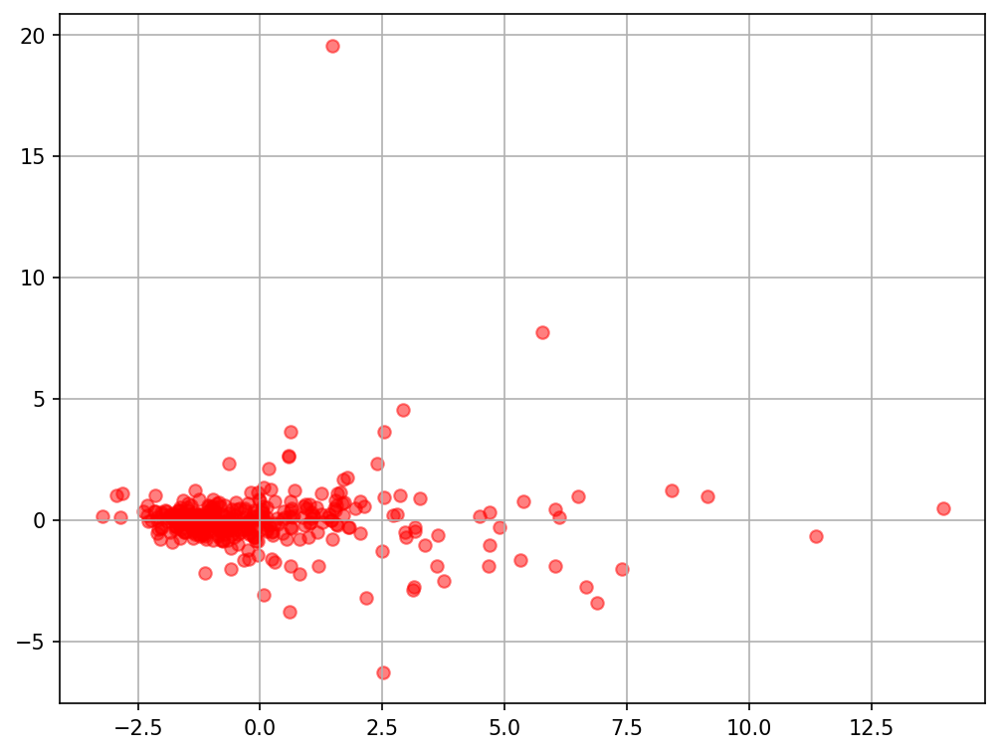

In [331]:
plt.figure(figsize=(8,6),dpi=150)
plt.scatter(pc_results[:,0],pc_results[:,1], c='r', marker='o', alpha=0.5)
plt.grid()

In [332]:
pca_model.components_

array([[ 0.05947605,  0.05224037,  0.35361081,  0.44728348,  0.08784852,
         0.08737687, -0.02620825, -0.0136846 ,  0.44830501,  0.398324  ,
         0.37885788,  0.38630496],
       [-0.36520247, -0.31650621,  0.35068733, -0.12406863,  0.61081826,
         0.05625305,  0.04329869,  0.40053519, -0.05462815,  0.16512104,
        -0.22024824, -0.10368841]])

In [333]:
df_comp = pd.DataFrame(pca_model.components_,index=['PC1','PC2'], columns=all_regions_data_filtered_.columns)

In [334]:
df_comp

,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
PC1,0.059476,0.052240,0.353611,0.447283,0.087849,0.087377,-0.026208,-0.013685,0.448305,0.398324,0.378858,0.386305
PC2,-0.365202,-0.316506,0.350687,-0.124069,0.610818,0.056253,0.043299,0.400535,-0.054628,0.165121,-0.220248,-0.103688


<Axes: >

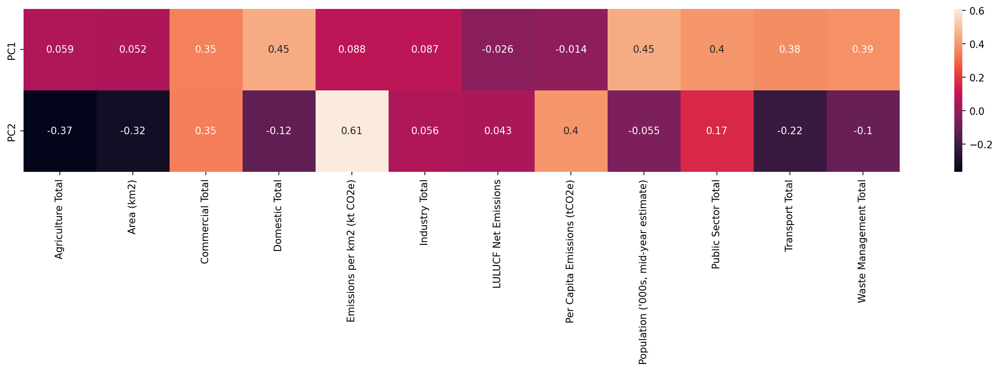

In [335]:
plt.figure(figsize=(20,3),dpi=150)
sns.heatmap(df_comp, annot=True)

In [336]:
pca_model.explained_variance_ratio_

array([0.37096602, 0.17258103])

In [337]:
np.sum(pca_model.explained_variance_ratio_)

0.5435470564113112

In [338]:
pca_12 = PCA(n_components = 12)

In [339]:
pca_12.fit(scaled_X)

PCA(n_components=12)

In [340]:
pca_12.explained_variance_ratio_

array([0.37096602, 0.17258103, 0.14975827, 0.09147278, 0.08087781,
       0.04174231, 0.02842277, 0.0272774 , 0.01865068, 0.01244211,
       0.00470402, 0.00110479])

In [341]:
np.sum(pca_12.explained_variance_ratio_)

0.9999999999999999

In [342]:
explained_variance = []

for n in range(1,12):
  pca= PCA(n_components=n)
  pca.fit(scaled_X)

  explained_variance.append(np.sum(pca.explained_variance_ratio_))

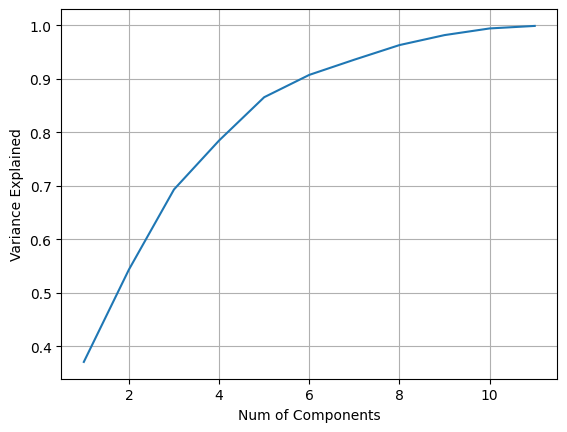

In [343]:
plt.plot(range(1,12),explained_variance)
plt.xlabel('Num of Components')
plt.ylabel('Variance Explained')
plt.grid()

<h1>PCA Calibration</h1>

In [344]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [345]:
# Step 1: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(all_regions_data_filtered_)

In [346]:
# Step 2: Apply PCA and choose the number of components based on explained variance
pca = PCA().fit(scaled_data)

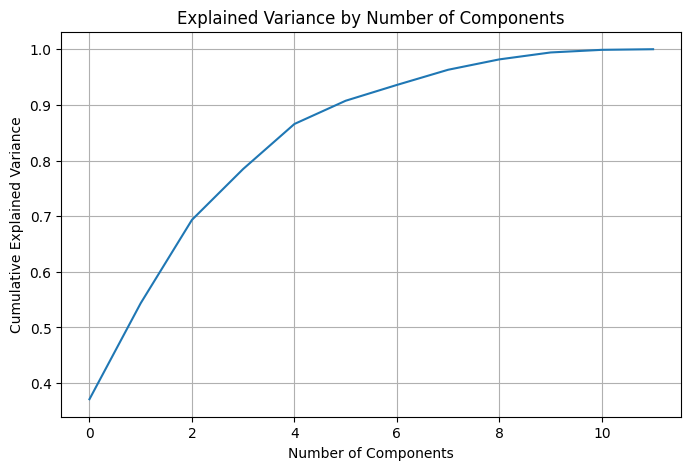

In [347]:
# Step 3: Determine the number of components to retain
# Plot the cumulative sum of explained variance to decide how many components is optimal
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid(True)
plt.show()

In [348]:
# Based on the plot above, the number of components 6 components explain 90% of variance:
n_components = 6
pca = PCA(n_components=n_components)
pca.fit(scaled_data)

PCA(n_components=6)

In [349]:
# Step 4: Transform the data using the PCA model
transformed_data = pca.transform(scaled_data)

In [350]:
# Step 5: Create a DataFrame with the PCA features
pca_columns = [f'PC{i+1}' for i in range(n_components)]
pca_df = pd.DataFrame(transformed_data, columns=pca_columns, index=all_regions_data_filtered_.index)


In [351]:
components_df = pd.DataFrame(pca.components_, columns=all_regions_data_filtered_.columns, index=pca_columns)


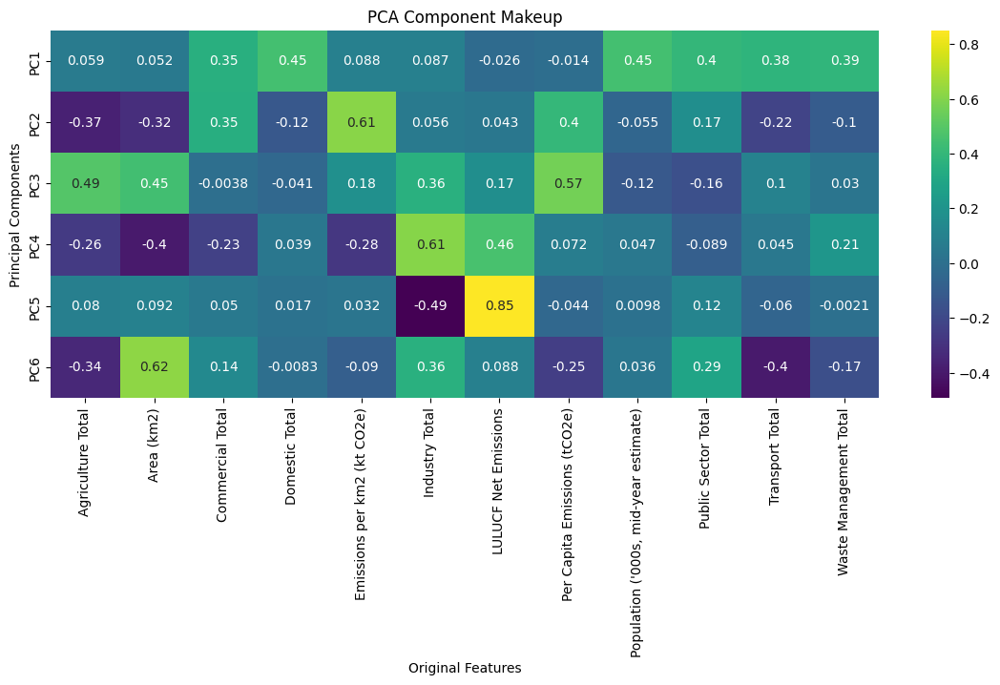

In [352]:
# Step 6: Visualize the PCA component makeup
plt.figure(figsize=(14, 5))
sns.heatmap(components_df, annot=True, cmap='viridis')
plt.title('PCA Component Makeup')
plt.ylabel('Principal Components')
plt.xlabel('Original Features')
plt.show()

In [353]:
# Step 7: The explained variance by each principal component
print("Explained variance by each component: ", pca.explained_variance_ratio_)


Explained variance by each component:  [0.37096602 0.17258103 0.14975827 0.09147278 0.08087781 0.04174231]


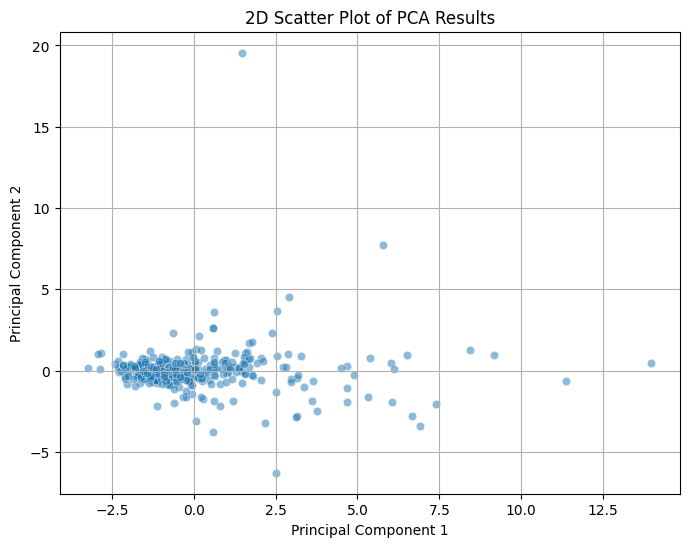

In [354]:
# Create a 2D scatter plot using the first two principal components
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df, alpha=0.5)
plt.title('2D Scatter Plot of PCA Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()


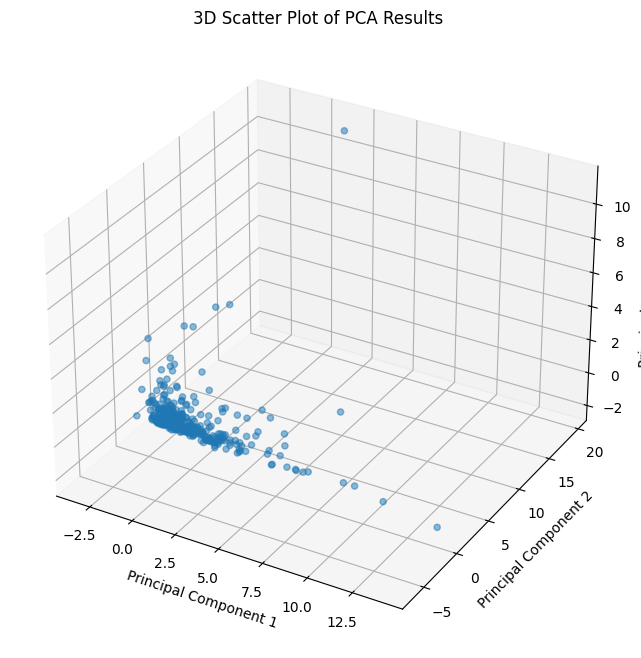

In [355]:
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(pca_df['PC1'], pca_df['PC2'], pca_df['PC3'], alpha=0.5)

ax.set_title('3D Scatter Plot of PCA Results')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.show()


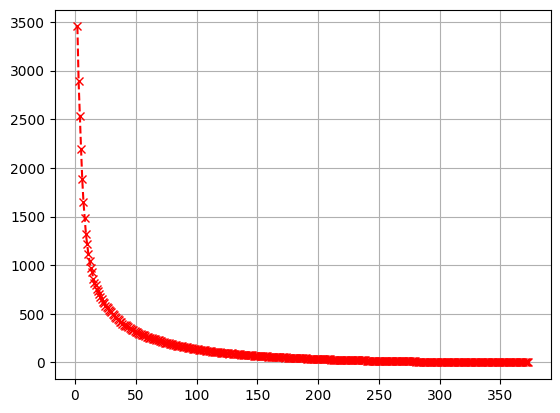

In [356]:
X = all_regions_data_filtered_

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

from sklearn.cluster import KMeans

k_values = range(2,374)

sum_squared_distance = []
for k in k_values:
  model = KMeans(n_clusters=k)
  model.fit(scaled_X)

  sum_squared_distance.append(model.inertia_)

plt.plot(k_values, sum_squared_distance,'x--', color='red')
plt.grid(True)

In [357]:
#pd.Series(sum_squared_distance).diff().plot(kind='bar', color='red')

In [358]:
pip install kneed

In [359]:
from kneed import KneeLocator

knee_locator = KneeLocator(k_values, sum_squared_distance, curve='convex', direction='decreasing')

# The optimal k is where the elbow is located
optimal_k = knee_locator.elbow

print(f"The optimal k is: {optimal_k}")


The optimal k is: 40


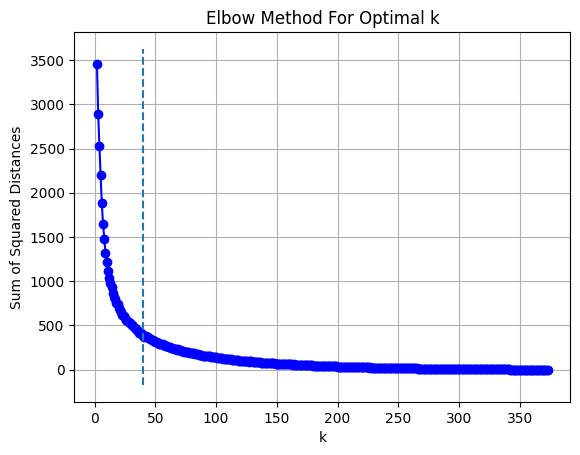

In [360]:
plt.plot(k_values, sum_squared_distance, 'bo-')
plt.xlabel('k')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method For Optimal k')
plt.vlines(optimal_k, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.grid()
plt.show()

<h1>Choosing K=32</h1>

In [361]:
model = KMeans(n_clusters=32)
model.fit(scaled_X)

KMeans(n_clusters=32)

In [362]:
X['K=32 Cluster Labels'] = model.labels_

<Axes: >

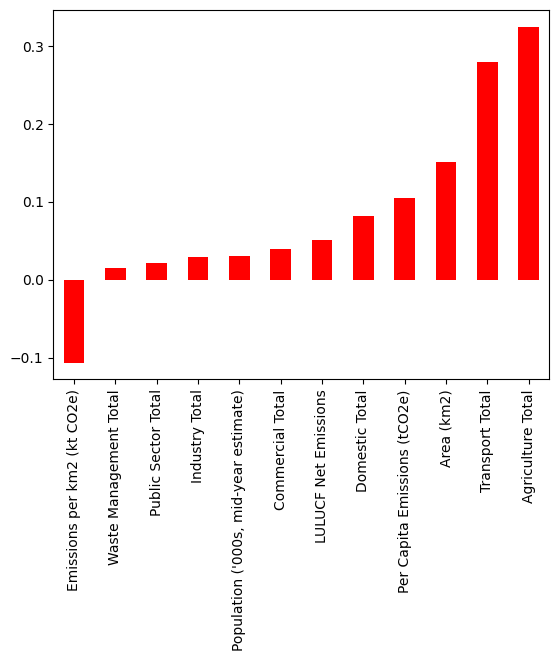

In [363]:
X.corr()['K=32 Cluster Labels'].iloc[:-1].sort_values().plot(kind='bar', color='red')

In [364]:
all_regions_data_filtered_['K=32 Cluster Labels'] = model.labels_
pca_df['K=32 Cluster Labels'] = model.labels_

In [365]:
model.labels_.shape

(374,)

In [366]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,K=32 Cluster Labels
Local Authority,,,,,,,
Barking and Dagenham,-0.128594,0.393453,-0.643029,0.330815,-0.058487,-0.136944,0
Barnet,2.713664,0.187958,-1.114811,0.113135,0.211386,-0.043582,1
Bexley,0.030073,0.322141,-0.802694,0.065639,-0.046094,0.135635,20
Brent,2.051714,0.763829,-0.918244,0.172872,0.162269,0.075974,1
Bromley,1.463659,-0.005228,-1.124338,-0.013746,0.085503,0.162618,1
...,...,...,...,...,...,...,...
Scarborough,-1.307369,-0.335389,-0.072605,-0.376426,-0.284654,0.134967,13
Selby,-1.428600,-0.127965,0.406047,0.201079,-0.345055,-0.237068,13
Sheffield,6.124410,0.093747,-0.971568,0.562967,-0.109381,0.336472,6


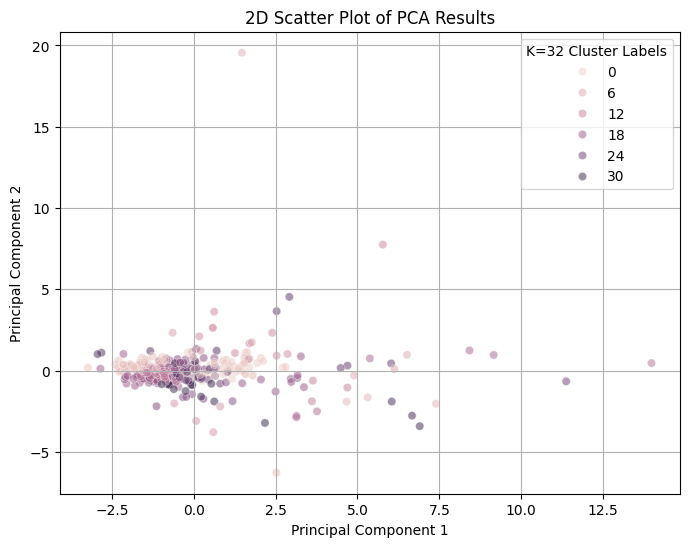

In [367]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='K=32 Cluster Labels', data=pca_df, alpha=0.5)
plt.title('2D Scatter Plot of PCA Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

In [368]:
areas_to_visualize = all_regions_data_['Local Authority']

In [369]:
pca_df.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'K=32 Cluster Labels'], dtype='object')

In [370]:
topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
topo_lad_df = pd.read_csv(topo_lad_csv_path)



In [371]:
all_regions_data_['K32Cluster'] = model.labels_

In [372]:
filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(all_regions_data_['Local Authority'])]


In [373]:
#areas_to_visualize = all_regions_data_['Local Authority']

In [374]:
filtered_gdf = topo_lad_gdf[topo_lad_gdf['LAD13NM'].isin(all_regions_data_['Local Authority'])]


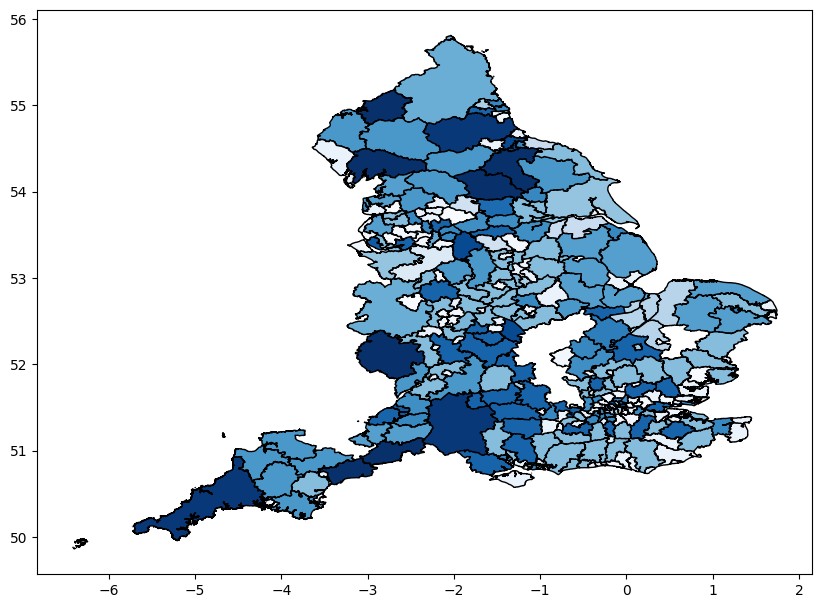

In [375]:
filtered_gdf_ = filtered_gdf.merge(all_regions_data_, left_on='LAD13NM', right_on='Local Authority')

ax = filtered_gdf_.plot(column='K32Cluster', cmap='Blues', legend=False,  edgecolor='black', figsize=(10, 10))


<h1>DBSCAN Cluster</h1>

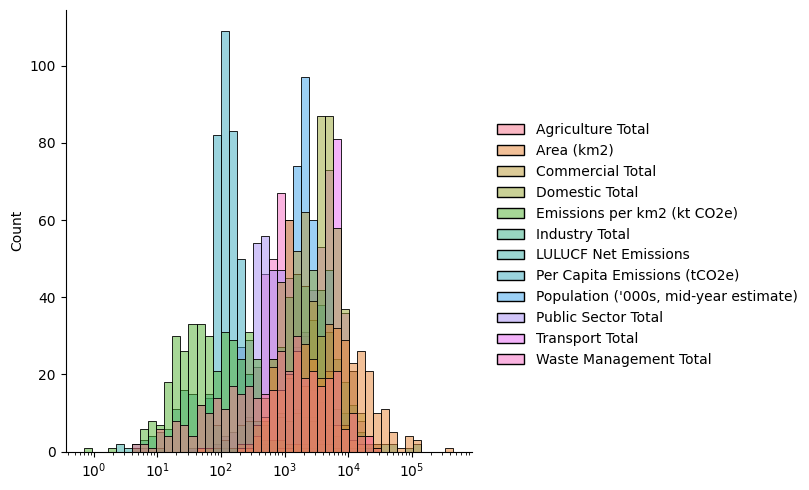

In [376]:

plotting = all_regions_data_.drop(columns=['K32Cluster'])
sns.displot(plotting, log_scale=(True, False))

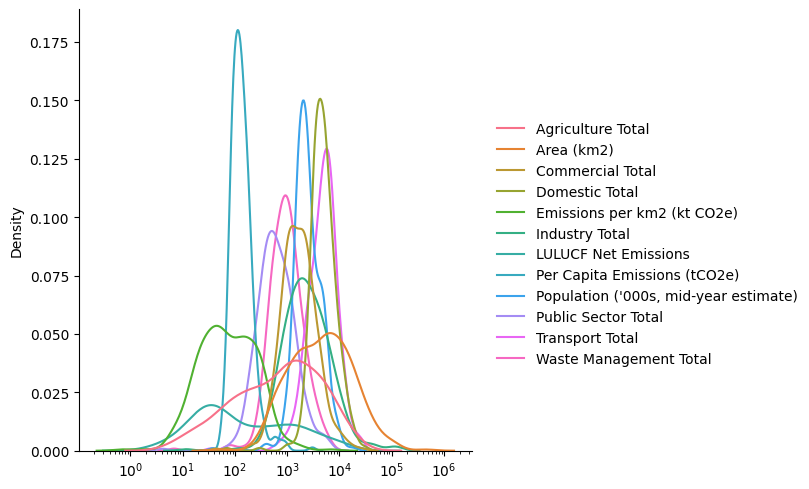

In [377]:
plotting = all_regions_data_.drop(columns=['K32Cluster'])
sns.displot(plotting, kind='kde', log_scale=(True, False))

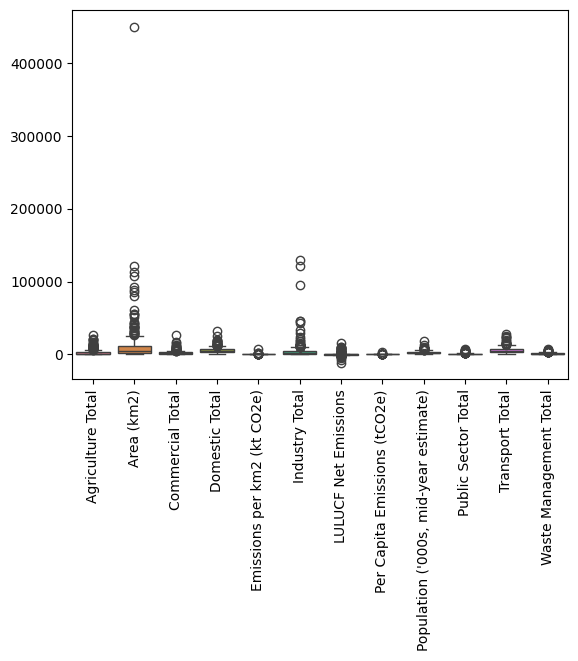

In [378]:
sns.boxplot(plotting)
plt.xticks(rotation=90)
plt.show()

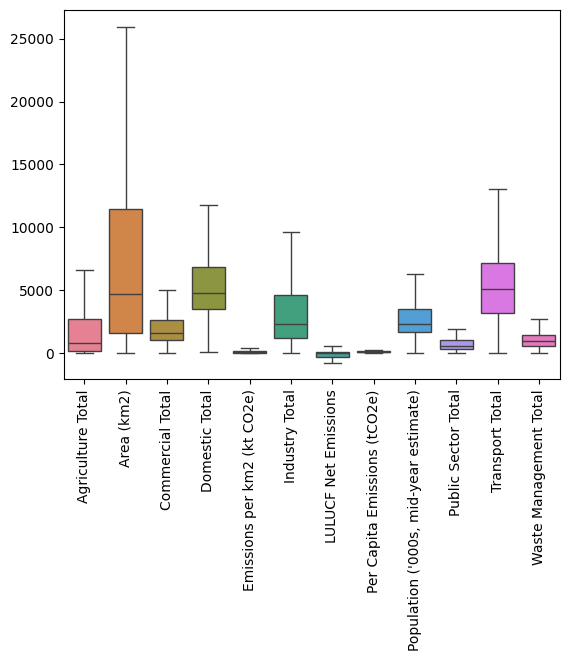

In [379]:
sns.boxplot(data=plotting, showfliers=False)
plt.xticks(rotation=90)
plt.show()

In [380]:
plotting.describe()

,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,2338.906344,11305.344118,2308.048423,5742.127086,164.179635,4778.461029,172.630091,159.127649,2909.832427,861.585193,5798.006282,1242.177090
std,3755.958287,27906.615457,2440.316905,3623.503903,412.775740,11409.046965,1988.074959,181.721794,1957.319734,884.651287,3844.986179,1013.095367
min,4.551810,53.543200,44.051211,69.869025,0.707222,11.573765,-11227.765659,57.197021,38.266932,4.183951,35.000698,6.831786
25%,157.933628,1641.351275,1021.522071,3537.757829,29.298242,1231.578077,-267.421280,97.377059,1693.552675,365.585520,3182.340985,593.520875
50%,850.894643,4700.596050,1607.787642,4748.054464,71.500791,2313.840129,-1.724076,126.196152,2323.216486,587.401798,5105.856313,955.220789
75%,2731.033791,11471.199225,2650.394894,6831.055865,190.134489,4617.679149,71.686234,173.240782,3525.950176,1030.649788,7143.042517,1461.575117
max,26524.234235,450057.143200,25994.772053,31681.462010,6929.174349,129639.016191,15397.119216,3034.072382,18590.768486,6913.832893,27444.434178,7198.637524


In [381]:
plotting

,Local Authority,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
0,Barking and Dagenham,19.579120,642.5864,1553.253161,4693.536163,409.106813,3000.433754,43.106696,82.282843,3276.617269,465.037323,3213.478824,2475.485206
1,Barnet,74.342545,1474.7211,3601.821682,12364.593312,330.741682,898.185721,28.462209,79.685098,6189.282139,1717.304368,7643.282076,2363.286779
2,Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
3,Brent,10.207251,734.9525,3713.265008,8663.648628,557.320791,2611.735053,50.682257,77.356268,5379.886303,1483.027560,4305.373384,3256.431962
4,Bromley,134.075680,2552.2916,3078.271700,11476.036567,156.192098,706.049446,-134.951130,74.805600,5367.002039,1182.362262,5723.306438,1284.718390
...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
370,Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868
371,Sheffield,764.241315,6254.8134,7975.425653,17158.808470,148.418494,10930.638873,-215.406431,99.845601,9340.579916,2769.727076,11406.477143,3817.734255
372,Wakefield,855.568610,5756.5366,4413.715040,10734.765687,127.065455,9633.743066,-95.993901,129.556676,5680.795887,1552.273941,13195.590319,2737.216171


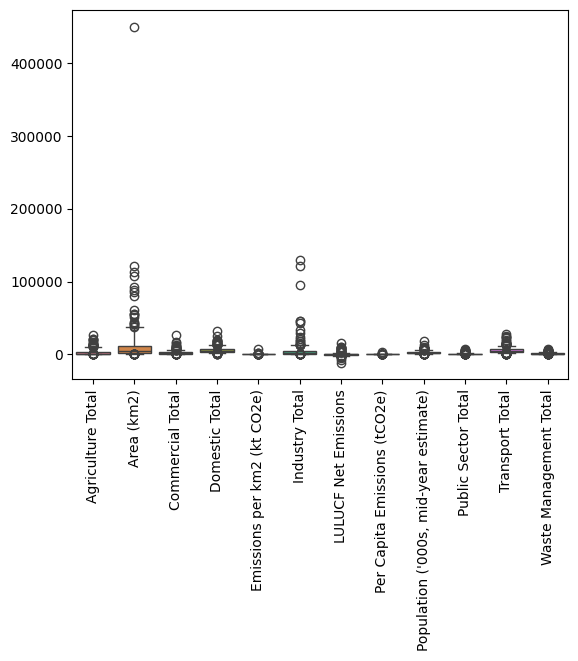

In [382]:
sns.boxplot(data=plotting, whis=[5, 95])

plt.xticks(rotation=90)
plt.show()

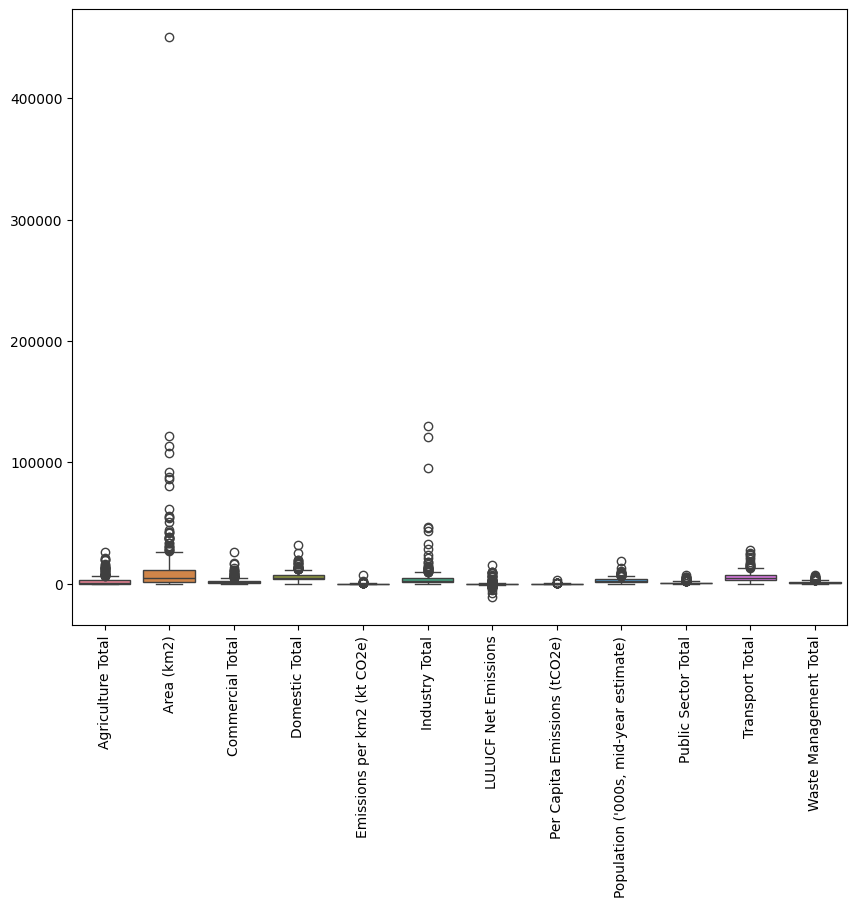

In [383]:
plt.figure(figsize=(10, 8))
sns.boxplot(data=plotting)

plt.xticks(rotation=90)
plt.show()

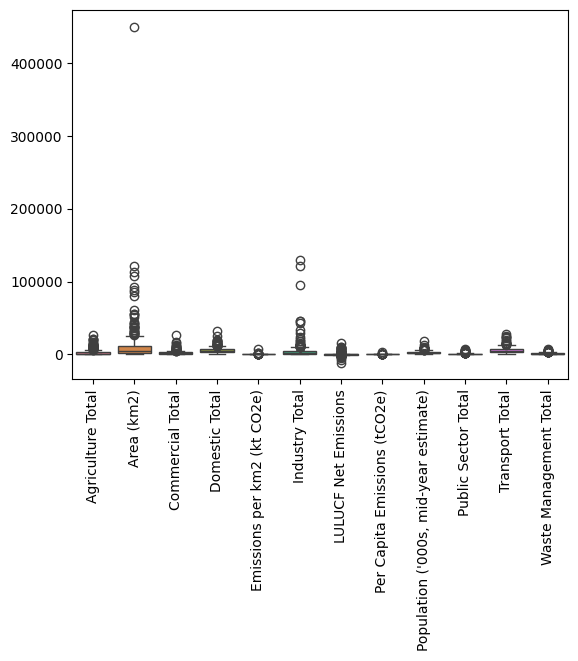

In [384]:
sns.boxplot(data=plotting, whis=1.5)

plt.xticks(rotation=90)
plt.show()

In [385]:
iqr_values = plotting.quantile(0.75) - plotting.quantile(0.25)
lower_bounds = plotting.quantile(0.25) - 1.5 * iqr_values
upper_bounds = plotting.quantile(0.75) + 1.5 * iqr_values

#for column in plotting.columns:
#    plt.figure(figsize=(8, 6))
#    sns.boxplot(x=plotting[column])
    #plt.ylim(lower_bounds[column], upper_bounds[column])
    #plt.title(f'Boxplot with IQR Whiskers for {column}')
#    plt.xticks(rotation=90)
#    plt.show()

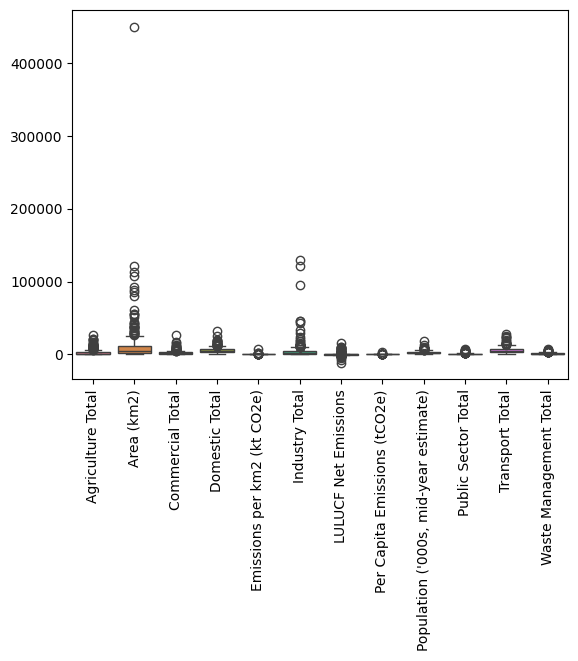

In [386]:
sns.boxplot(data=plotting, whis=1.5)

plt.xticks(rotation=90)
plt.show()

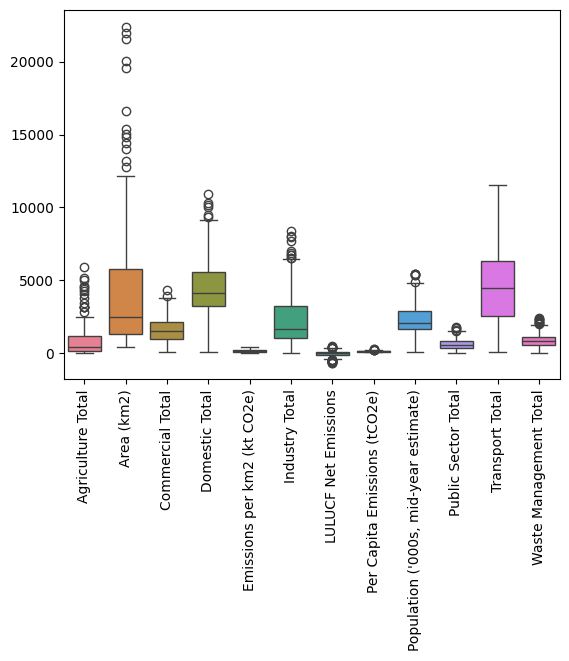

In [387]:

Q1 = plotting.quantile(0.25)
Q3 = plotting.quantile(0.75)
IQR = Q3 - Q1

multiplier = 1.25
lower_bound = Q1 - multiplier * IQR
upper_bound = Q3 + multiplier * IQR

filtered_data = plotting[~((plotting < lower_bound) | (plotting > upper_bound)).any(axis=1)]

sns.boxplot(data=filtered_data)
plt.xticks(rotation=90)
plt.show()


In [388]:
filtered_data

,Local Authority,Agriculture Total,Area (km2),Commercial Total,Domestic Total,Emissions per km2 (kt CO2e),Industry Total,LULUCF Net Emissions,Per Capita Emissions (tCO2e),"Population ('000s, mid-year estimate)",Public Sector Total,Transport Total,Waste Management Total
2,Bexley,27.661103,1092.8705,2295.186992,7289.514848,290.768666,3191.273950,28.507405,79.981719,4004.543634,593.905850,4312.405426,954.044265
9,Enfield,72.756639,1397.4034,3238.016307,9323.307017,307.372874,2379.946783,26.756901,81.060182,5353.614168,1136.599720,7866.690056,1222.038310
10,Greenwich,11.680953,857.5106,3055.437737,6858.456545,385.474567,1357.211756,17.998808,75.818135,4439.850421,1561.878557,5037.130096,1544.236556
14,Harrow,22.693503,857.8778,1678.791102,7658.520358,294.732154,954.654754,9.945790,61.491422,4172.193756,806.734844,3076.858090,664.988136
15,Havering,111.993094,1945.7741,2337.160003,7921.823388,190.481897,1109.941813,-2.177311,90.160035,4149.804432,761.199601,7223.154614,2338.948420
...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,Richmondshire,4565.814869,22418.0258,858.868509,2087.808403,9.491698,500.400582,396.453125,241.324306,881.913194,220.673855,3612.917676,273.835392
367,Rotherham,643.640825,4871.0831,2860.342383,8354.413111,116.405623,8379.468040,-155.562123,128.369238,4433.414203,1073.415407,10116.871738,2081.614390
369,Scarborough,3139.385773,14033.5867,1254.015123,4359.507361,17.586032,2566.630258,-664.828755,133.270552,1852.336369,422.919185,2800.010549,639.719486
370,Selby,2159.358898,10237.7944,912.579429,3195.613204,32.763694,6856.004295,-25.943272,232.716759,1452.833306,195.653145,5893.710361,544.080868


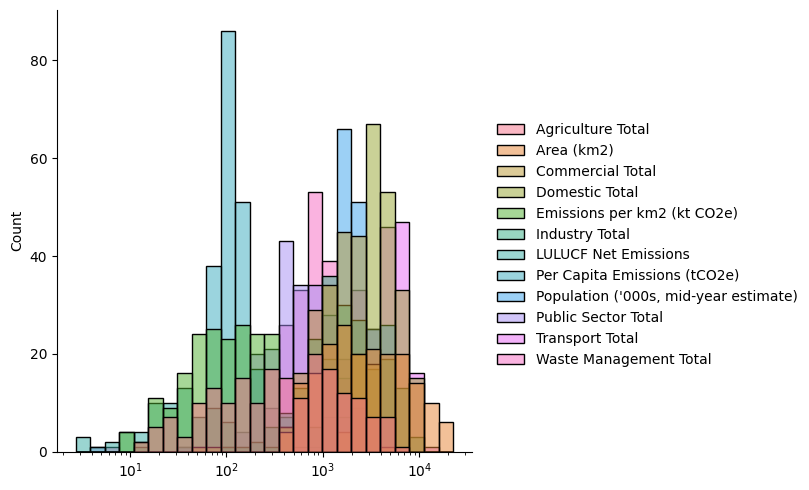

In [389]:
sns.displot(filtered_data, log_scale=(True, False))

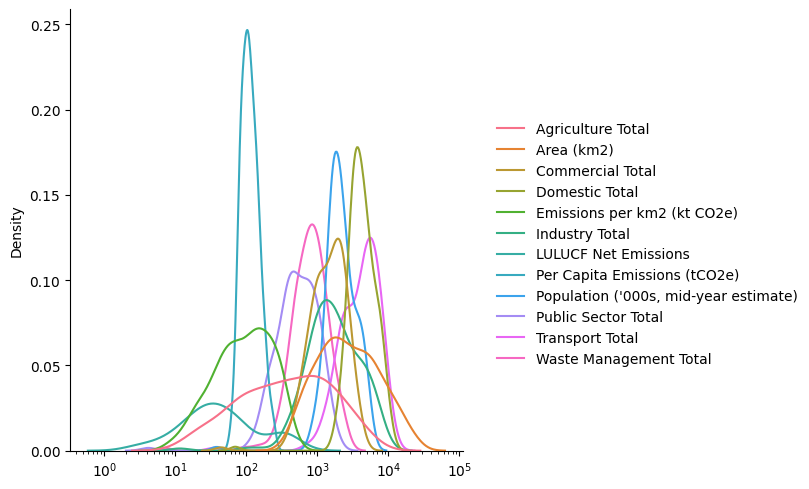

In [390]:

sns.displot(filtered_data, kind='kde', log_scale=(True, False))

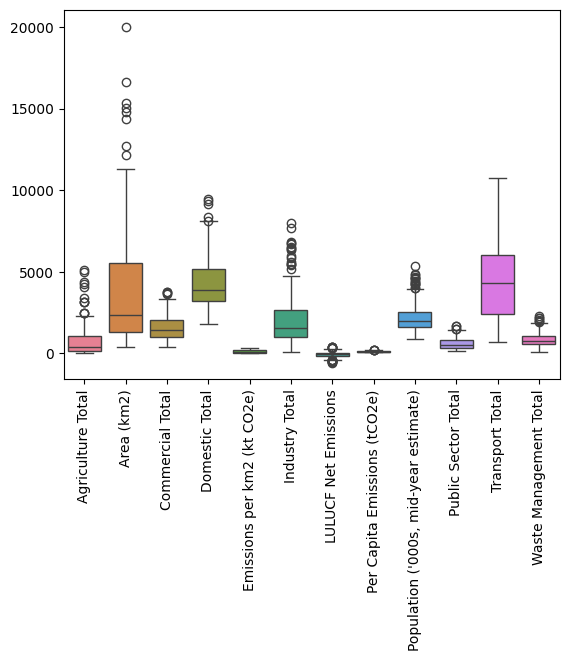

In [391]:

Q1 = plotting.quantile(0.25)
Q3 = plotting.quantile(0.75)
IQR = Q3 - Q1

multiplier = 1
lower_bound = Q1 - multiplier * IQR
upper_bound = Q3 + multiplier * IQR

filtered_data_ = plotting[~((plotting < lower_bound) | (plotting > upper_bound)).any(axis=1)]

sns.boxplot(data=filtered_data_)
plt.xticks(rotation=90)
plt.show()


In [392]:
corr_matrix = filtered_data_.corr()

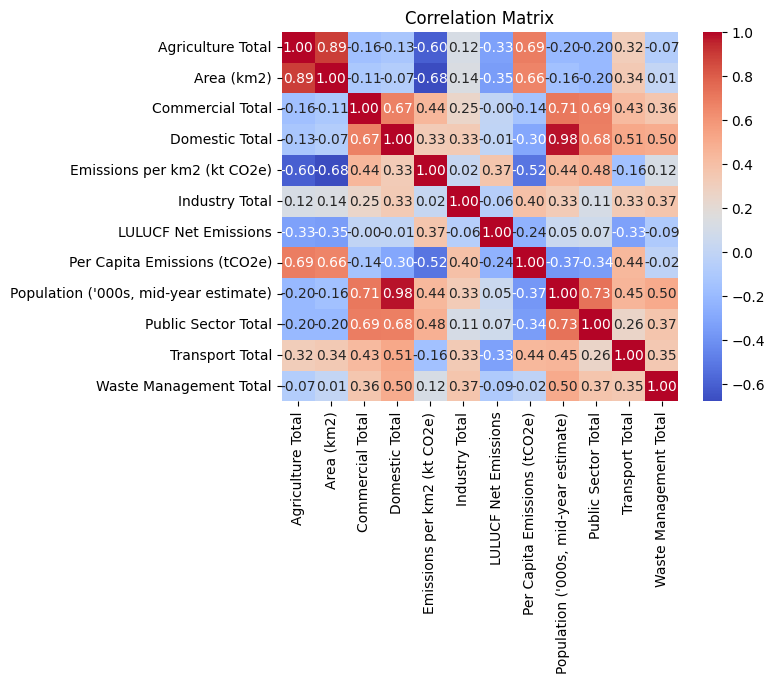

In [393]:

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [394]:
#corr_matrix_regional_emission = filtered_data_.corr()['Grand Total'].sort_values

<h1>Predict Emissions per km2 (Kt CO2e)</h1>

In [395]:
data = all_regions_data_

In [396]:
data.columns

Index(['Local Authority', 'Agriculture Total', 'Area (km2)',
       'Commercial Total', 'Domestic Total', 'Emissions per km2 (kt CO2e)',
       'Industry Total', 'LULUCF Net Emissions',
       'Per Capita Emissions (tCO2e)', 'Population ('000s, mid-year estimate)',
       'Public Sector Total', 'Transport Total', 'Waste Management Total',
       'K32Cluster'],
      dtype='object')

In [397]:
#Random failure
#f = 0.5
#N_failed = int(N * f)

#failed_nodes = rm.sample(V, N_failed)
#print(failed_nodes)

#H = G.copy()
#H.remove_nodes_from(failed_nodes)
#Hcc = sorted(nx.connected_components(H), key=len, reverse=True)
#S_H = len(Hcc[0])/len(G)

#fig, axes = plt.subplots(1, 2, figsize=(18, 7))

#nx.draw_networkx(G, pos, node_size=600, edgecolors='black', ax=axes[0])
#axes[0].set_title('Original')
#axes[0].set_xlabel('S = 1.0', fontsize=12)

#nx.draw_networkx(H, pos, node_size=600, edgecolors='black', ax=axes[1])
#axes[1].set_title('Disrupted')
#axes[1].set_xlabel('S = ' + str(S_H), fontsize=12)

#plt.show()

In [398]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim

# Dropping the non-numeric and target columns
X = data.drop(columns=['K32Cluster', 'Local Authority', 'Emissions per km2 (kt CO2e)'])
y = data['Emissions per km2 (kt CO2e)']

# Normalizing the features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Converting the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

# Reshaping the tensors to have a "channel" dimension
X_train_tensor = X_train_tensor.unsqueeze(1)
X_test_tensor = X_test_tensor.unsqueeze(1)

# Defining the CNN model
class CNN1D(nn.Module):
    def __init__(self, num_features):
        super(CNN1D, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.drop_out = nn.Dropout()
        self.fc1 = nn.Linear(int(num_features / 4) * 32, 1000)
        self.fc2 = nn.Linear(1000, 1)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        out = self.drop_out(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Initialize the CNN model
num_features = X_train_tensor.shape[2]
model = CNN1D(num_features)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Function to perform a training step
def train(model, criterion, optimizer, X_train, y_train):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train).squeeze()
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    return loss.item()

# Training the model
num_epochs = 100
for epoch in range(num_epochs):
    loss = train(model, criterion, optimizer, X_train_tensor, y_train_tensor)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss:.4f}')


Epoch [10/100], Loss: 232744.9844
Epoch [20/100], Loss: 230812.8438
Epoch [30/100], Loss: 225825.6562
Epoch [40/100], Loss: 216951.7656
Epoch [50/100], Loss: 205084.4531
Epoch [60/100], Loss: 203691.6875
Epoch [70/100], Loss: 199112.9375
Epoch [80/100], Loss: 198524.3906
Epoch [90/100], Loss: 197112.0625
Epoch [100/100], Loss: 195159.6094


In [399]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
import torch
import torch.nn as nn
import torch.optim as optim

# Dropping the non-numeric and target columns
X = data.drop(columns=['K32Cluster', 'Local Authority', 'Emissions per km2 (kt CO2e)'])
y = data['Emissions per km2 (kt CO2e)']

# Normalizing the features
#scaler = MinMaxScaler()
#X_scaled = scaler.fit_transform(X)

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Converting the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

# Reshaping the tensors to have a "channel" dimension
X_train_tensor = X_train_tensor.unsqueeze(1)
X_test_tensor = X_test_tensor.unsqueeze(1)

# Defining the CNN model
class CNN1D(nn.Module):
    def __init__(self, num_features):
        super(CNN1D, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.drop_out = nn.Dropout()
        self.fc1 = nn.Linear(int(num_features / 4) * 32, 1000)
        self.fc2 = nn.Linear(1000, 1)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        out = self.drop_out(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Initialize the CNN model
num_features = X_train_tensor.shape[2]
model = CNN1D(num_features)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Function to perform a training step
def train(model, criterion, optimizer, X_train, y_train):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train).squeeze()
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    return loss.item()

# Training the model
num_epochs = 100
for epoch in range(num_epochs):
    loss = train(model, criterion, optimizer, X_train_tensor, y_train_tensor)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss:.4f}')


Epoch [10/100], Loss: 231948.0469
Epoch [20/100], Loss: 225319.9531
Epoch [30/100], Loss: 208894.7344
Epoch [40/100], Loss: 181290.0469
Epoch [50/100], Loss: 167289.6094
Epoch [60/100], Loss: 163665.7031
Epoch [70/100], Loss: 159217.5625
Epoch [80/100], Loss: 140124.3750
Epoch [90/100], Loss: 131109.1875
Epoch [100/100], Loss: 142854.5938


In [400]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
import torch
import torch.nn as nn
import torch.optim as optim

# Dropping the non-numeric and target columns
X = data.drop(columns=['K32Cluster', 'Local Authority', 'Emissions per km2 (kt CO2e)'])
y = data['Emissions per km2 (kt CO2e)']

# Normalizing the features
#scaler = MinMaxScaler()
#X_scaled = scaler.fit_transform(X)

# Standardizing the features
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Converting the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

# Reshaping the tensors to have a "channel" dimension
X_train_tensor = X_train_tensor.unsqueeze(1)
X_test_tensor = X_test_tensor.unsqueeze(1)

# Defining the CNN model
class CNN1D(nn.Module):
    def __init__(self, num_features):
        super(CNN1D, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.drop_out = nn.Dropout()
        self.fc1 = nn.Linear(int(num_features / 4) * 32, 1000)
        self.fc2 = nn.Linear(1000, 1)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        out = self.drop_out(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Initialize the CNN model
num_features = X_train_tensor.shape[2]
model = CNN1D(num_features)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Function to perform a training step
def train(model, criterion, optimizer, X_train, y_train):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train).squeeze()
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    return loss.item()

# Training the model
num_epochs = 100
for epoch in range(num_epochs):
    loss = train(model, criterion, optimizer, X_train_tensor, y_train_tensor)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss:.4f}')


Epoch [10/100], Loss: 229759.5938
Epoch [20/100], Loss: 220822.8906
Epoch [30/100], Loss: 208317.9219
Epoch [40/100], Loss: 196756.8906
Epoch [50/100], Loss: 183299.8594
Epoch [60/100], Loss: 172966.9062
Epoch [70/100], Loss: 158833.5312
Epoch [80/100], Loss: 153022.7812
Epoch [90/100], Loss: 102339.0703
Epoch [100/100], Loss: 70157.3906


In [401]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import RobustScaler
import torch
import torch.nn as nn
import torch.optim as optim

# Dropping the non-numeric and target columns
X = data.drop(columns=['K32Cluster', 'Local Authority', 'Emissions per km2 (kt CO2e)'])
y = data['Emissions per km2 (kt CO2e)']

# Normalizing the features
#scaler = MinMaxScaler()
#X_scaled = scaler.fit_transform(X)

# Standardizing the features
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

#scaler = RobustScaler()
#X_scaled = scaler.fit_transform(X)

scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Converting the data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

# Reshaping the tensors to have a "channel" dimension
X_train_tensor = X_train_tensor.unsqueeze(1)
X_test_tensor = X_test_tensor.unsqueeze(1)

# Defining the CNN model
class CNN1D(nn.Module):
    def __init__(self, num_features):
        super(CNN1D, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2, stride=2))
        self.drop_out = nn.Dropout()
        self.fc1 = nn.Linear(int(num_features / 4) * 32, 1000)
        self.fc2 = nn.Linear(1000, 1)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        out = self.drop_out(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

# Initialize the CNN model
num_features = X_train_tensor.shape[2]
model = CNN1D(num_features)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Function to perform a training step
def train(model, criterion, optimizer, X_train, y_train):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train).squeeze()
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    return loss.item()

# Training the model
num_epochs = 100
for epoch in range(num_epochs):
    loss = train(model, criterion, optimizer, X_train_tensor, y_train_tensor)
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss:.4f}')


Epoch [10/100], Loss: 232900.2031
Epoch [20/100], Loss: 231424.7188
Epoch [30/100], Loss: 227828.4375
Epoch [40/100], Loss: 219131.0156
Epoch [50/100], Loss: 207749.7031
Epoch [60/100], Loss: 200760.8750
Epoch [70/100], Loss: 199725.5312
Epoch [80/100], Loss: 197914.3750
Epoch [90/100], Loss: 196461.2500
Epoch [100/100], Loss: 194419.7656


<h1>Calibration the preditions for Emissions per km2 (Kt CO2e) </h1>

In [402]:
pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.7/484.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 17.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.6 MB/s eta

In [403]:
pip install torch-scatter torch-sparse torch-cluster torch-spline-conv torch-geometric


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 22.5 MB/s eta 0:00:00
  Created wheel for torch-scatter: filename=torch_scatter-2.1.2-cp310-cp310-linux_x86_64.whl size=495091 sha256=2d6edc40c759b3d6b58ef82ed198b16dfe886feaa067f3caba3202a22b835e67
  Stored in directory: /root/.cache/pip/wheels/92/f1/2b/3b46d54b134259f58c8363568569053248040859b1a145b3ce
  Created wheel for torch-sparse: filename=torch_sparse-0.6.18-cp310-cp310-linux_x86_64.whl size=1035675 sha256=e847caa2bed996d48ed140c30548dea07c5766ed8e1c9e797406222d112a6984
  Stored in directory: /root/.cache/pip/wheels/c9/d

In [404]:
data_ = data.drop(columns=['K32Cluster', 'Local Authority', 'Emissions per km2 (kt CO2e)'])
y = data['Emissions per km2 (kt CO2e)']


In [405]:
from pycaret.regression import *
regression_setup = setup(data=data_, target=y, session_id=76)


,Description,Value
0,Session id,76
1,Target,Emissions per km2 (kt CO2e)
2,Target type,Regression
3,Original data shape,"(374, 12)"
4,Transformed data shape,"(374, 12)"
5,Transformed train set shape,"(261, 12)"
6,Transformed test set shape,"(113, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [406]:
best_model = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,36.3439,12290.3848,86.6806,0.7558,0.3905,0.4808,0.3260
knn,K Neighbors Regressor,43.7241,17987.0663,103.1123,0.7206,0.3215,0.3086,0.0740
gbr,Gradient Boosting Regressor,35.1670,15124.5918,93.4851,0.6471,0.3748,0.6232,0.2500
lightgbm,Light Gradient Boosting Machine,56.6292,20733.2245,116.9054,0.5265,0.7641,1.0412,0.2830
dt,Decision Tree Regressor,52.3294,23812.9635,126.3768,0.3635,0.4737,0.6706,0.0360
rf,Random Forest Regressor,40.6635,22775.0800,113.0523,0.3449,0.3755,0.7464,0.5750
lr,Linear Regression,79.9944,13502.9642,110.7995,0.3403,1.0763,2.5329,0.7790
ridge,Ridge Regression,79.9944,13502.9740,110.7995,0.3403,1.0763,2.5329,0.0460
lasso,Lasso Regression,79.9988,13504.7364,110.8063,0.3401,1.0761,2.5343,0.0390
en,Elastic Net,79.9971,13504.0747,110.8037,0.3401,1.0761,2.5338,0.0500


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [407]:
from pycaret.regression import create_model
model = create_model('gbr')  #


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,92.4445,83348.6072,288.7016,0.6186,0.2960,0.2065
1,28.7483,4644.8393,68.1531,0.8605,0.4401,0.4569
2,44.8123,27064.7945,164.5138,0.7132,0.2457,0.2022
3,21.3845,1417.7387,37.6529,0.9289,0.2248,0.1395
4,24.6559,2132.6214,46.1803,0.8374,0.2928,0.2519
5,18.3606,819.7563,28.6314,0.9275,0.2434,0.2000
6,47.4252,14500.1494,120.4166,0.5356,0.6020,0.8725
7,15.9732,838.6038,28.9587,0.9481,0.2029,0.1529
8,14.9070,671.6757,25.9167,0.9660,0.2578,0.1810


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [408]:
tuned_model = tune_model(model)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,85.2203,77365.4751,278.1465,0.6460,0.3046,0.2337
1,24.4133,2526.2520,50.2618,0.9242,0.3988,0.3826
2,40.6449,20767.1969,144.1083,0.7799,0.2881,0.2756
3,29.5296,2112.8584,45.9658,0.8940,0.3980,0.3474
4,30.4558,3011.7765,54.8797,0.7703,0.4268,0.4387
5,24.2705,1737.0366,41.6778,0.8463,0.2335,0.2185
6,37.4095,5355.7870,73.1832,0.8285,0.6238,0.9724
7,17.9383,727.2745,26.9680,0.9550,0.2635,0.2322
8,24.3880,1820.2918,42.6649,0.9079,0.3287,0.3999


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [409]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [410]:
#predictions = predict_model(tuned_model, data=unseen_data)


In [411]:
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import KBinsDiscretizer


n_bins = 10
est = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='quantile')
y_binned = est.fit_transform(y.values.reshape(-1, 1)).astype(int).ravel()

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Model training and validation loop
mse_scores = []
for train_index, test_index in skf.split(X, y_binned):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    mse_scores.append(mse)

# Average Mean Squared Error across all folds
average_mse = np.mean(mse_scores)
print(f'Average Mean Squared Error: {average_mse}')


Average Mean Squared Error: 133070.85746508488


<h1>Grid Search</h1>

In [412]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Define the model
model = RandomForestRegressor()

# Define the parameters grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Best parameters found
print("Best parameters found: ", grid_search.best_params_)

# Best score
print("Best score (neg_mean_squared_error): ", grid_search.best_score_)


Fitting 5 folds for each of 108 candidates, totalling 540 fits


BrokenPipeError: [Errno 32] Broken pipe

In [ ]:
best_model = RandomForestRegressor(
    max_depth=10,
    min_samples_leaf=2,
    min_samples_split=5,
    n_estimators=50
)
best_model.fit(X_train, y_train)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, y_pred)

print(f"MSE: {mse}, RMSE: {rmse}, MAE: {mae}")


In [ ]:
importances = best_model.feature_importances_

feature_names = [f'feature {i}' for i in range(X.shape[1])]
sorted_indices = np.argsort(importances)[::-1]

for i in sorted_indices:
    print(f"{feature_names[i]}: {importances[i]}")


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# Define the model
model = RandomForestRegressor()

# Define the parameters distribution
param_dist = {
    'n_estimators': randint(50, 200),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 5)
}

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1, random_state=42)

# Fit the random search to the data
random_search.fit(X_train, y_train)

# Best parameters found
print("Best parameters found: ", random_search.best_params_)

# Best score
print("Best score (neg_mean_squared_error): ", random_search.best_score_)


<h1>Calibrate Westmidlands</h1>

In [ ]:
data_WM = west_midlands_filtered_columns_pivot.drop(columns=['K=4 Cluster Labels', 'K=3 Cluster Labels'])

from pycaret.regression import *
regression_setup_WM = setup(data=data_WM, target='Emissions per km2 (kt CO2e)', session_id=76)


In [ ]:
best_model = compare_models()

In [ ]:
import pandas as pd
import geopandas as gpd

topo_lad_csv_path = 'https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv'
gdf = pd.read_csv(topo_lad_csv_path)

In [ ]:
import pandas as pd

# Load the datasets
topo_lad_df = pd.read_csv('https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/topo_lad_1.csv')
all_regions_data_ = pd.read_csv('https://raw.githubusercontent.com/OlajideFemi/OlajideFemi.github.io/index/all_regions_data_.csv')

# Merge on the 'Local Authority' column to align the datasets
filtered_gdf_ = all_regions_data_.merge(topo_lad_df, left_on='Local Authority', right_on='LAD13NM')



In [ ]:
topo_lad_df.head()

In [ ]:
import geopandas as gpd
from shapely import wkt

# Convert 'geometry' column from WKT to shapely geometries
topo_lad_df['geometry'] = topo_lad_df['geometry'].apply(wkt.loads)

# Convert the pandas DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(topo_lad_df, geometry='geometry')


In [ ]:
# Calculate centroids
gdf['centroid'] = gdf['geometry'].centroid

# Extract latitude and longitude from the centroids
gdf['latitude'] = gdf['centroid'].y
gdf['longitude'] = gdf['centroid'].x


In [ ]:
import numpy as np

def haversine(lat1, lon1, lat2, lon2):
    # Radius of the Earth in kilometers
    R = 6371.0
    # Convert coordinates from degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    # Compute differences in coordinates
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    # Haversine formula
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    c = 2 * np.arcsin(np.sqrt(a))
    distance = R * c
    return distance

def find_neighbors(gdf, threshold=10):  # Threshold in kilometers
    edges = []
    for index, row in gdf.iterrows():
        lat1, lon1 = row['latitude'], row['longitude']
        for j, candidate_row in gdf.iterrows():
            if index == j:
                continue  # Skip self
            lat2, lon2 = candidate_row['latitude'], candidate_row['longitude']
            distance = haversine(lat1, lon1, lat2, lon2)
            if distance <= threshold:
                edges.append((index, j))
    return edges


In [ ]:

edges = find_neighbors(gdf, threshold=10)


In [ ]:
print(gdf.columns)

In [ ]:
import networkx as nx

# Initialize an empty graph
G = nx.Graph()

G.add_edges_from(edges)

for index, row in gdf.iterrows():
    G.add_node(index, label=row['LAD13NM'])


In [ ]:
import matplotlib.pyplot as plt

# Define positions based on geographic coordinates
pos = {index: (row['longitude'], row['latitude']) for index, row in gdf.iterrows()}

# Draw the graph
plt.figure(figsize=(10, 10))
nx.draw(G, pos, with_labels=False, node_size=50, node_color='lightblue', edge_color='gray', width=1)
plt.title('Graph of Local Authorities in Regions Based on Geographic Proximity')
plt.show()


In [ ]:
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue')
nx.draw_networkx_edges(G, pos, edge_color='black', width=1)
plt.title('Graph of Regions Based on Geographic Proximity')
plt.show()


In [ ]:
with open("graph.mdx", "w") as file:
    for edge in G.edges():
        file.write(f"{edge[0]},{edge[1]}\n")

In [ ]:
nx.write_edgelist(G, "graph.edgelist")

In [ ]:
import random

def random_color():
    return '#%06x' % random.randint(0, 0xFFFFFF)

gdf['color'] = [random_color() for _ in range(len(gdf))]


In [ ]:

degree_centrality = nx.degree_centrality(G)

sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)

betweenness_centrality = nx.betweenness_centrality(G)

sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)

print("Top 5 nodes by degree centrality:")
for node, centrality in sorted_degree_centrality[:5]:
    print(f"Node {node}: {centrality}")

print("\nTop 5 nodes by betweenness centrality:")
for node, centrality in sorted_betweenness_centrality[:5]:
    print(f"Node {node}: {centrality}")


In [ ]:

from networkx.algorithms import community

communities_generator = community.girvan_newman(G)

top_level_communities = next(communities_generator)

communities = sorted(map(sorted, top_level_communities))

for i, community in enumerate(communities):
    print(f"Community {i}: {community}")
